In [1]:
import os
from aggregation import Aggregator, get_subject_image
from aggregation import SOL
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.dates import DateFormatter
import numpy as np
from scipy.cluster.hierarchy import dendrogram
plt.style.use('default')
%matplotlib inline

Broken libmagic installation detected. The python-magic module is installed but can't be imported. Please check that both python-magic and the libmagic shared library are installed correctly. Uploading media other than images may not work.


In [2]:
aggregator = Aggregator('reductions/point_reducer_hdbscan_box_the_jets.csv', 
                        'reductions/shape_reducer_optics_box_the_jets.csv')
aggregator.load_extractor_data('extracts/point_extractor_by_frame_box_the_jets.csv',
                               'extracts/shape_extractor_rotateRectangle_box_the_jets.csv')
sol = SOL('SOL/SOL_Tc_stats.csv', aggregator)

SOL_small,SOL_subjects,filenames0,times,Num,start,end,notes=np.loadtxt('SOL/SOL_{}_stats.csv'.format('Tc'),delimiter=',',unpack=True,dtype=str)
Num=Num.astype(float)

subjects,date,ans,agreement,subject_file, subject_sol=np.loadtxt('SOL/subjects_{}.csv'.format('Tc'),delimiter=',',unpack=True,dtype=str)
date=np.array(date,dtype='datetime64')
subjects=subjects.astype(int)
agreement=agreement.astype(float)

path_old=os.getcwd()

In [3]:
#This part will only work on the Foxsiadmins computer since it needs the visual file saved in the database 
path_database='/Users/pjol/Documents/Zooniverse/'
os.chdir(path_database)

from solar.database.tables import Visual_File

def solar_conversion(file,x,y):
    filename = file
    vv = Visual_File.select().where(Visual_File.file_name==filename)
    #Change de Y pixels to Height-Y since the pixel frame is defined inverted from the Zooniverse processor calculation
    y=vv[0].height-y
    x_pix,y_pix=x,y
    wc = Visual_File.world_from_pixel(vv[0], float(x_pix), float(y_pix))
    solar_x,solar_y = wc.Tx,wc.Ty
    x_sun=str(solar_x).split('arcsec')[0]
    y_sun=str(solar_y).split('arcsec')[0]
    return float(x_sun),float(y_sun)

def get_solar_distance(file,pair):
    solw1=solar_conversion(file,pair[0][0],pair[0][1])
    solw2=solar_conversion(file,pair[1][0],pair[1][1])
    #Euclidean distance
    distance=np.sqrt((solw1[0]-solw2[0])**2 +(solw1[1]-solw2[1])**2 )
    return distance


In [4]:
def jet_height_width_plot(self,ID,height,width,obs_time,save=False):
    '''
    Plot the heigth and width evolution over time in a Jet cluster event

    height: np.array with height box per subject
    width: np.array with width box per subject
    '''

    fig, (ax1, ax2) = plt.subplots(2,dpi=150,figsize=(4.8,4),sharex=True)
    x1, y1 = zip(*sorted(zip(obs_time, height)))
    x2, y2 = zip(*sorted(zip(obs_time, width)))
    ax1.plot(x1,y1,color='red')
    ax2.plot(x2,y2,color='red')
    date_form = DateFormatter("%H:%M")
    ax2.xaxis.set_major_formatter(date_form)
    plt.xticks(rotation=45)
    ax1.set_ylabel('Height (\'\')')
    ax1.set_title('Jet '+str(obs_time[0]))
    #ax1.set_title(f'Jet ID:{ID} '+str(obs_time[0]))
    ax2.set_ylabel('Width (\'\')')
    ax1.set_ylim(0,np.max(np.maximum(height,width))+30)
    ax2.set_ylim(0,np.max(np.maximum(height,width))+30)
    if save==True:
        path = path_old+'/SOL/Jet_Box_size/'
        #check if folder for plots exists
        isExist = os.path.exists(path)
        if not isExist: 
          os.makedirs(path)
          print("Jet_Box directory is created")

        plt.savefig(path+'Jet'+str(ID)+'_'+str(obs_time[0]).replace(':','-')+'.png')

    plt.show()

In [5]:
Jet_clusters=np.array([])

for s in range(len(SOL_small)):#len(SOL_small)
    if s==1:
        continue
    SOL_event=SOL_small[s]
    print(f'SOL_small[{s}] ', SOL_event)
    try:
        clusters, distance_met, point_met, box_met = sol.filter_jet_clusters(SOL_event, eps=3.0, time_eps=2.0)
    except:
        print(f"No jets in {SOL_event}")
        continue
    Jet_clusters=np.append(Jet_clusters,clusters)
    for j, cluster in enumerate(clusters):
        print(j, len(cluster.jets))
        
        

SOL_small[0]  SOL2010-07-29T15:15:15L159C039
No jets in SOL2010-07-29T15:15:15L159C039
SOL_small[2]  SOL2011-03-29T19:55:11L196C115
Using eps=3.0 and time_eps=60.0 min
0 2
SOL_small[3]  SOL2011-04-01T03:00:11L222C115
Using eps=3.0 and time_eps=60.0 min
0 8
SOL_small[4]  SOL2011-04-07T19:10:00L011C085
Using eps=3.0 and time_eps=60.0 min
0 3
1 1
2 1
SOL_small[5]  SOL2011-04-07T23:50:00L037C115


/Users/pjol/SolarJets/BoxTheJets/aggregation/workflow.py:843: RuntimeWarning: invalid value encountered in sqrt
  box_gamma[i] = np.sqrt(1. - csg[i])
/Users/pjol/SolarJets/BoxTheJets/aggregation/SOL_class.py:285: RuntimeWarning: divide by zero encountered in double_scalars
  point_metric[k,j] = point_dist/np.mean([start_confidences[j], start_confidences[k]])


Using eps=3.0 and time_eps=60.0 min
0 1
1 2
2 1
3 1
4 1
5 1
6 3
7 1
8 1
9 1
10 2
11 1
12 1
13 4
14 1
15 1
16 1
17 3
18 1
19 2
20 1
21 2
22 2
23 1
24 1
25 1
26 1
27 2
SOL_small[6]  SOL2011-01-20T09:00:09L289C165
Using eps=3.0 and time_eps=60.0 min
0 8
SOL_small[7]  SOL2011-01-20T22:00:09L353C074
Using eps=3.0 and time_eps=60.0 min
0 1
1 2
2 1
3 2
4 1
5 1
6 1
7 1
8 1
9 1
10 2
11 1
12 1
13 1
14 1
15 1
16 1
SOL_small[8]  SOL2011-01-24T22:15:09L358C011
Using eps=3.0 and time_eps=60.0 min
0 11
1 1
2 5
3 1
4 2
5 1
SOL_small[9]  SOL2011-01-26T01:52:21L007C038
Using eps=3.0 and time_eps=60.0 min
0 9
1 1
2 1
3 1
4 2
SOL_small[10]  SOL2011-02-13T04:57:46L131C056
Using eps=3.0 and time_eps=60.0 min
0 8
1 2
SOL_small[11]  SOL2011-02-14T05:31:16L307C065
Using eps=3.0 and time_eps=60.0 min
0 9
1 1
2 1
3 1
SOL_small[12]  SOL2011-03-01T12:18:04L189C096
No jets in SOL2011-03-01T12:18:04L189C096
SOL_small[13]  SOL2011-05-26T18:00:02L117C016
Using eps=3.0 and time_eps=60.0 min
0 3
1 1
2 1
SOL_small[14]  S

Using eps=3.0 and time_eps=60.0 min
0 12
1 3
2 3
SOL_small[78]  SOL2013-04-24T11:54:03L291C054
Using eps=3.0 and time_eps=60.0 min
0 6
1 1
SOL_small[79]  SOL2013-01-01T01:45:35L245C022
No jets in SOL2013-01-01T01:45:35L245C022
SOL_small[80]  SOL2013-01-15T18:00:03L192C010
Using eps=3.0 and time_eps=60.0 min
0 2
1 1
2 1
SOL_small[81]  SOL2013-01-16T21:00:35L190C016
Using eps=3.0 and time_eps=60.0 min
0 2
1 1
SOL_small[82]  SOL2013-01-18T17:50:23L162C015
Using eps=3.0 and time_eps=60.0 min
0 2
1 1
2 1
3 1
SOL_small[83]  SOL2013-01-29T02:00:03L230C115
Using eps=3.0 and time_eps=60.0 min
0 3
1 6
SOL_small[84]  SOL2013-09-11T18:50:23L240C097
No jets in SOL2013-09-11T18:50:23L240C097
SOL_small[85]  SOL2013-09-12T17:30:35L199C017
No jets in SOL2013-09-12T17:30:35L199C017
SOL_small[86]  SOL2013-09-12T21:30:35L118C043
Using eps=3.0 and time_eps=60.0 min
0 3
1 1
SOL_small[87]  SOL2013-09-21T18:20:23L355C092
Using eps=3.0 and time_eps=60.0 min
0 3
1 1
SOL_small[88]  SOL2013-09-22T14:30:35L160C071

Jet start
Start base 244.15 -206.137
0.13408893202851196


Start base 252.03 -280.261
0.7331655692446822


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


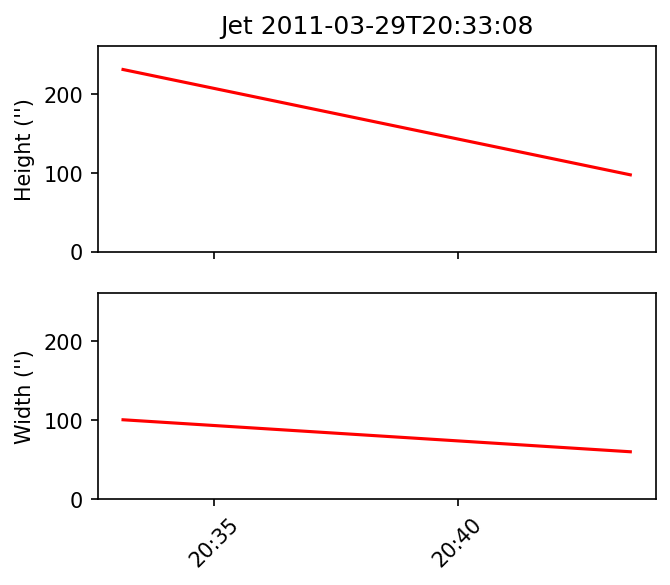

Jet start
Start base 754.417 -268.472
0.5961281036577458


Start base 693.845 -235.259
0.2592088776517396


Start base 699.828 -232.312
0.2119056594020485


Start base 694.605 -229.875
0.41999800478150834


Start base 698.282 -237.879
0.21966438065175464


Start base 699.127 -235.941
0.23235263961426214


Start base 700.406 -243.253
0.23026097797752348


Start base 691.887 -230.687
0.6929327445112141


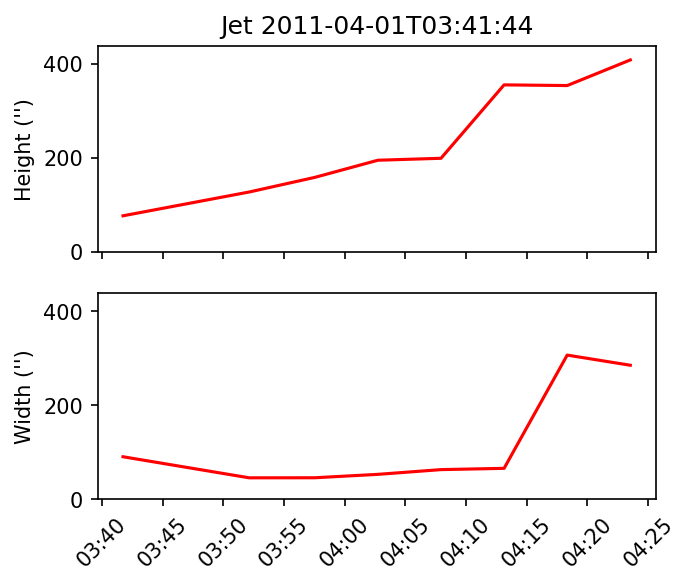

Jet start
Start base -604.739 232.022
0.5510380746108533


Start base -652.701 280.663
0.4298850268616323


Start base -663.496 267.506
0.5868238833639122


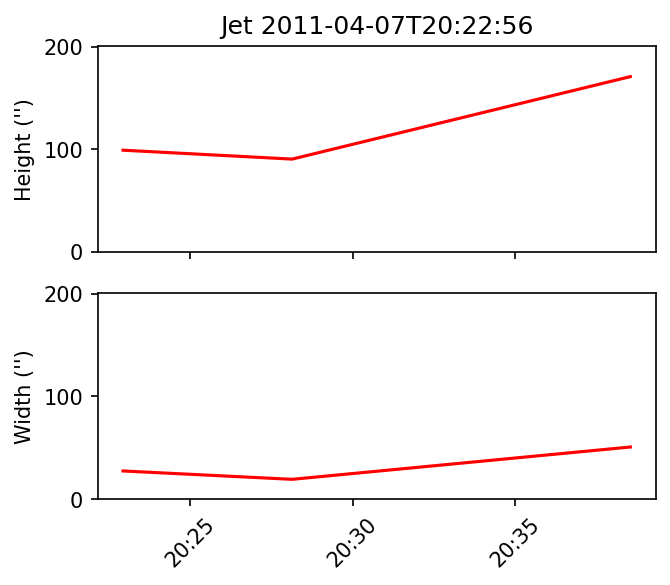

Jet start
Start base -812.73 293.967
0.5387267867733948


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -812.73 293.967
0.3139534482585454


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -352.0 -315.769
0.8149544688001287


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -276.22 -208.779
0.08131786284229077


Start base -275.525 -211.621
0.29924157415497743


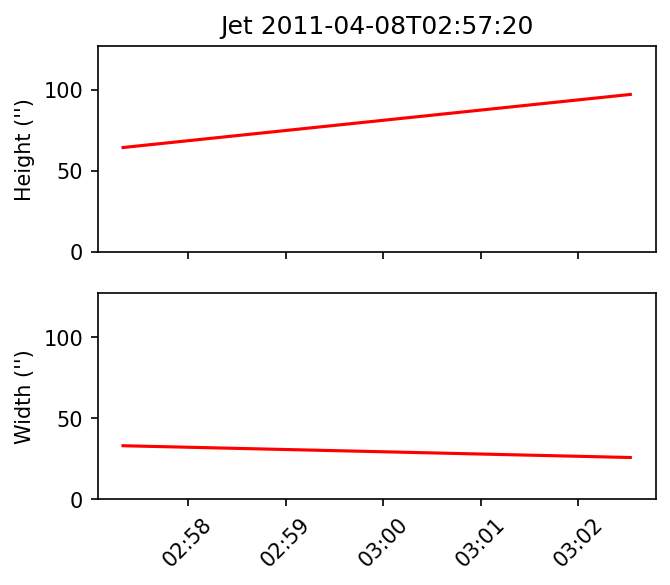

Jet start
Start base -255.561 -249.967
1.0002321834009247


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -344.701 -308.237
0.2972772135735997


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -343.481 -306.095
1.0000000287681312


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -287.091 -313.262
0.874090707035457


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -310.201 -298.181
0.4490868965557116


Start base -303.039 -265.027
0.48351805951672894


Start base -325.614 -357.857
0.9388034202584993


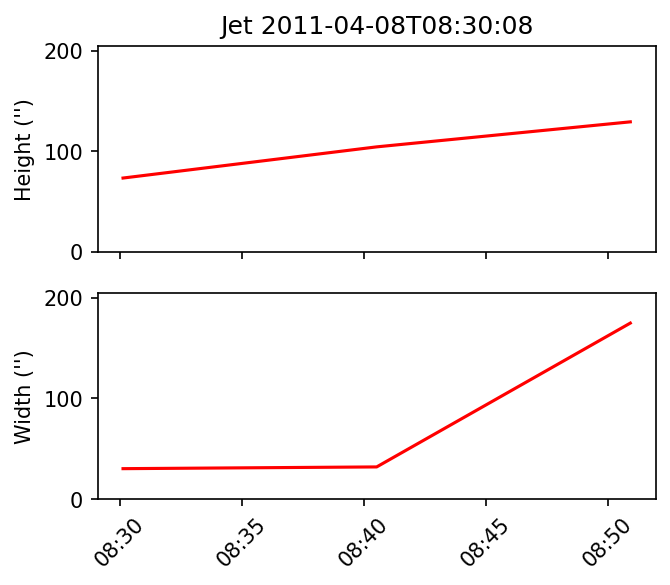

Jet start
Start base -310.201 -298.181
1.0000190179616177


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -312.487 -304.73
0.6250403836364163


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -297.97 -298.937
0.7261018354588482


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -298.496 -302.449
0.3572523413124217


Start base -290.173 -299.516
0.36954864066415677


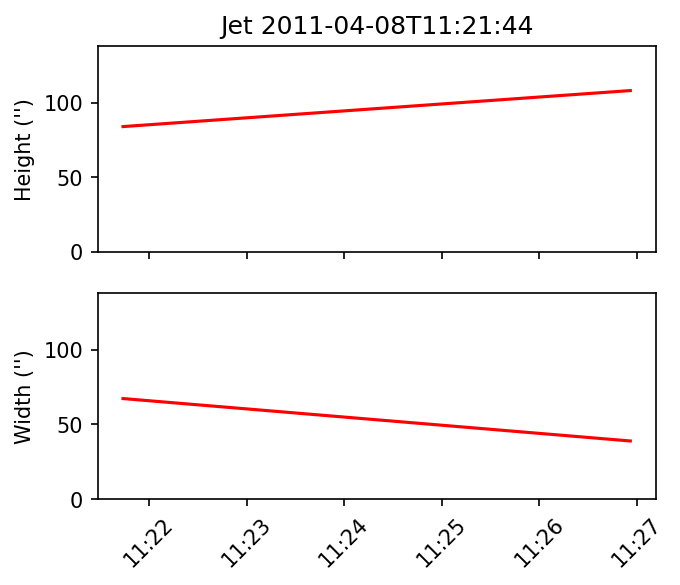

Jet start
Start base -276.693 -308.584
0.36879757200620494


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -329.887 -325.228
1.0624994320575392


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -262.38 -305.376
0.44340221341309355


Start base -252.087 -298.379
0.28966862643302227


Start base -251.361 -297.726
0.31326220448231773


Start base -261.556 -301.642
0.8576395202824659


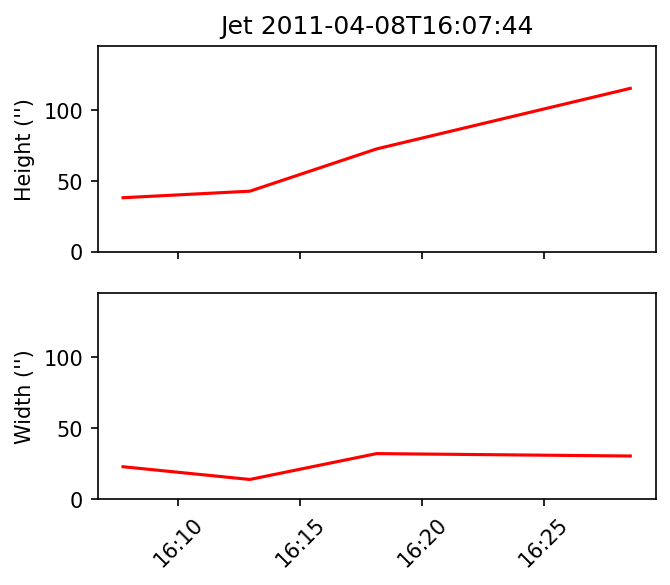

Jet start
Start base -249.324 -299.085
0.28210049112909663


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -247.409 -298.747
0.4242344648996904


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -247.409 -298.747
0.20098740876955137


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -244.971 -300.142
0.223403150649602


Start base -248.263 -301.188
0.40862537846153146


Start base -325.378 -315.971
0.9189246847347382


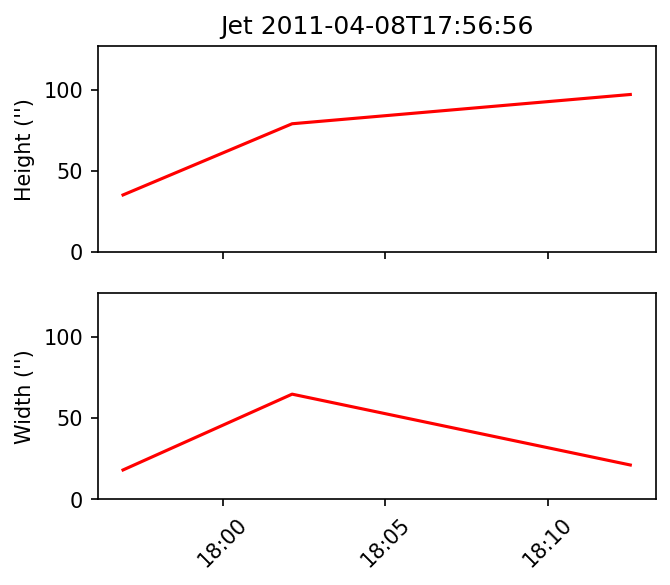

Jet start
Start base -239.222 -398.132
0.246278207501834


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -242.871 -300.519
0.40073459605284817


Start base -242.756 -302.731
0.4988842102691123


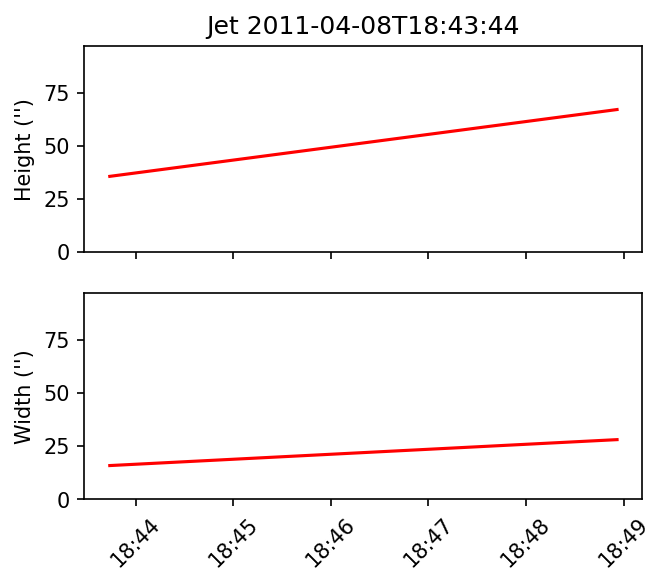

Jet start
Start base -235.57 -298.557
0.3784433425821548


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -218.894 -296.904
0.4202771523544327


Start base -323.163 -338.602
1.0000004892031347


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


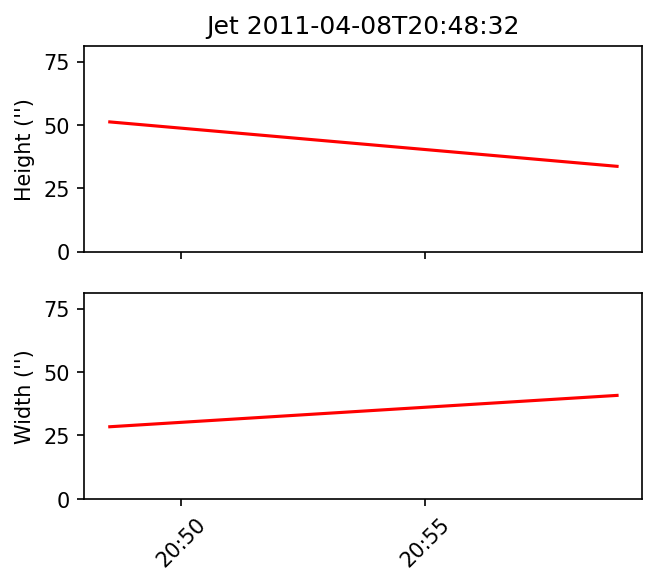

Jet start
Start base -272.775 -366.002
0.6983854774343546


Start base -215.405 -297.567
0.5903759787461436


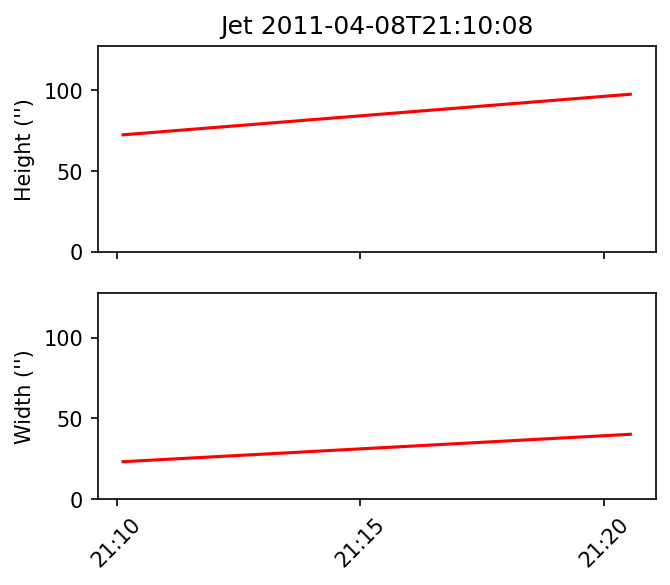

Jet start
Start base -214.314 -298.881
0.7829175147781029


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -298.645 -279.162
0.8740635553596833


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -189.474 -299.639
0.7371845510799515


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -189.474 -299.639
0.6610370892096051


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -128.23 -216.293
0.9161690159329462


Start base -171.786 -306.21
0.9378734925719652


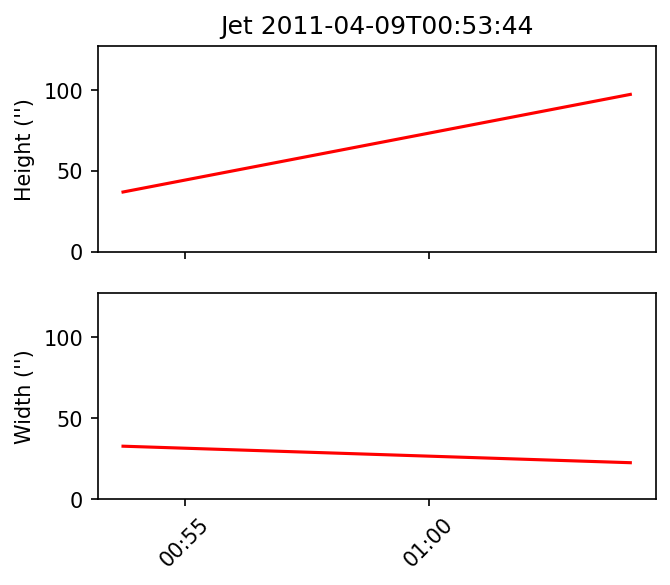

Jet start
Start base -235.236 -953.295
0.4572619758654682


Start base -234.793 -949.794
0.08345585985153617


Start base -232.677 -947.271
0.2564874131460862


Start base -231.754 -949.15
0.2679247242387243


Start base -216.237 -947.12
0.2319246083861291


Start base -215.555 -973.281
0.28240651407651157


Start base -226.115 -966.366
0.1644178319796348


Start base -230.235 -966.794
0.15375148667431654


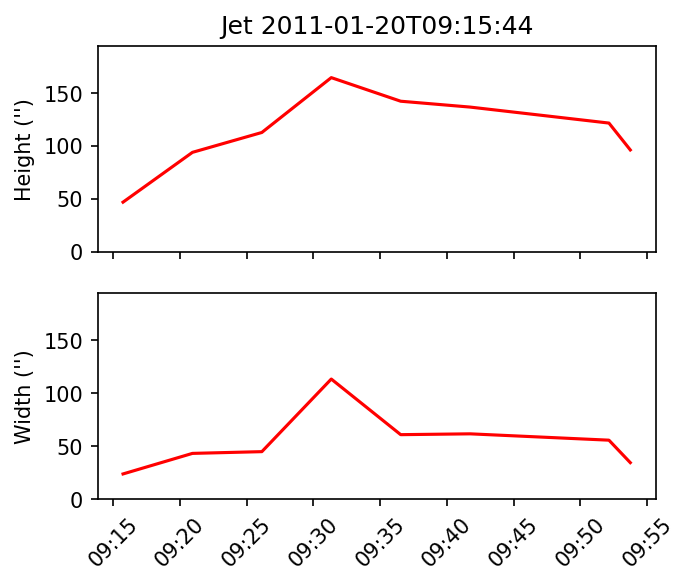

Jet start
Start base -196.707 548.381
0.9444711655872414


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -144.75 383.548
0.21725245000067903


Start base -142.5 389.26
0.5092567126751046


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


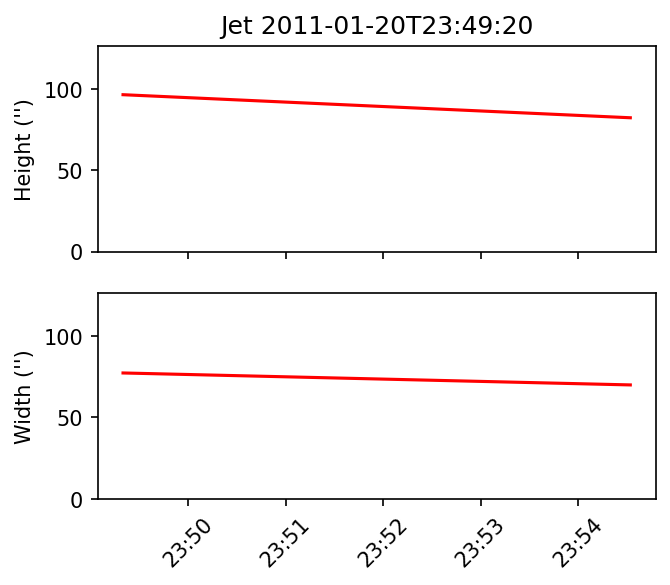

Jet start
Start base -42.9815 327.255
0.23627609569419758


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -100.466 387.028
0.46278636447815164


Start base -103.718 392.769
0.7649392169089662


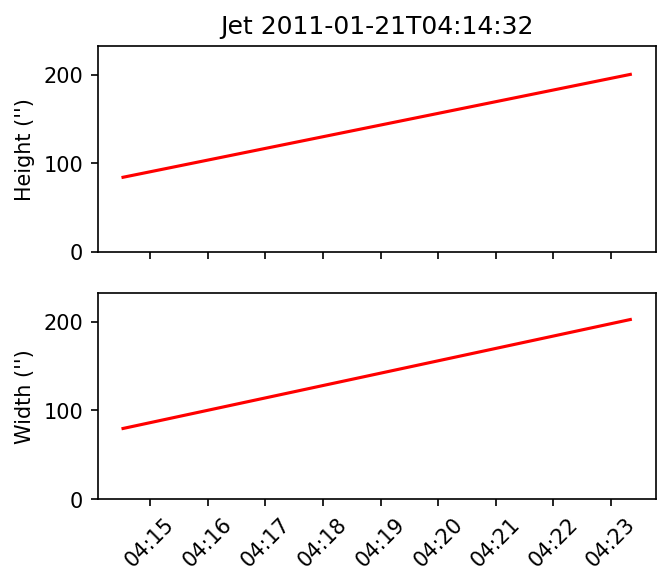

Jet start
Start base -76.3124 375.152
0.400969419010562


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -205.726 506.347
0.759821116949843


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -11.371 475.01
0.5935537499777092


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -71.8565 382.097
0.7874990487947563


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 19.886 413.306
1.0000054933902323


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -57.7166 406.354
0.7327889531276611


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -26.5456 371.773
0.4689146241353525


Start base -62.926 415.26
0.971315116174506


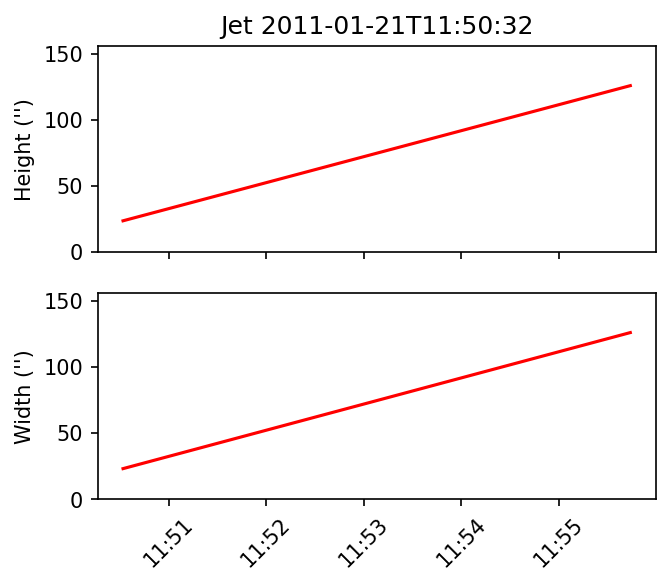

Jet start
Start base -26.5456 371.773
0.24195107073701655


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 89.3757 477.729
0.6759983781851254


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -22.2057 378.997
0.7444666207267168


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -22.3935 386.875
0.6487780461293475


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -107.48 486.805
0.37453421000329434


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 82.2071 482.021
0.5197764697644303


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 189.496 971.947
0.5148074610184884


Start base 192.934 975.256
0.40257077893198906


Start base 162.527 977.235
0.43804457271578806


Start base 232.902 960.865
0.09477723047179434


Start base 236.457 962.208
0.19571702153135334


Start base 237.409 962.43
0.20601807655946486


Start base 246.661 963.756
0.6919749678473924


Start base -7.96181 994.367
0.08431772513574042


Start base 13.4706 971.926
0.7322452471969562


Start base 16.4876 977.961
0.21505651306984508


Start base 16.7876 976.183
0.5899293795801558


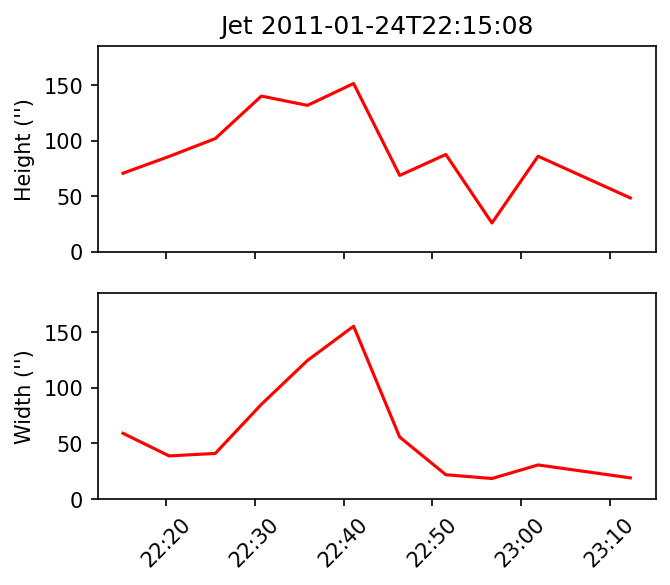

Jet start
Start base 225.991 963.137
0.20251859311748782


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 69.4216 982.994
0.7406898421377909


Start base -4.9731 992.3
0.3076753357759946


Start base -7.22323 988.99
0.15837990250464296


Start base 16.4876 977.961
0.23935344362454614


Start base 14.3815 992.352
0.27118887450198315


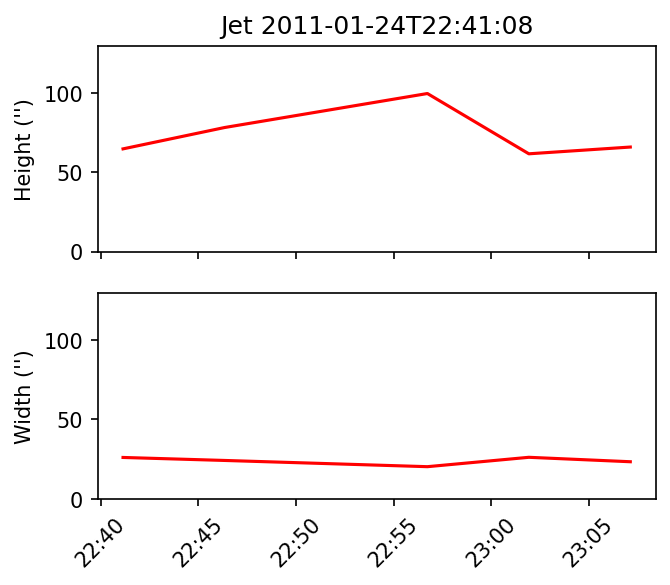

Jet start
Start base 42.8337 984.985
0.8283350902443097


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 211.526 967.483
0.5593583699863819


Start base 209.354 965.621
0.2653902109020369


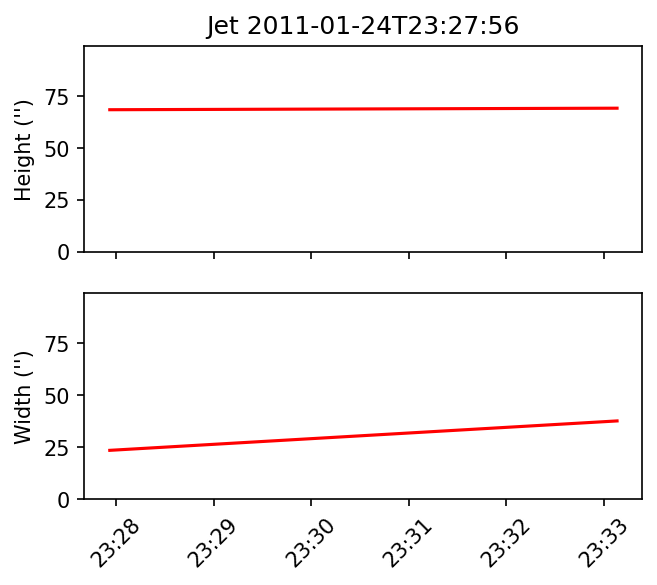

Jet start
Start base 203.336 960.791
0.5676277837671133


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 624.916 759.58
0.3921940987987575


Start base 599.651 776.841
0.10908787653757991


Start base 597.006 783.73
0.14442429878536672


Start base 601.182 788.565
0.16608952947388345


Start base 601.352 788.548
0.17109725480154056


Start base 632.294 771.063
0.11726201698987589


Start base 606.348 781.841
0.12331653575619737


Start base 633.192 753.011
0.62528215902479


Start base 556.009 820.441
0.29211562483387027


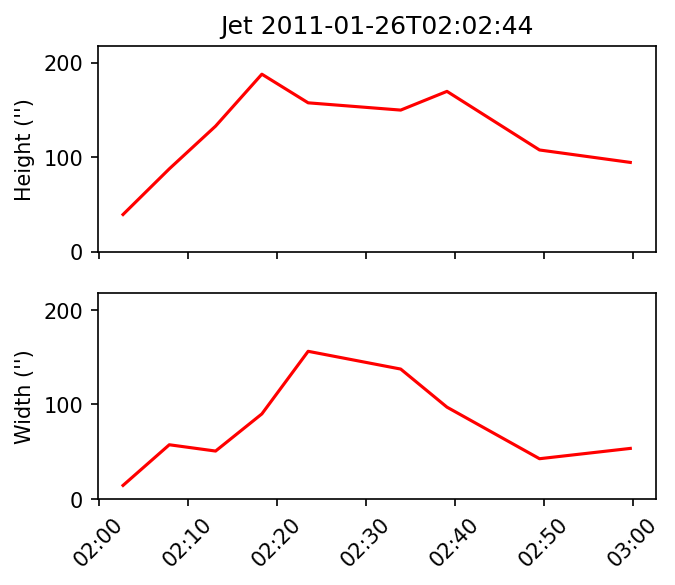

Jet start
Start base 624.916 759.58
0.25216765884888565


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 556.009 820.441
0.5329945494588999


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 556.009 820.441
0.3651439198821835


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 590.438 795.556
0.7466450078166058


Start base 589.89 794.223
0.3905298214734206


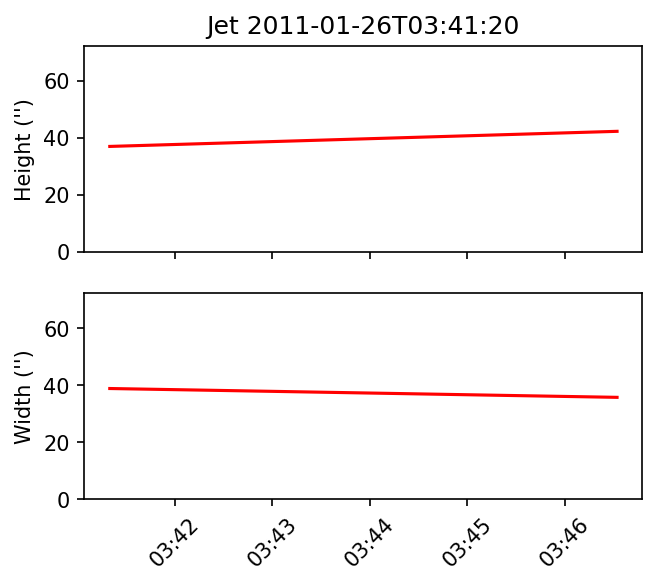

Jet start
Start base 852.927 491.796
0.19912127483137487


Start base 852.666 489.027
0.2996950203909882


Start base 854.818 491.301
0.20212255824905118


Start base 850.897 490.412
0.3228242502299283


Start base 851.073 492.605
0.17676905908759147


Start base 853.165 489.781
0.18769838114431342


Start base 860.71 490.907
1.0157629955168692


Start base 829.164 538.53
0.7415655406147309


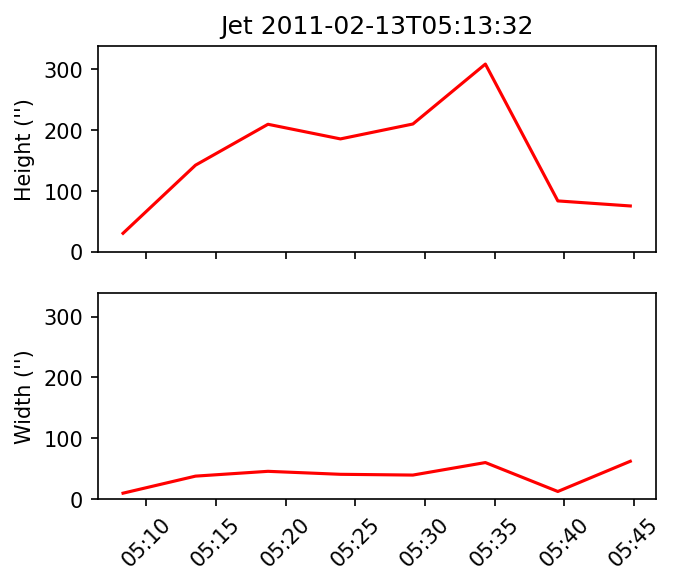

Jet start
Start base 860.71 490.907
0.27373767731447785


Start base 889.916 662.048
1.0000110713584254


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


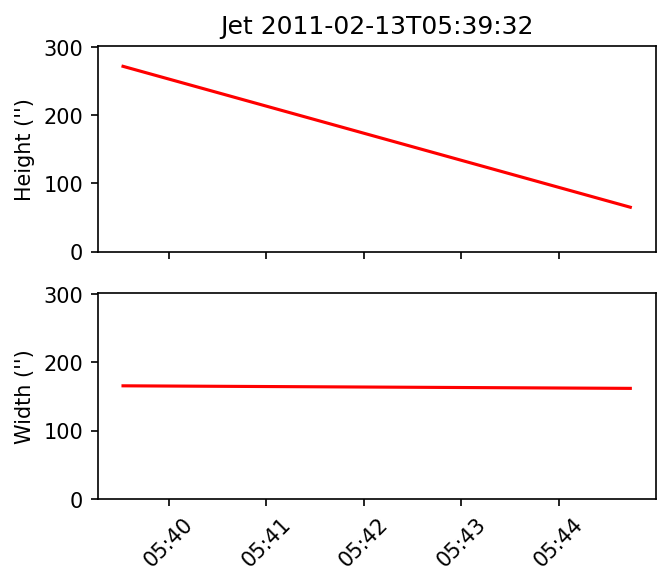

Jet start
Start base -852.557 485.88
0.23973067201627338


Start base -824.997 474.367
0.18072279056827972


Start base -831.665 469.698
0.2905021394381131


Start base -831.247 466.567
0.1528912363140645


Start base -865.718 454.521
0.1950510453509423


Start base -859.828 455.282
0.1654241975398248


Start base -869.214 453.07
0.2169618244684163


Start base -837.236 458.729
0.23810316802360976


Start base -855.981 480.911
0.18977238224429746


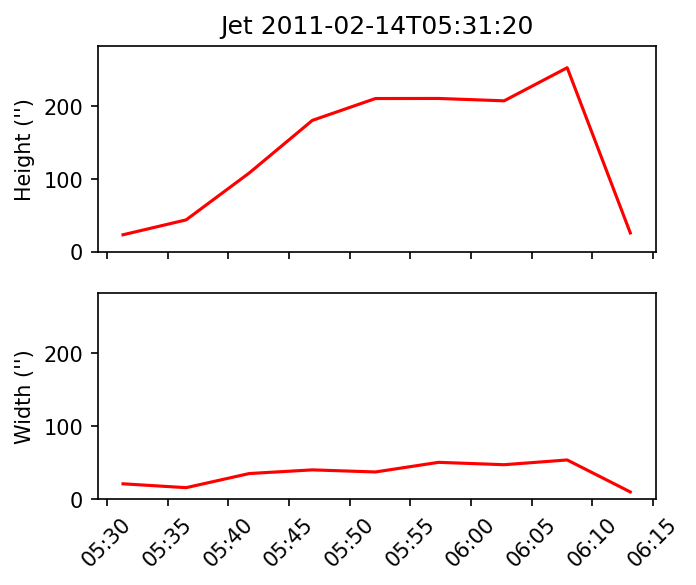

Jet start
Start base -852.557 485.88
1.0000000499215478


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -855.981 480.911
0.4356741152813834


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -855.981 480.911
0.9841776459785997


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -74.4699 890.068
0.6361593364626317


Start base -73.3118 894.223
0.8249936435748654


Start base -75.7192 890.036
0.7490907410309914


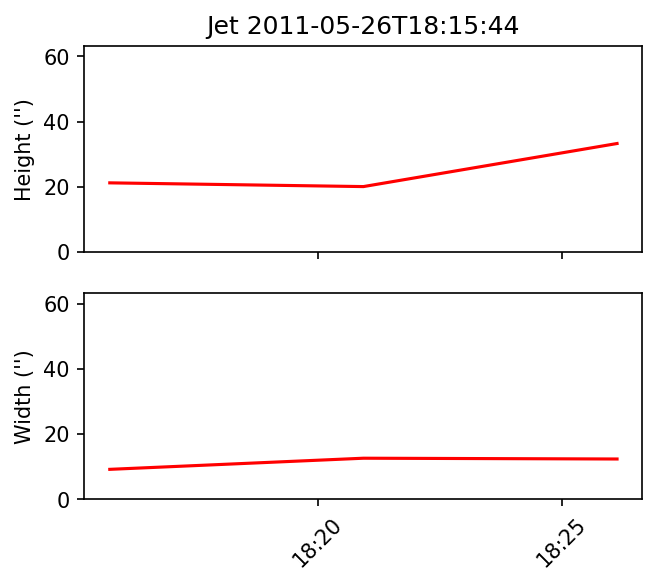

Jet start
Start base -79.2028 939.422
0.7334191762441027


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -67.6404 896.607
1.000000000000241


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -913.471 279.235
0.43629032409492896


Start base -902.102 279.091
1.0000002406375104


Start base -937.74 240.465
0.48593652983908886


Start base -908.343 297.743
0.7781639544526594


Start base -922.642 231.737
0.7151000583330819


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


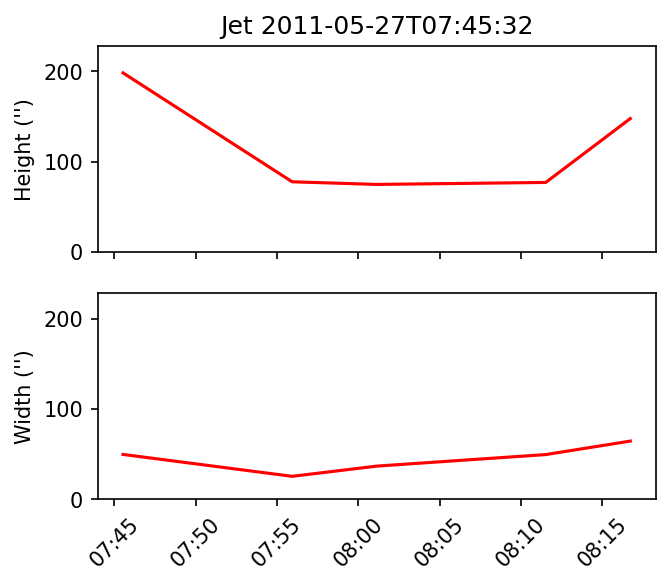

Jet start
Start base -902.102 279.091
0.7912751989777019


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -922.372 234.174
0.487545842093864


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -906.627 287.101
0.6831542253476852


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -939.597 253.653
0.11258953825081203


Start base -920.018 243.311
0.1914536635075881


Start base -919.85 241.187
0.25380820467201143


Start base -923.26 238.442
0.25145846474648537


Start base -923.025 238.115
0.626120670949902


Start base -929.408 235.251
0.18500274640710007


Start base -928.27 237.095
0.3962151353785529


Start base -925.237 236.206
0.2537516457176615


Start base -923.604 243.135
0.18581953977767135


Start base -925.091 241.336
0.24815512391776964


Start base -923.623 236.409
0.13438577482511785


Start base -921.029 241.423
0.18562327458681813


Start base -918.545 247.971
0.5112633519396228


Start base -920.719 243.189
0.19904924109020095


Start base -918.101 249.946
0.4277350738569963


Start base -919.061 249.637
0.18508120418519536


Start base -917.23 276.134
0.745779195651618


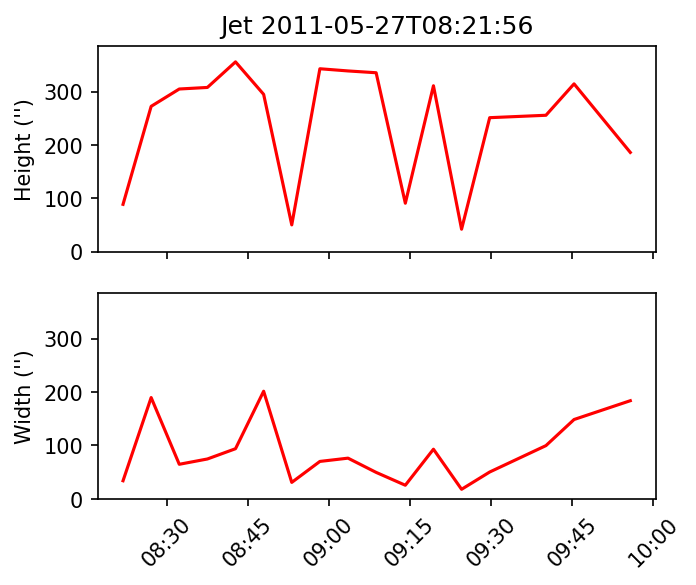

Jet start
Start base -919.85 241.187
1.000000013428122


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -928.27 237.095
0.49684589949975505


Start base -925.237 236.206
0.28027648363247704


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


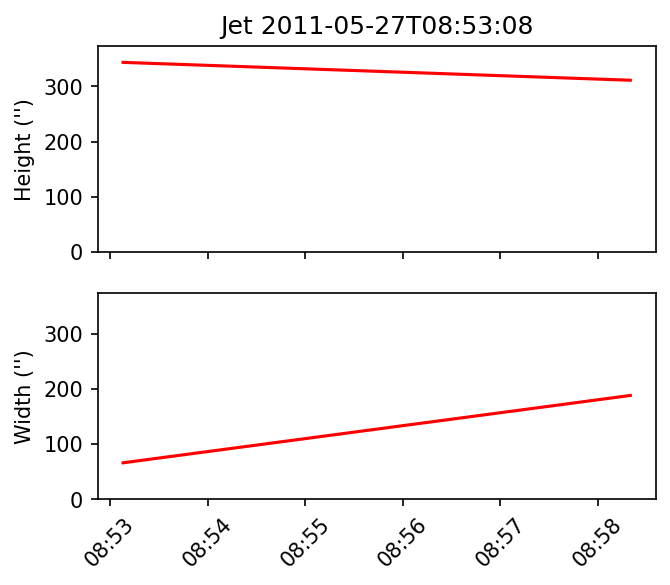

Jet start
Start base -923.623 236.409
0.24111352990850973


Start base -918.545 247.971
0.645463201435902


Start base -920.719 243.189
0.2817398902817227


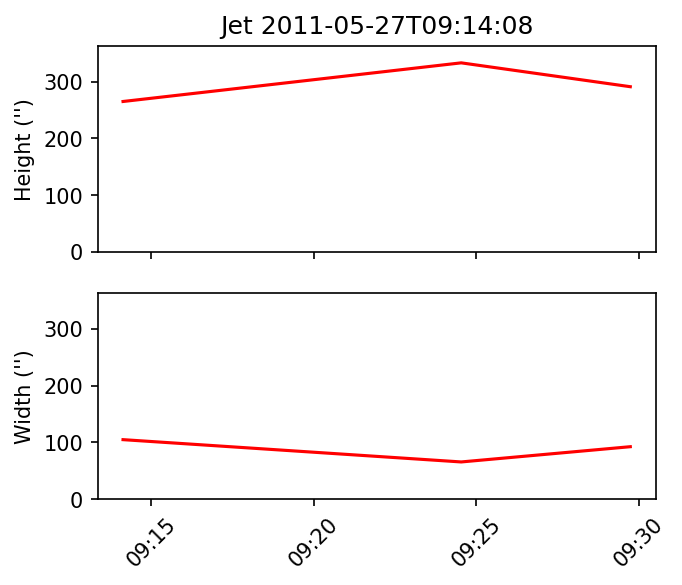

Jet start
Start base -920.569 248.449
0.5811031136133769


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -889.652 240.241
0.9816736499686969


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -911.628 254.301
0.7938903989046414


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -911.377 292.632
0.757049318881245


Start base -913.547 290.308
0.9237994707570897


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


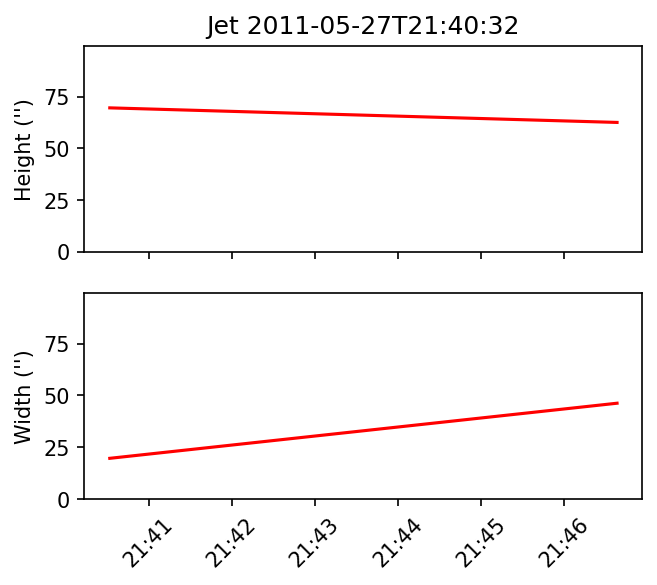

Jet start
Start base -917.894 260.183
0.3375848712717419


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -921.456 248.457
0.22220892543711934


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -921.456 248.457
0.49838178463440297


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -914.742 265.446
0.7220037922253382


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -917.0 248.901
0.31911345477639996


Start base -915.428 258.824
0.18625079063127328


Start base -918.011 259.341
0.30130152400400667


Start base -926.24 238.121
0.23929178862094844


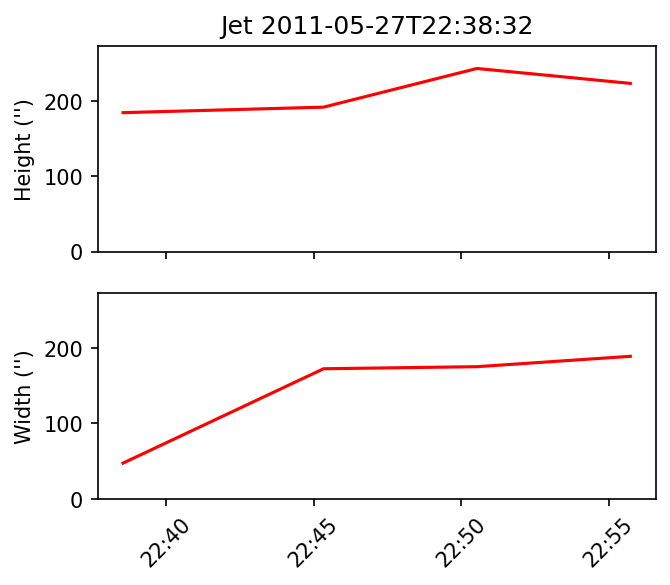

Jet start
Start base -917.0 248.901
0.9988580002097097


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -911.893 309.539
0.29415006212241024


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -917.123 255.349
0.41009101923237173


Start base -921.72 245.363
0.2577626882934911


Start base -920.413 246.487
0.3177265734180254


Start base -922.938 245.316
0.3859998629482975


Start base -922.76 248.465
0.4936518803968107


Start base -921.171 246.355
0.3655812225007597


Start base -915.475 258.307
0.33524208543877304


Start base -914.597 257.207
0.7914672226425502


Start base -916.991 256.32
0.6056354510246883


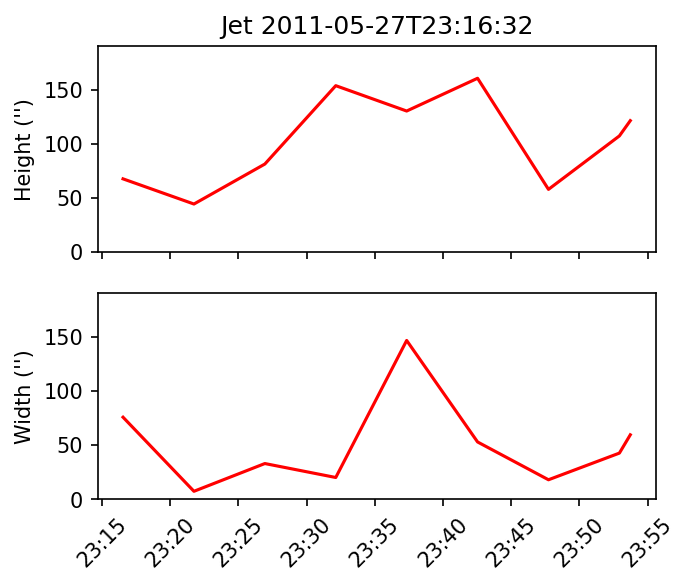

Jet start
Start base -916.991 256.32
0.49142897685949594


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -915.697 258.714
0.2775714255128528


Start base -916.726 258.854
0.3044520044073506


Start base -918.224 259.063
0.24192285363564564


Start base -915.812 262.352
0.6401360857008045


Start base -915.355 258.478
0.2671799368836221


Start base -916.783 260.656
0.6018808782788355


Start base -923.315 245.603
0.2789336664740153


Start base -914.76 256.417
0.18407611235048768


Start base -915.16 262.552
0.33270314709312904


Start base -921.688 251.712
0.3659728175917442


Start base -921.031 255.458
0.4426817954256066


Start base -917.08 258.461
0.35932603386962486


Start base -914.152 264.156
0.24217252156375996


Start base -914.531 264.834
0.41062006390586225


Start base -916.172 258.559
0.46425592903711493


Start base -915.311 260.785
0.29949872203868433


Start base -916.382 261.677
0.1549589994910814


Start base -915.622 259.849
0.11802520897143522


Start base -918.542 260.775
0.721540618025401


Start base -921.362 253.706
0.31186846605597307


Start base -918.876 255.688
0.24588141342127862


Start base -917.951 254.605
0.289919902422046


Start base -915.071 261.137
0.15991504912148086


Start base -916.325 262.59
0.08432466500739011


Start base -913.85 267.863
0.12160115875320131


Start base -911.39 272.369
0.06778696226645037


Start base -912.292 269.058
0.7214939055125512


Start base -913.301 268.596
0.4824895725203321


Start base -917.205 263.441
0.44620934327027767


Start base -913.979 270.605
0.34662433781033936


Start base -918.618 257.088
0.11426115326284166


Start base -916.384 259.826
0.6343924326543289


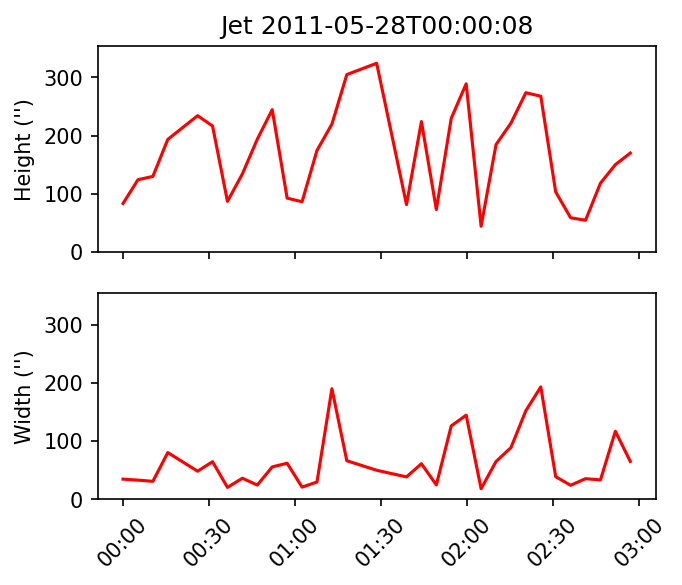

Jet start
Start base -915.812 262.352
1.0062043653532433


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -921.688 251.712
0.8175835132482718


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -914.797 316.651
0.7118095239573718


Start base -903.692 299.923
0.6337678305275939


Start base -899.723 307.136
0.7310587316660414


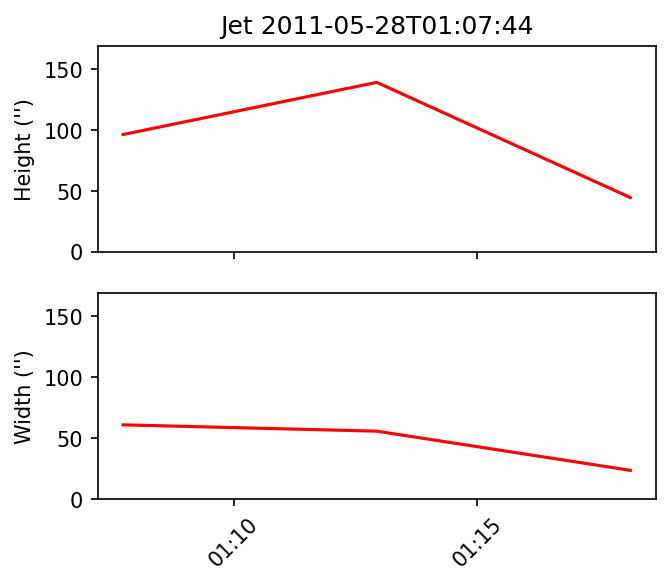

Jet start
Start base -918.542 260.775
0.26984489938606093


Start base -908.746 318.807
0.9514056163106445


Start base -917.951 254.605
0.5814589236472236


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


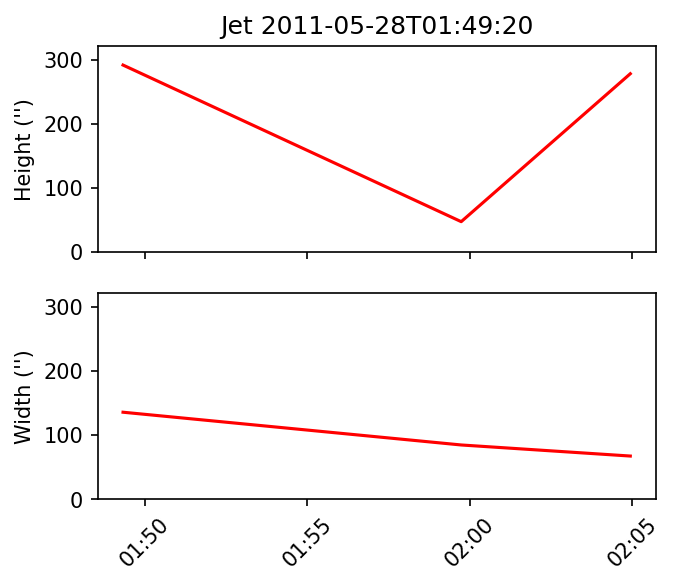

Jet start
Start base -912.292 269.058
0.17464231063799546


Start base -923.506 259.834
0.3003187668536341


Start base -917.205 263.441
0.5880398656757423


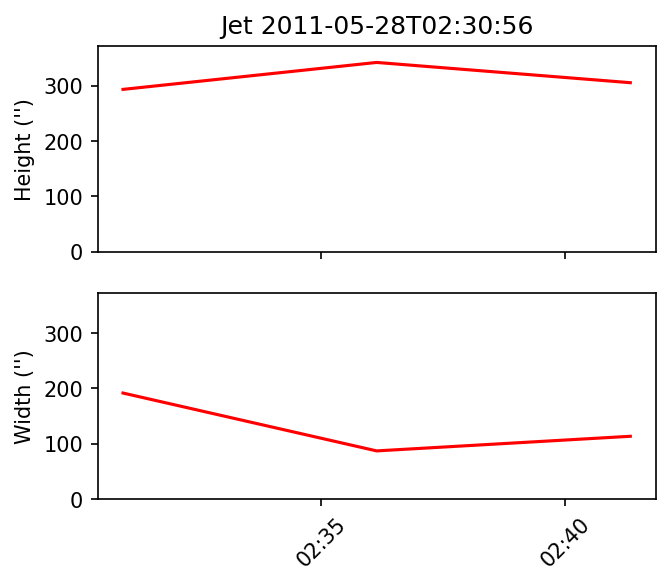

Jet start
Start base -913.301 268.596
1.0000122213039844


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -916.384 259.826
0.4952831722432299


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -908.148 278.302
0.7064619988769569


Start base -908.992 276.135
0.6858078258490445


Start base -901.6 311.596
0.9164627833503691


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


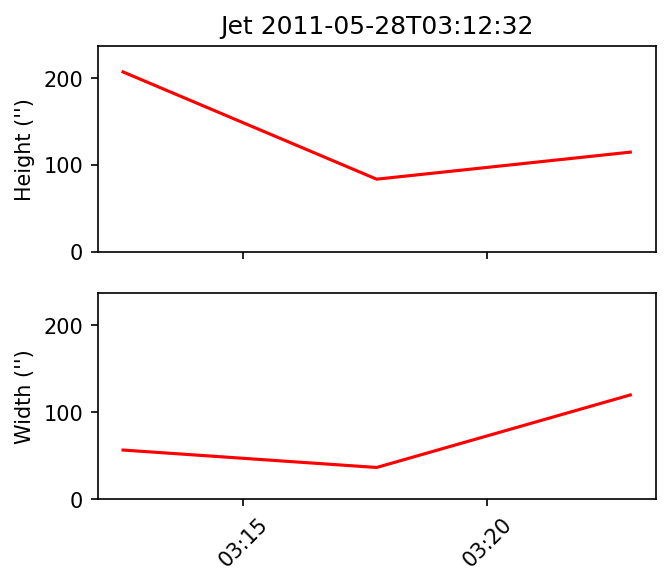

Jet start
Start base -901.6 311.596
0.24603552169694226


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -754.639 315.743
0.18436921598268935


Start base -852.346 312.259
1.0006419074754793


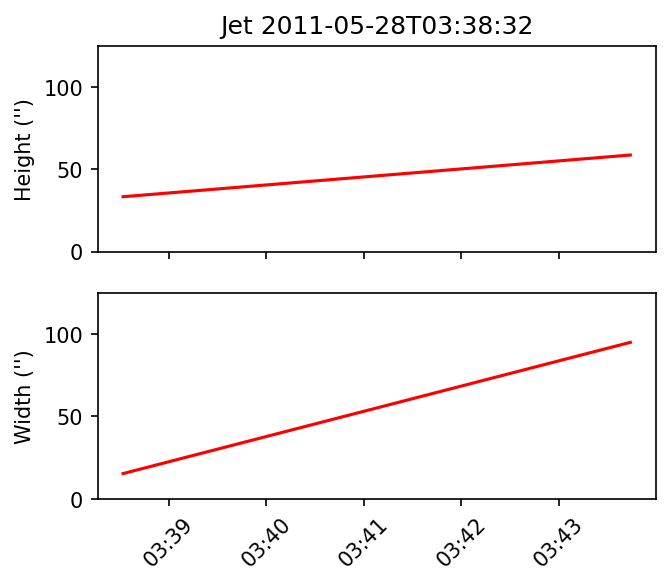

Jet start
Start base -754.639 315.743
0.9277651756414738


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -914.655 259.625
0.3561355222365563


Start base -912.952 270.568
0.36843836798621343


Start base -915.091 264.881
0.7060616748519933


Start base -916.483 267.505
0.3738601001351473


Start base -897.249 254.312
0.7863528159551147


Start base -869.172 365.146
0.9372587321566237


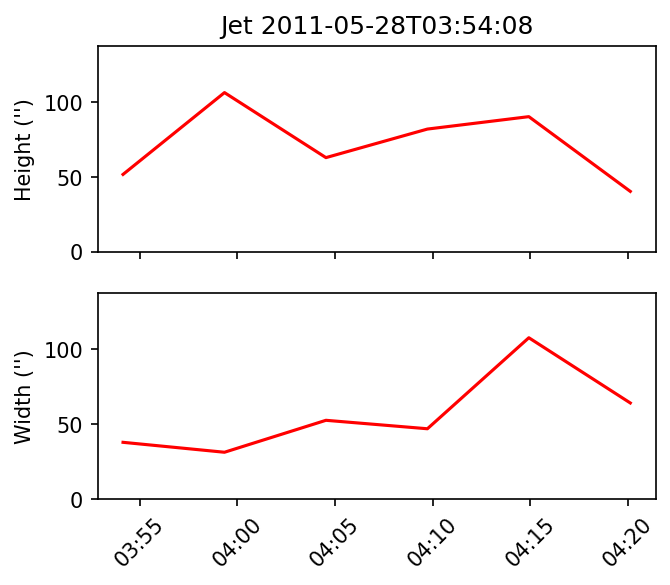

Jet start
Start base -898.889 309.753
0.9749385266523106


Start base -901.406 300.044
0.7643705143777688


Start base -869.172 365.146
0.36692425350722463


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


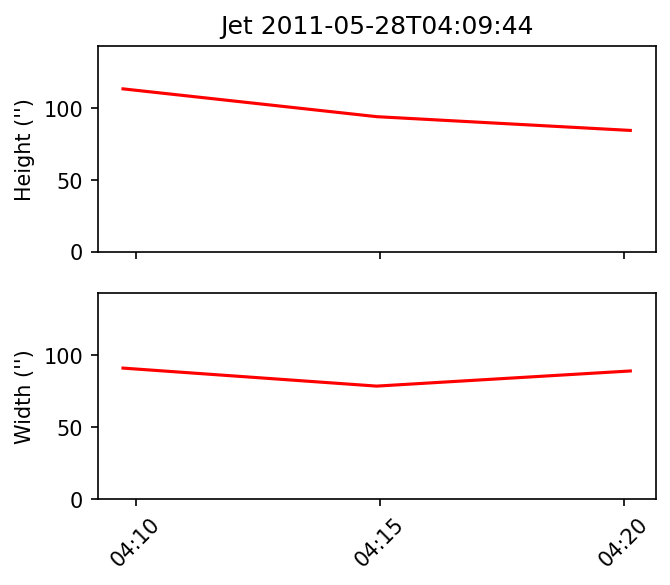

Jet start
Start base -901.406 300.044
0.6707983929837417


Start base -869.172 365.146
1.0003804853634415


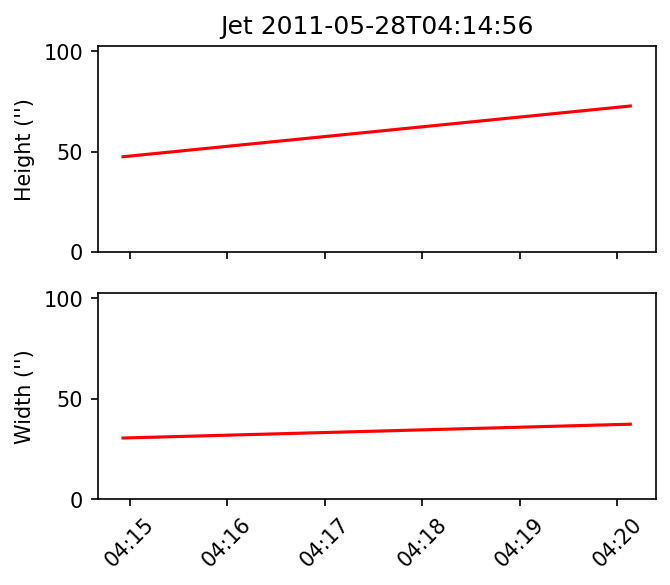

Jet start
Start base -913.683 267.12
0.20223823526499807


Start base -915.909 264.472
0.318755010906821


Start base -914.851 266.13
0.4110107150176801


Start base -916.336 268.455
0.1377845229061558


Start base -917.676 266.673
0.3037244717071665


Start base -915.711 268.115
0.24032031260328204


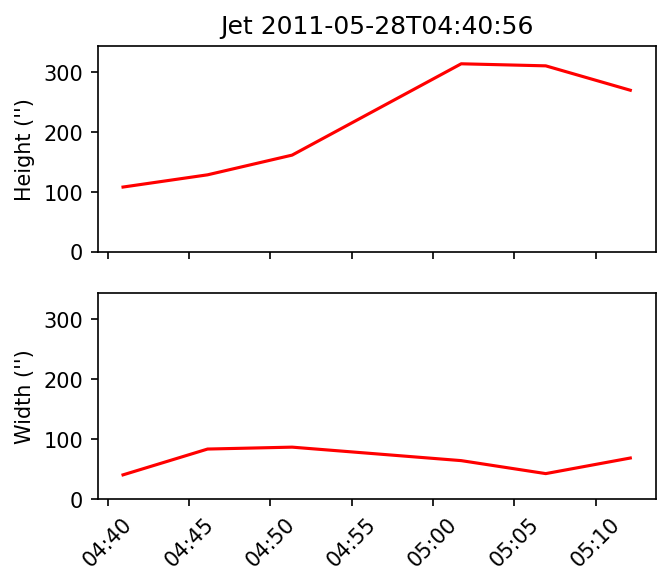

Jet start
Start base -906.917 271.805
1.000000000000234


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -917.522 249.319
0.8240438244293969


Start base -904.349 281.622
0.6800745461702091


Start base -914.164 262.917
0.15454751313067944


Start base -917.161 258.996
0.22695629401707745


Start base -913.194 269.389
0.1392597172589556


Start base -907.273 272.218
1.0000098876991017


Start base -916.555 254.71
0.41425246246323005


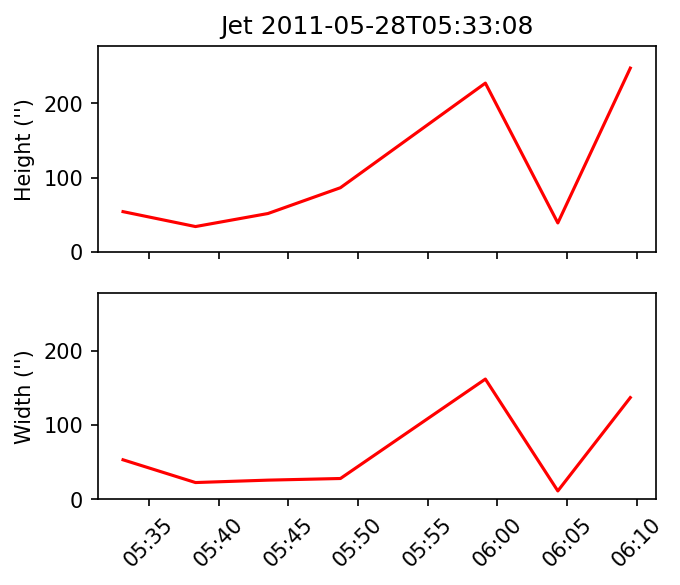

Jet start
Start base -917.522 249.319
1.0000028865642359


Start base -904.349 281.622
0.52777234281865


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


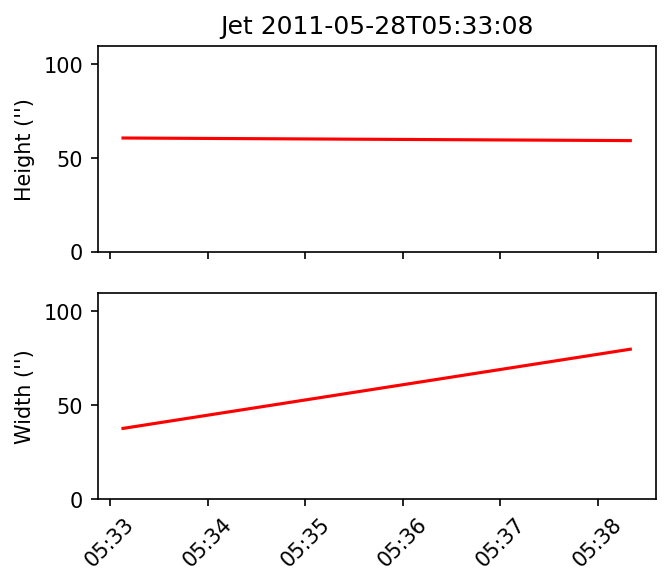

Jet start
Start base -783.26 300.599
0.7772417587688425


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -912.424 266.256
0.15875867582317144


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -890.861 328.4
0.5110671544166103


Start base -903.953 296.364
0.8864422967046053


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


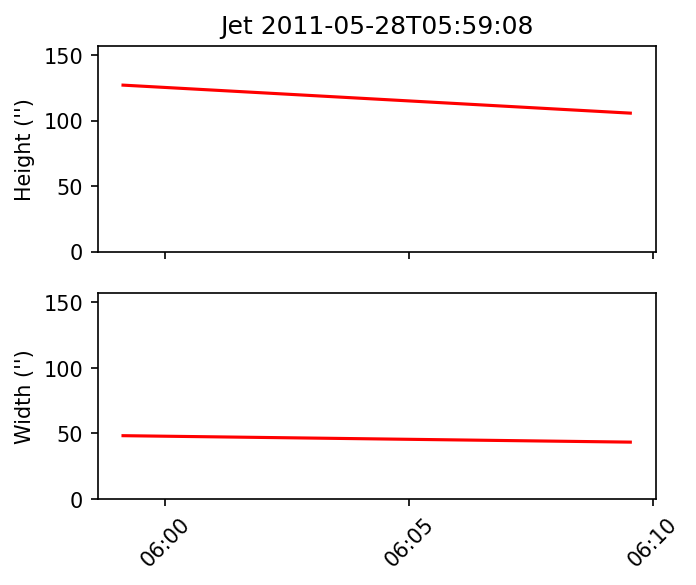

Jet start
Start base -924.031 234.842
0.23317810059429606


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -924.031 234.842
0.7466312124202631


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -910.941 263.291
0.6853558969947381


Start base -918.318 259.22
0.7419393783594211


Start base -915.374 264.3
0.454554937839562


Start base -913.865 262.62
0.22376089175866545


Start base -913.004 269.998
0.15458398577297675


Start base -912.74 270.33
0.18040655399764066


Start base -911.661 270.828
0.34085636120800933


Start base -912.142 272.79
0.2925085201820129


Start base -916.603 258.173
0.7799657771049565


Start base -912.932 269.283
0.23797584832378738


Start base -913.465 265.139
0.5918229438676862


Start base -911.993 268.156
0.4659686351990424


Start base -921.721 259.899
0.21625751858690576


Start base -913.592 268.548
0.2976741667377246


Start base -912.163 270.256
0.23483034640219938


Start base -929.771 239.839
0.6812551496462742


Start base -921.451 239.168
0.4069378107489762


Start base -912.846 266.358
0.7578571908171781


Start base -919.519 248.331
0.3518345915097787


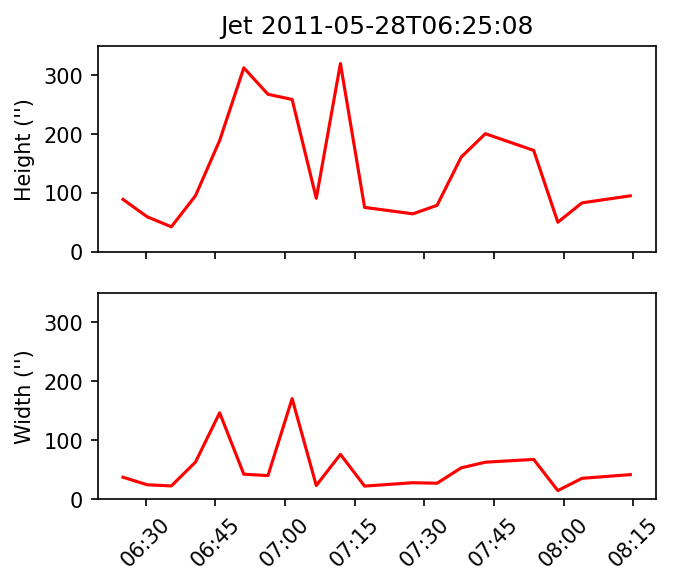

Jet start
Start base -906.664 294.379
0.5495688789102642


Start base -915.374 264.3
0.7209572442647634


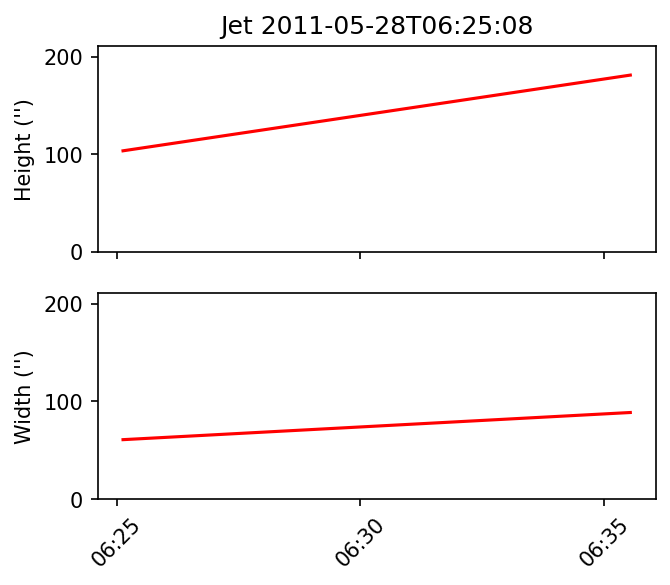

Jet start
Start base -918.318 259.22
0.5656879525881987


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -912.74 270.33
1.0000126404438952


Start base -912.142 272.79
1.0000816996555402


Start base -916.866 272.265
0.5765407941898738


Start base -912.932 269.283
0.9196073937484252


Start base -922.839 231.496
0.17692586295606363


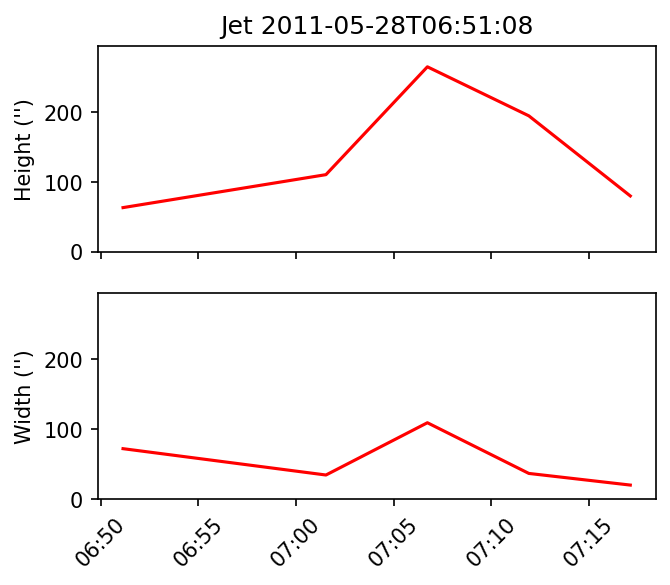

Jet start
Start base -922.647 235.765
0.5651527866724473


Start base -922.839 231.496
0.39708787612356666


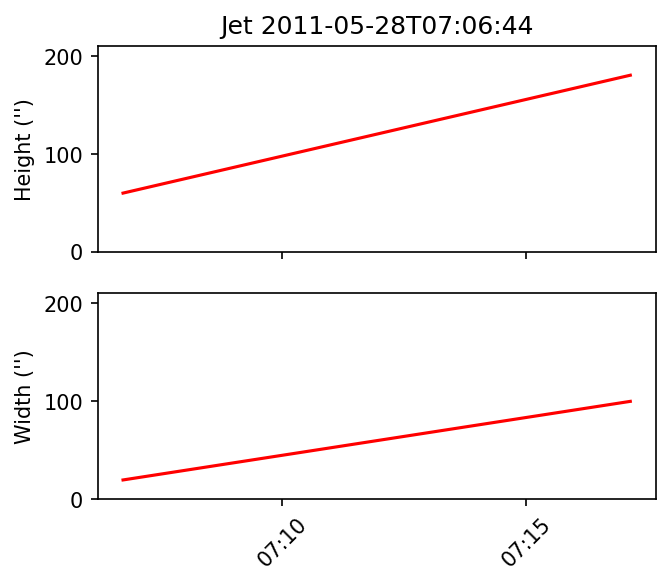

Jet start
Start base -921.721 259.899
1.0000032010097777


Start base -912.163 270.256
0.3764743507172837


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


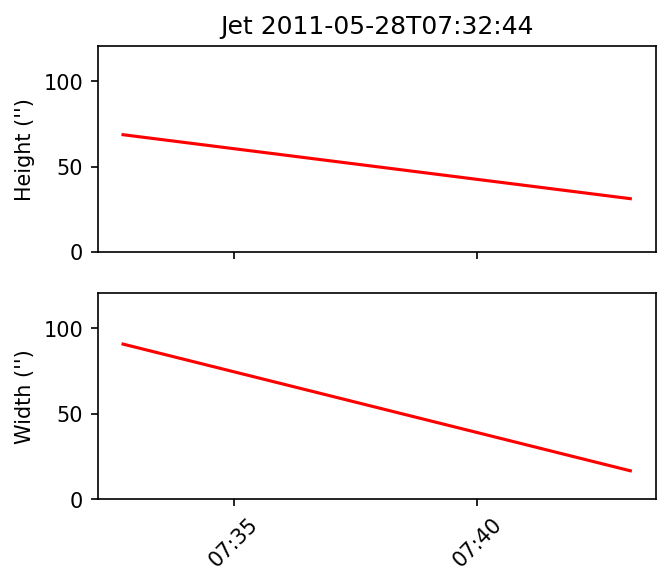

Jet start
Start base -731.342 254.862
0.5559139941528435


Start base -733.089 259.18
0.7842336578996013


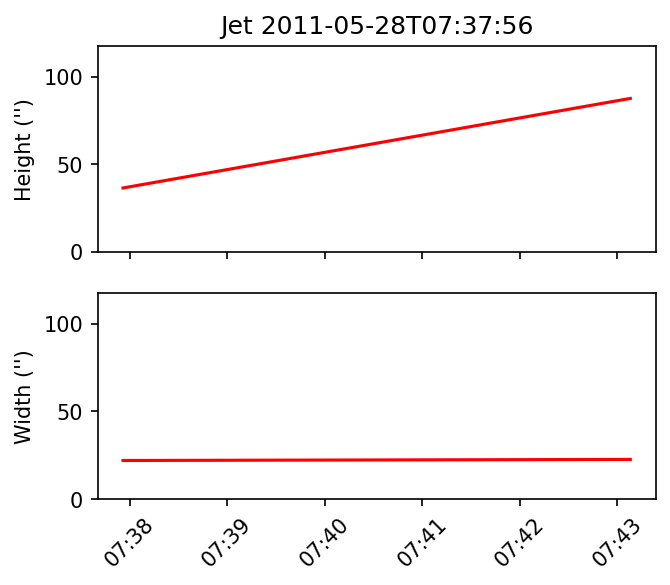

Jet start
Start base -921.451 239.168
0.7236171680969057


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -921.451 239.168
1.0004306181060842


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -912.95 265.048
0.21633967384623146


Start base -919.329 258.473
0.16013996934094152


Start base -916.255 265.685
0.21563807562984869


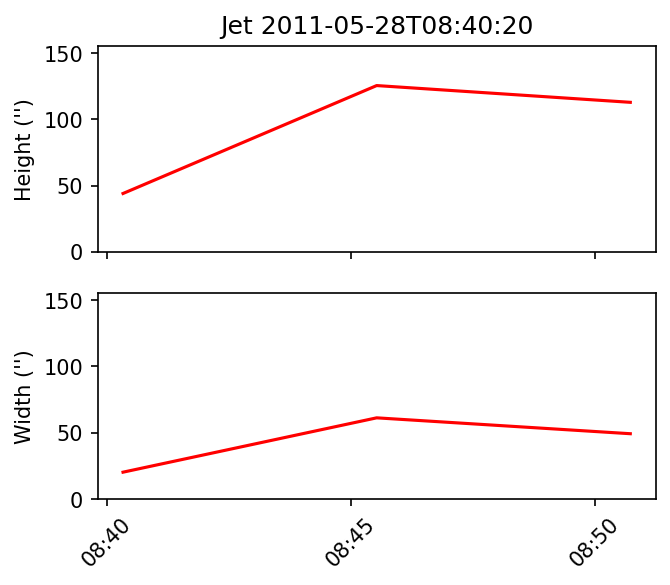

Jet start
Start base -912.95 265.048
0.4235269206213481


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -912.744 267.472
0.17735964784177763


Start base -916.241 256.566
0.4509337305203436


Start base -921.111 253.43
0.3489698019530949


Start base -912.599 263.749
0.44503317881414856


Start base -919.71 251.844
0.16117951504580322


Start base -915.34 259.429
0.3945319421168661


Start base -915.446 264.876
0.31485667522185473


Start base -915.492 261.759
0.3840760955602272


Start base -916.445 259.606
0.29271838826972285


Start base -918.19 258.863
0.2970441128005022


Start base -917.882 262.861
0.6309643235740313


Start base -921.941 256.187
0.1851886282167531


Start base -915.862 260.88
0.20152820579793795


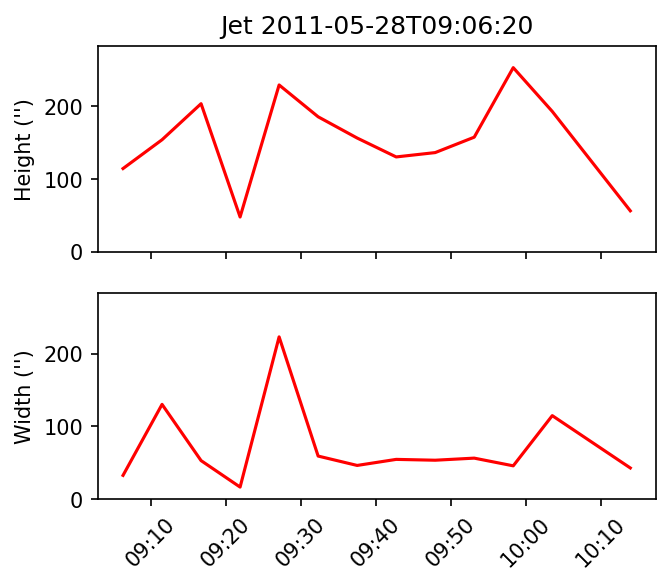

Jet start
Start base -925.128 226.358
0.3479725815432174


Start base -916.241 256.566
0.2915203503945426


Start base -901.286 303.885
0.7010995025907809


Start base -915.537 292.335
0.5265714041945354


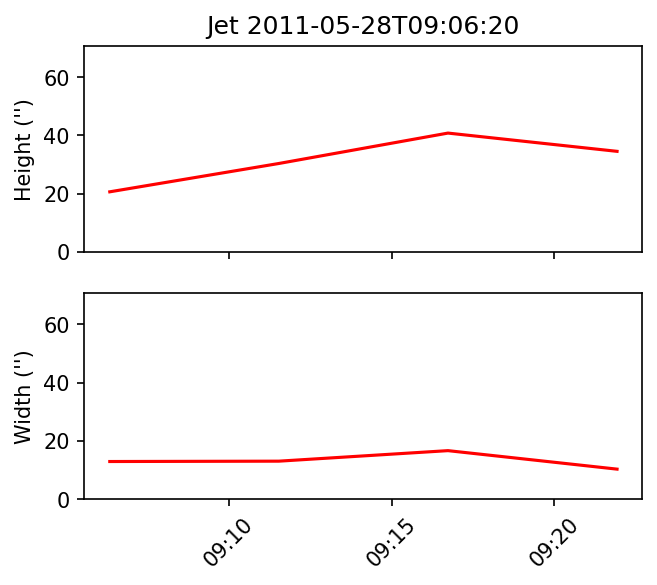

Jet start
Start base -901.242 304.986
0.6452395540040156


Start base -910.022 295.895
0.9801241569258154


Start base -916.084 262.911
0.5489075944499016


Start base -905.806 289.853
0.5217037794547992


Start base -914.888 294.482
1.0000779580601988


Start base -900.529 302.036
0.4059802132896287


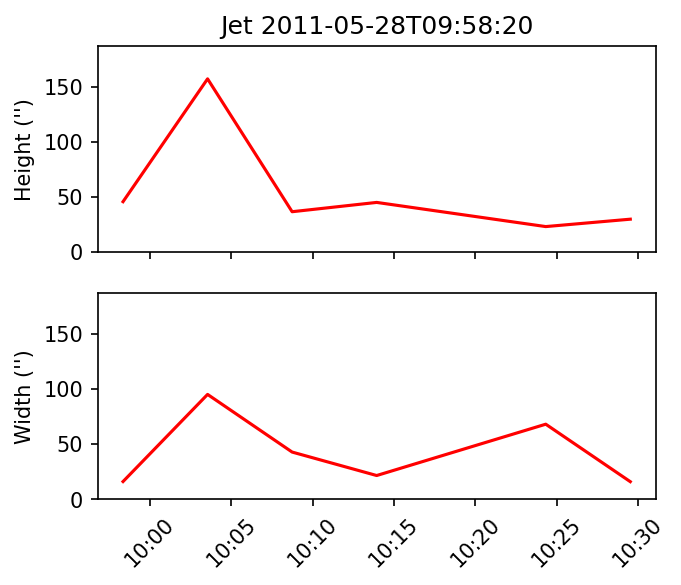

Jet start
Start base -901.242 304.986
0.25565555707092796


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -923.103 250.629
0.6729551380271696


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -917.388 258.947
0.6226670689081242


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 832.799 -223.603
0.3086051471097831


Start base 833.532 -222.331
0.5696519329609309


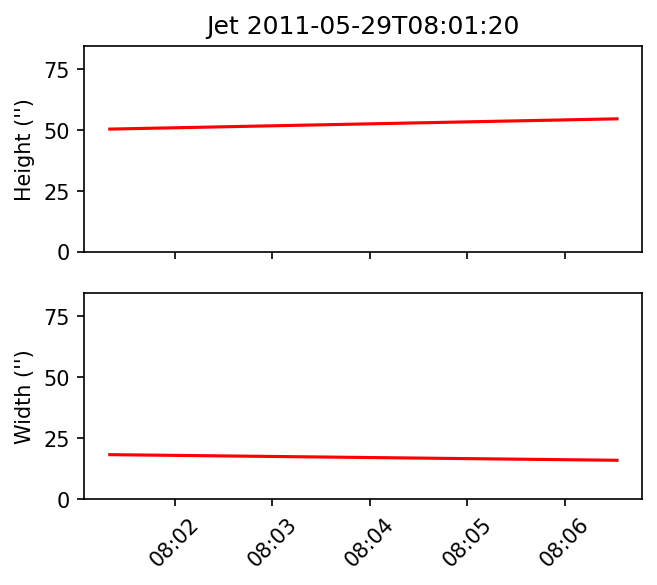

Jet start
Start base 831.454 -225.881
0.44347366598089427


Start base 831.57 -225.89
0.5422641986695368


Start base 834.187 -224.837
0.2679960704788472


Start base 835.63 -224.543
0.20441341206961475


Start base 835.338 -224.328
0.2555313185459857


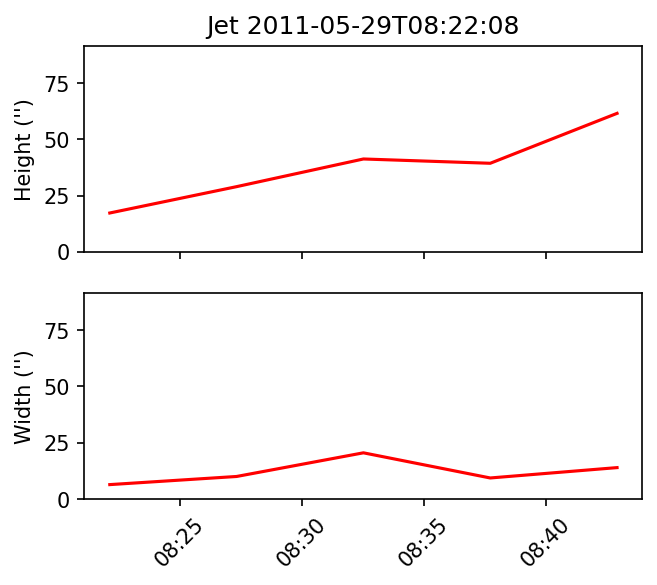

Jet start
Start base 803.685 -256.667
0.41323234501544504


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 809.431 -235.576
0.17693484151356903


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 830.18 -231.325
0.1681526190754202


Start base 829.8 -229.735
0.7051491221877623


Start base 830.363 -230.092
0.7062077546463138


Start base 832.086 -225.639
0.45281793379490687


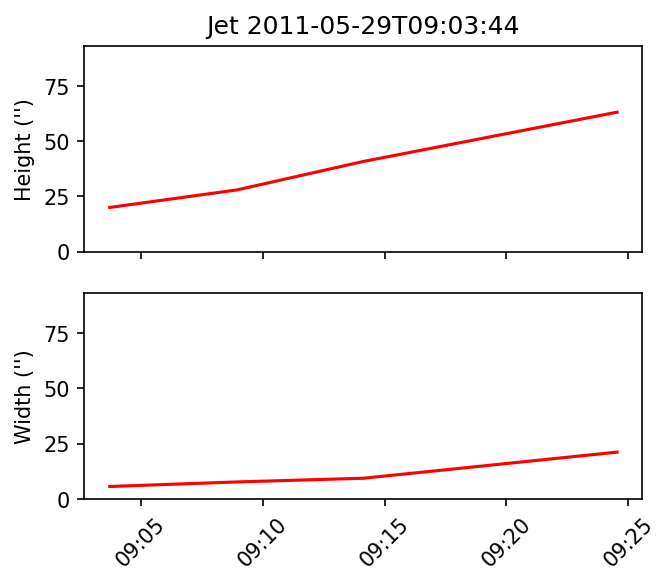

Jet start
Start base 830.363 -230.092
1.0000388777858944


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 837.626 -230.266
0.39978994915772265


Start base 841.141 -225.94
0.3524566979776007


Start base 840.8 -227.24
0.607458264835988


Start base 843.142 -227.06
0.6476481173882568


Start base 840.867 -228.171
0.41802620702523874


Start base 843.789 -227.921
0.6989468202248855


Start base 848.84 -224.567
0.7684613520887501


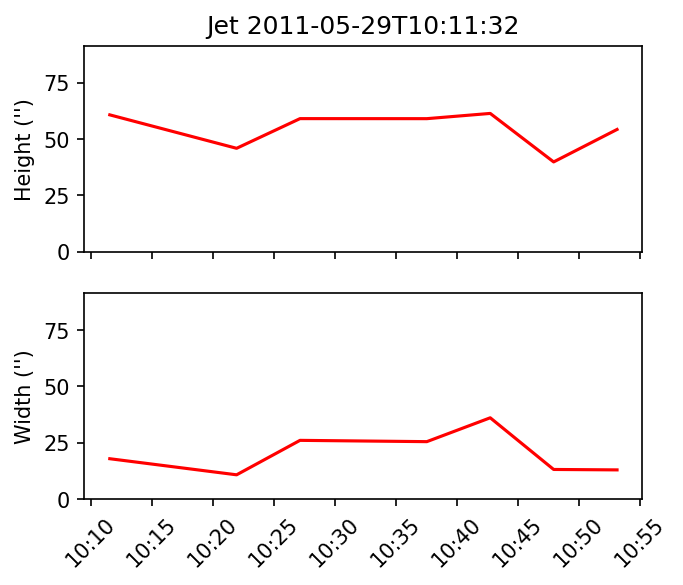

Jet start
Start base -414.83 430.489
0.20678844715442263


Start base -409.972 427.543
0.38328978090606275


Start base -409.627 426.377
0.30303662929935404


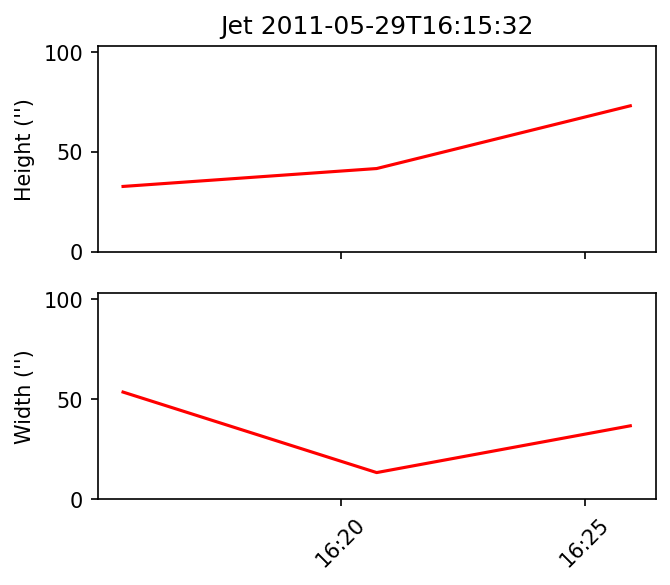

Jet start
Start base -49.5684 590.319
0.09558678488918657


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -50.4411 594.005
0.24883946064052903


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -236.418 142.247
0.17285668835332285


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -234.453 137.986
0.2209418892326037


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 668.716 310.926
0.6605526131928777


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 346.337 112.397
0.7375648461022187


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 588.3 299.033
0.1936591788048022


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 377.834 304.283
0.3483343093319503


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 485.391 73.278
0.2699007940222891


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 385.562 145.807
0.40466176376696816


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 461.717 119.224
0.794738648685904


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 431.406 143.342
0.5673641767670392


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 514.82 206.3
0.7447499393797361


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 481.862 237.182
1.0000732826920338


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 539.185 261.842
0.9616375330113719


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -539.511 179.446
0.7331098480465349


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -553.518 210.119
0.37351071747302655


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -485.035 198.828
0.44592602608364384


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -537.006 210.235
0.3852137108852773


Start base -544.976 206.993
0.19611510243567168


Start base -544.331 207.968
0.2734330737405798


Start base -545.374 209.15
0.238956566455468


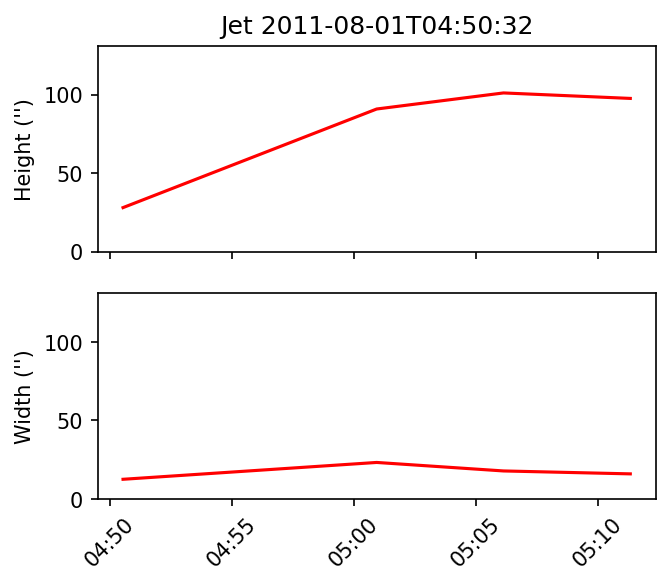

Jet start
Start base -556.274 219.152
0.34131889135996074


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -545.197 211.709
0.3213383022493699


Start base -541.068 210.26
0.14730827422410375


Start base -548.334 217.272
0.6930910235298818


Start base -542.994 213.299
0.6636443182046382


Start base -503.163 183.408
0.8735310980590156


Start base -514.615 174.263
0.9194079301191571


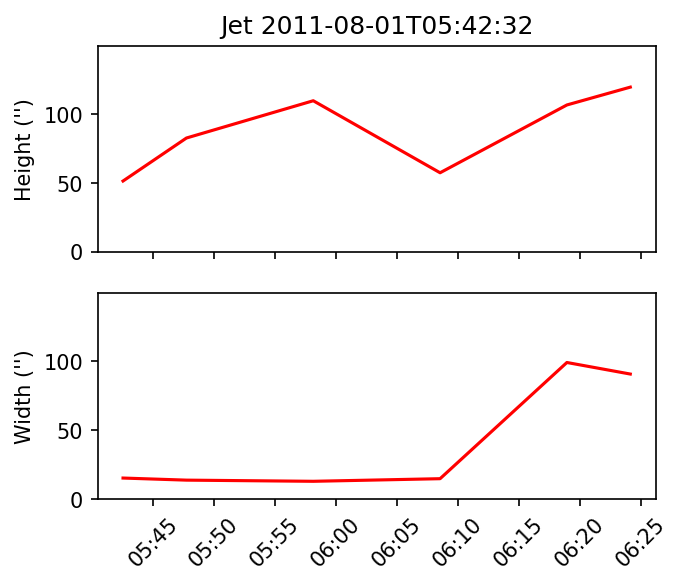

Jet start
Start base -542.994 213.299
0.8605607840898362


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -540.281 210.381
0.48122046056633244


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -527.043 204.931
0.15198725790513273


Start base -542.62 218.261
0.19424892230561755


Start base -528.576 213.278
0.3941857802232617


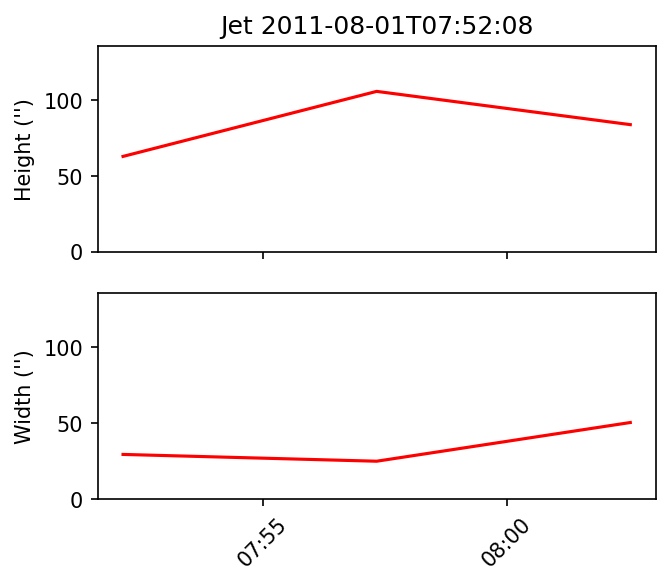

Jet start
Start base -502.842 192.901
1.0000000038382142


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -559.963 216.49
0.7512171599912021


Start base -488.706 186.146
1.0000000074668758


Start base -512.425 208.78
0.7987457841298164


Start base -526.218 215.267
0.3407332532532653


Start base -522.67 213.678
0.18246841323686205


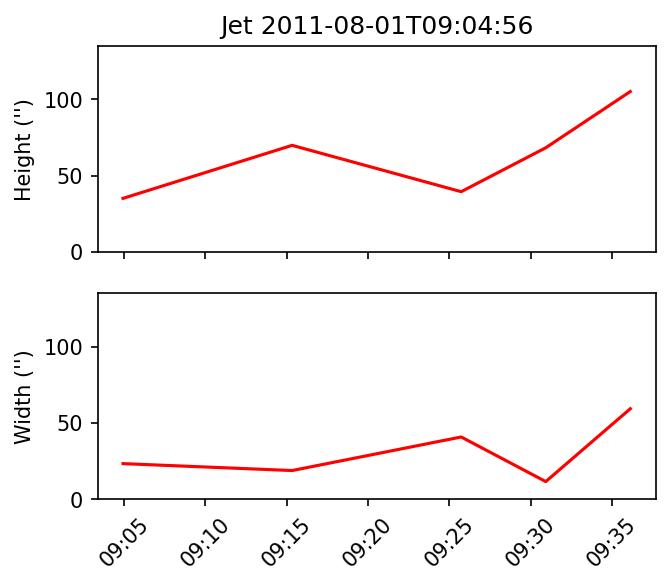

Jet start
Start base -478.83 179.508
0.3282811317139021


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -469.001 235.304
0.6541319417672672


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -525.58 217.934
0.4796112358502974


Start base -512.812 208.8
0.5767006070920936


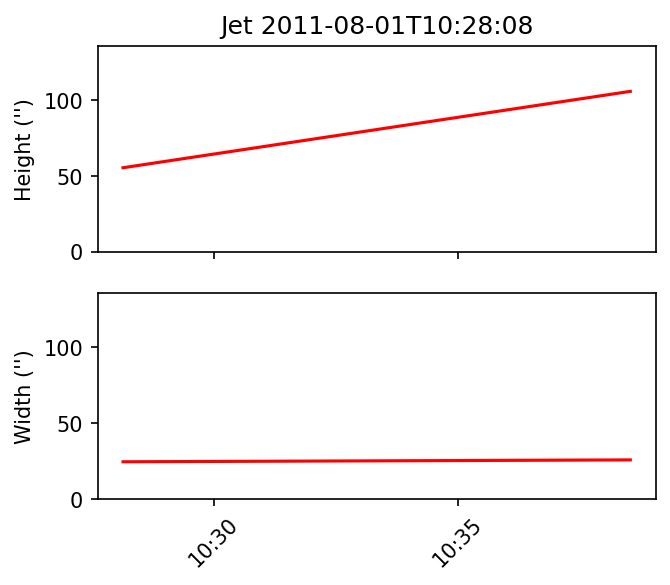

Jet start
Start base -525.58 217.934
1.0000282100510343


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -517.109 216.877
0.220790018755337


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -500.209 213.188
0.17178215997955146


Start base -493.449 208.918
0.2882087369223315


Start base -510.989 215.693
0.2663635092128351


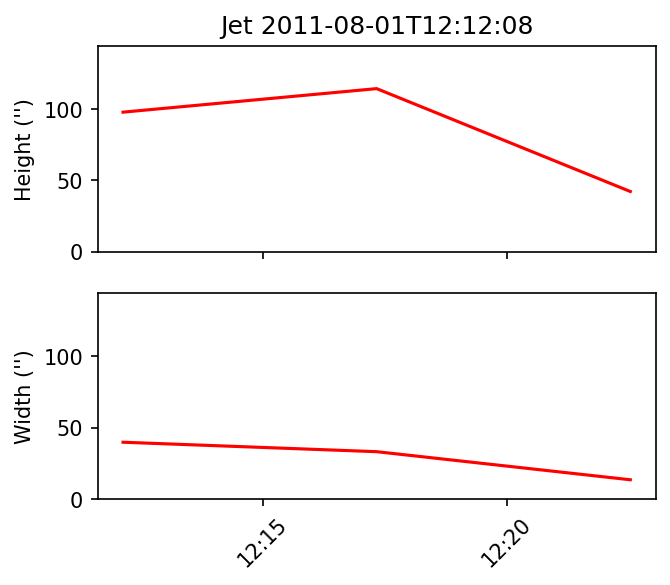

Jet start
Start base -502.917 216.234
0.4595481068077134


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -451.044 179.48
0.4765428569464975


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -486.484 196.443
0.28627409745088855


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -454.597 170.576
0.8653126595760657


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -673.418 300.687
0.9031632634965561


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -652.516 303.66
0.5305818806852426


Start base -655.103 305.378
0.35742993626529773


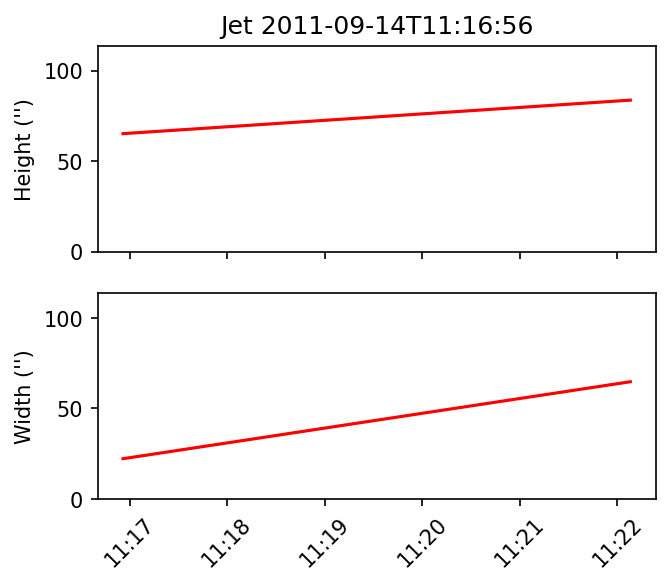

Jet start
Start base -790.321 435.078
0.9247210049033987


Start base -810.429 448.905
0.6951692942561521


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


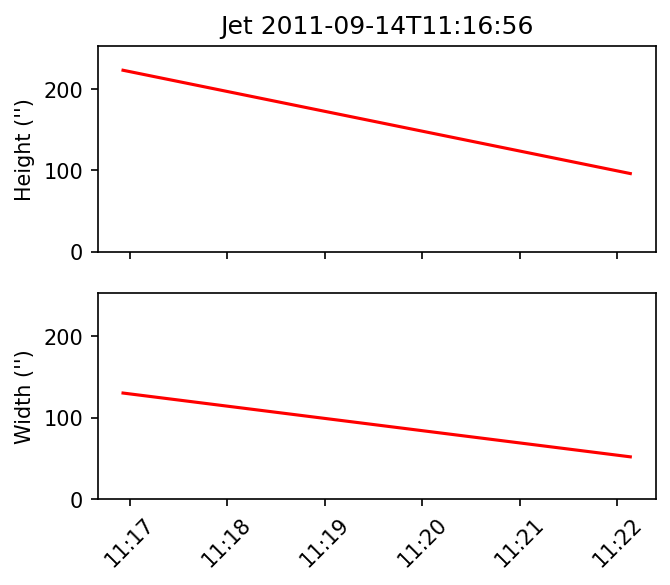

Jet start
Start base -810.429 448.905
0.9047515493511946


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -679.42 282.768
0.2630906771641844


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 735.482 318.45
0.7680428464573769


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 808.208 304.252
0.35623002379019086


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 746.155 308.768
0.5628118081951844


Start base 779.823 306.745
0.6978998355753033


Start base 790.659 311.272
0.8961005930723741


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


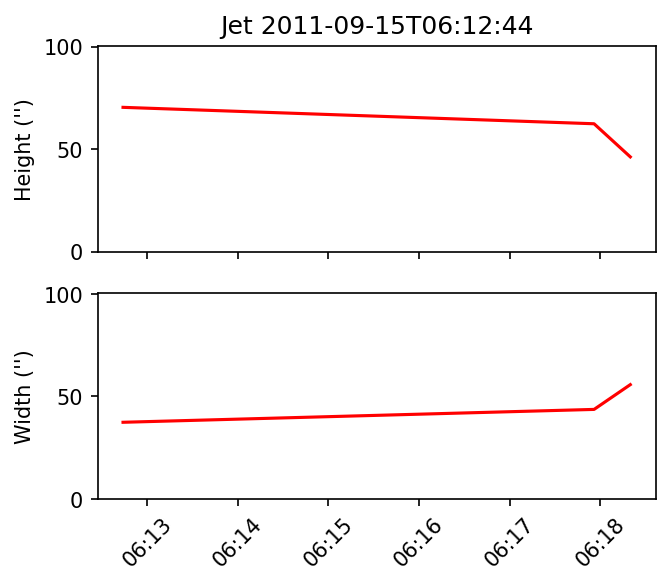

Jet start
Start base 779.823 306.745
0.49272460044389355


Start base 790.659 311.272
0.9902826366579429


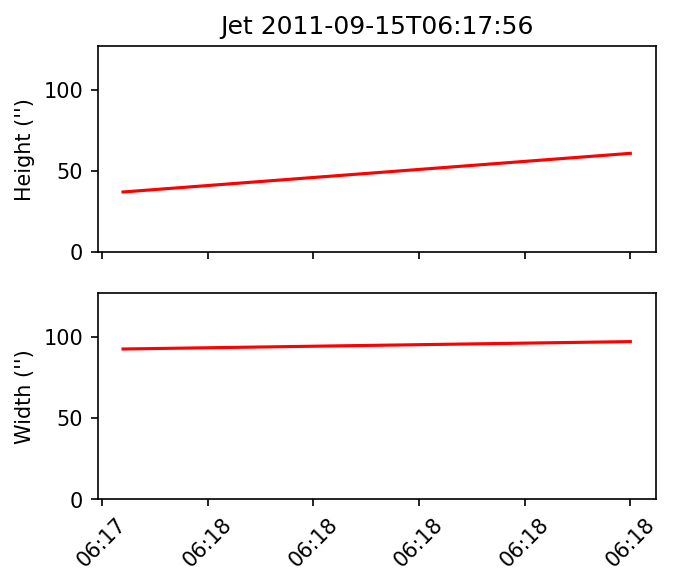

Jet start
Start base 544.831 -802.307
0.38417912150044736


Start base 543.479 -805.362
0.5030725515980652


Start base 540.634 -805.471
0.21631746905817958


Start base 562.739 -793.425
0.6925700682867723


Start base 568.659 -794.284
0.5598869387019846


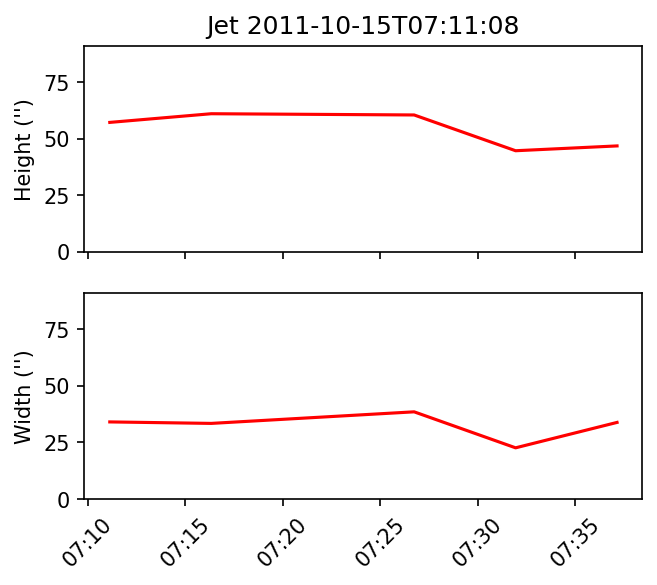

Jet start
Start base 544.831 -802.307
1.0000001170386457


Start base 477.304 -851.06
0.4293588430730873


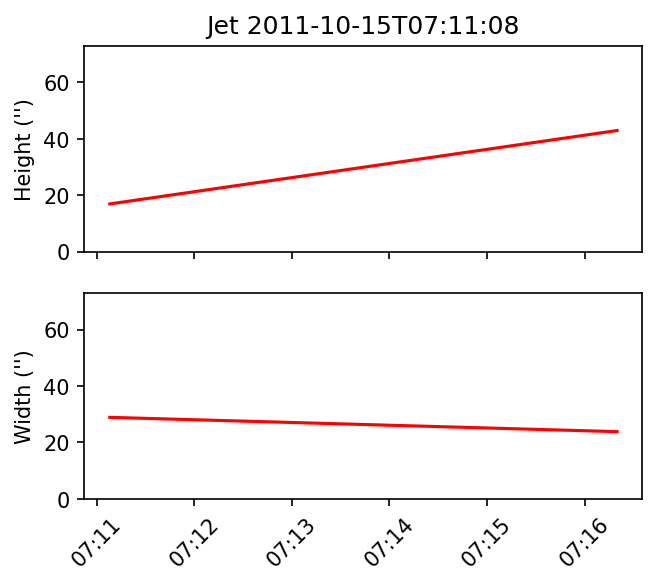

Jet start
Start base 541.837 -808.521
0.34532441306654504


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 552.01 -804.659
0.8659526455861348


Start base 609.693 -753.273
0.873876714254965


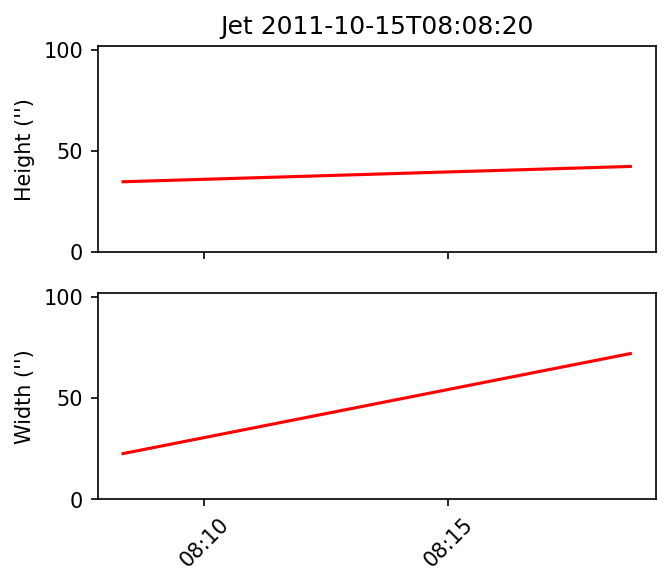

Jet start
Start base 597.386 -770.254
0.32392774247836587


Start base 598.323 -767.573
0.1496323617447822


Start base 605.573 -760.964
0.28655903430633417


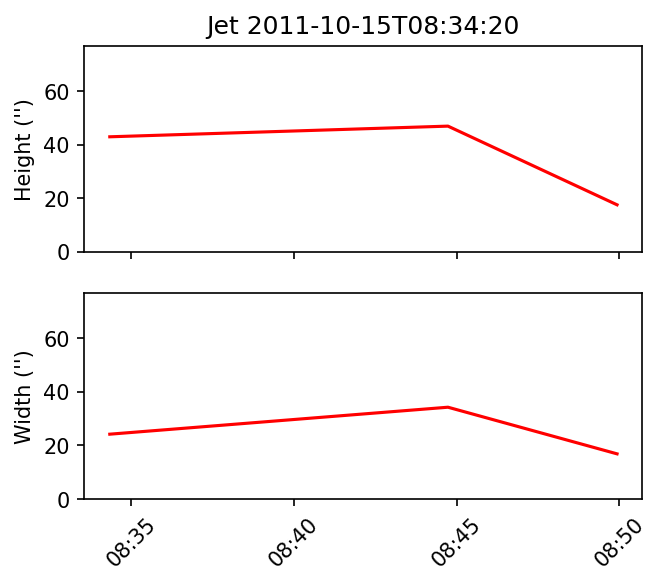

Jet start
Start base 557.551 -799.264
0.496209197972169


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 868.977 219.482
0.4585355934284712


Start base 727.299 252.293
0.2377581438444533


Start base 738.642 220.924
0.6337422195731961


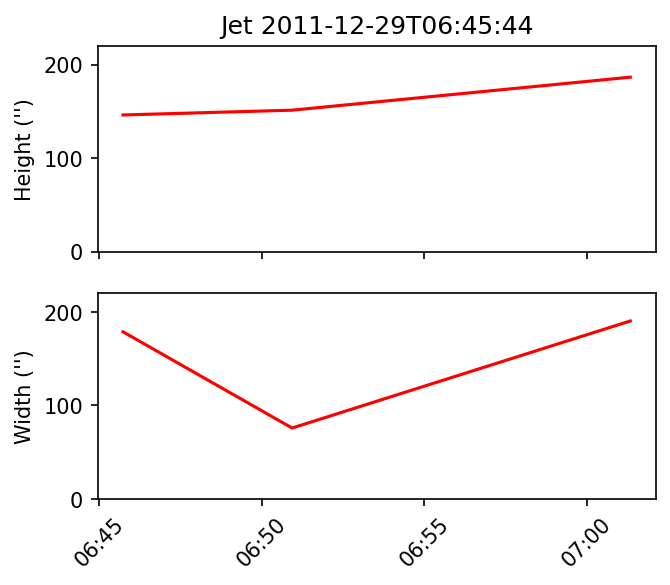

Jet start
Start base 868.977 219.482
0.439651183352473


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 998.166 50.0873
0.581981329247821


Start base 920.547 108.929
0.2932181012344075


Start base 918.774 104.814
0.5348065016773267


Start base 929.838 107.008
0.20347782955031302


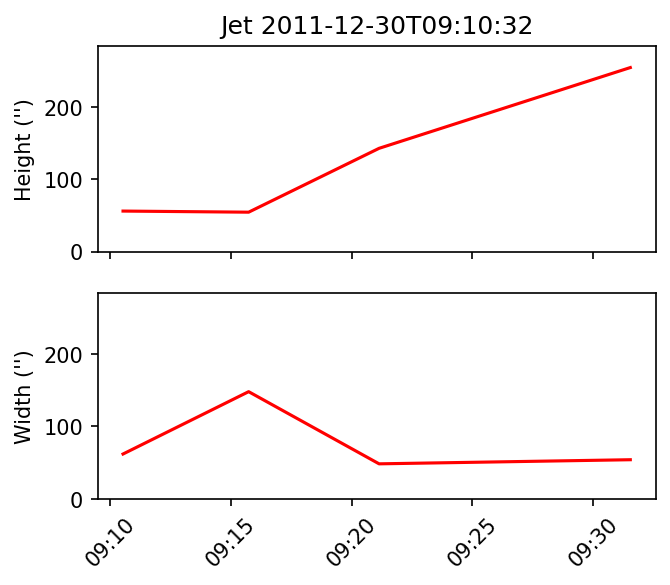

Jet start
Start base 916.845 107.505
0.7267286852745429


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 922.856 237.923
0.6945189270967853


Start base 949.747 248.153
0.23388894178246283


Start base 933.489 101.237
0.7424212194967421


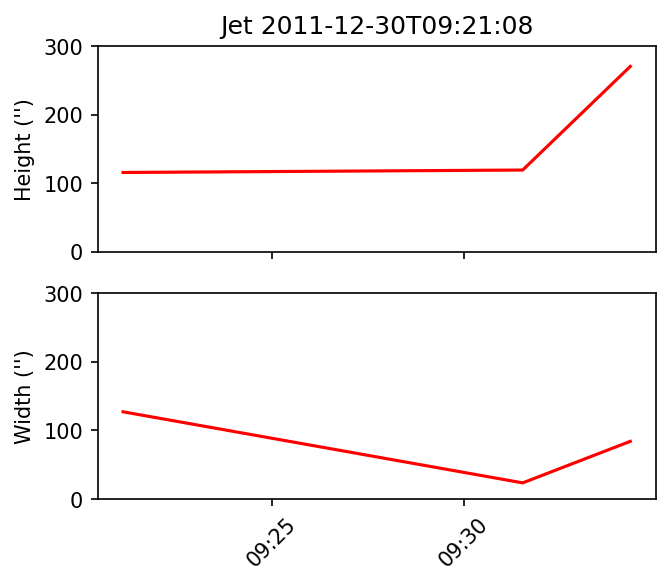

Jet start
Start base 882.521 159.732
0.3204883419166193


Start base 887.107 151.845
0.3112125530915739


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


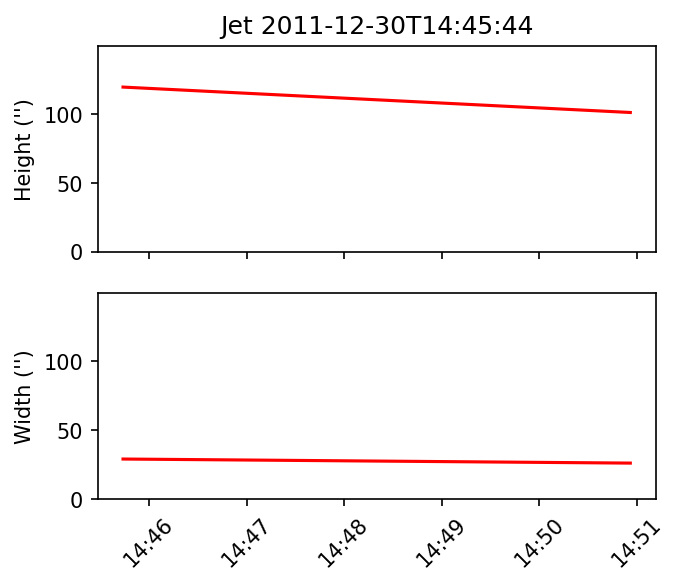

Jet start
Start base 912.247 83.1297
0.12480409321640192


Start base 911.491 105.609
0.2362034670819112


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


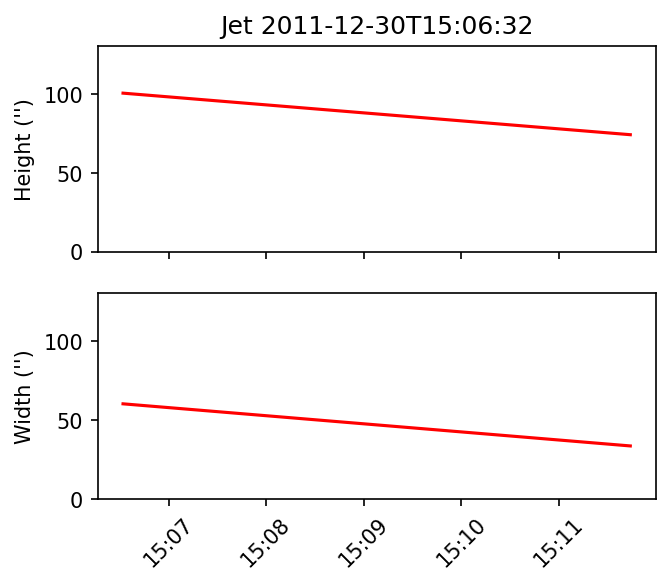

Jet start
Start base 907.605 121.673
0.3262386770717496


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 869.16 194.571
0.9746135373195749


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 940.543 114.965
1.03130115696769


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 414.31 -277.86
0.7700471115011229


Start base 462.332 -276.046
0.7725115423967229


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


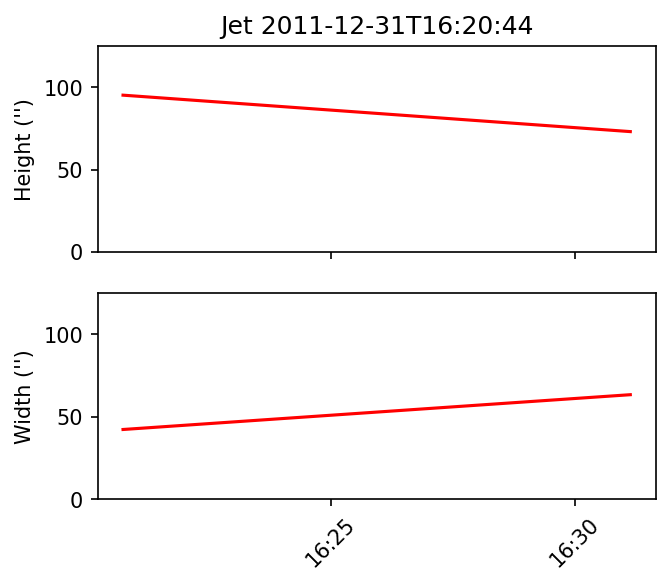

Jet start
Start base 439.975 -312.995
0.5922524103275526


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 439.975 -312.995
0.8582715444758147


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 314.621 303.846
0.6249407342029124


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 294.509 399.27
0.5412756571399434


Start base 306.025 482.439
0.3567920582692702


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


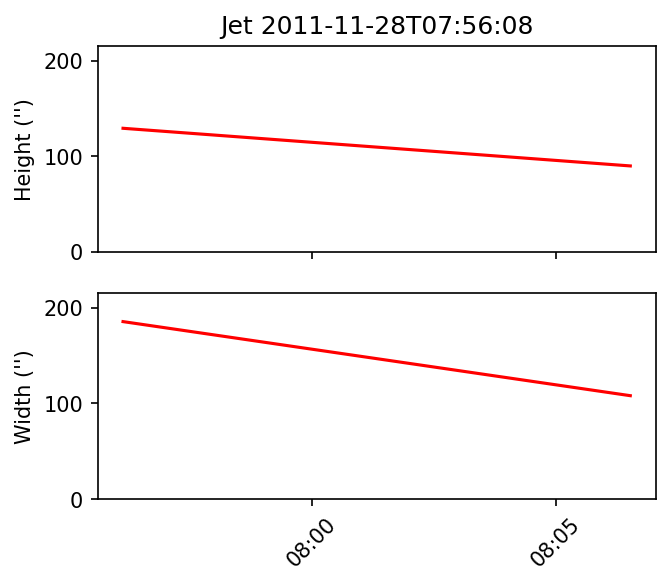

Jet start
Start base 209.322 552.668
0.5671615805872675


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 320.695 489.023
0.5720338026631222


Start base 319.446 488.837
0.3365010356155933


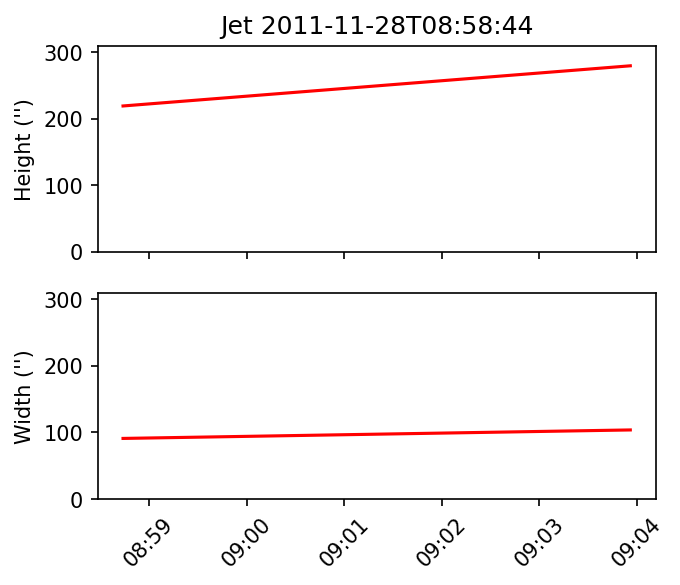

Jet start
Start base 650.998 585.486
0.6667167172403674


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 334.81 482.955
0.7158655171463513


Start base 337.42 490.524
0.5496461069960413


Start base 347.643 501.31
0.36620436275947377


Start base 294.628 485.175
0.4547490601548436


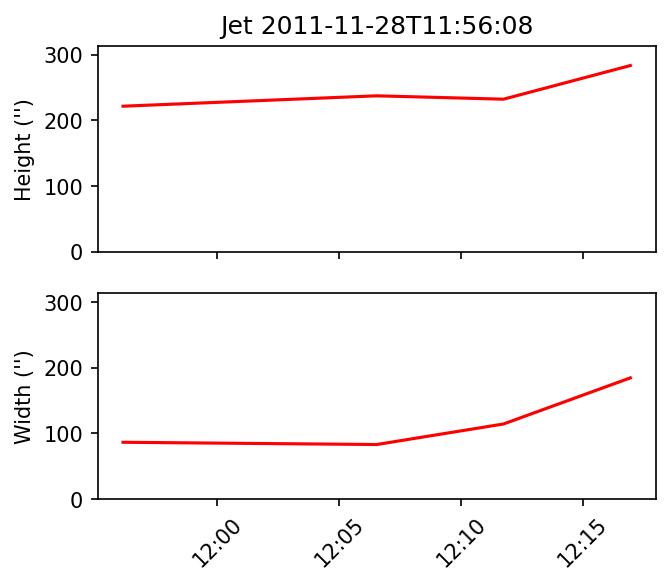

Jet start
Start base 428.106 298.302
0.24109585339841985


Start base 454.475 266.31
0.15411024146746732


Start base 387.349 414.295
0.11483692920826227


Start base 365.24 481.345
0.1897572336490819


Start base 384.642 459.058
0.7326550428259537


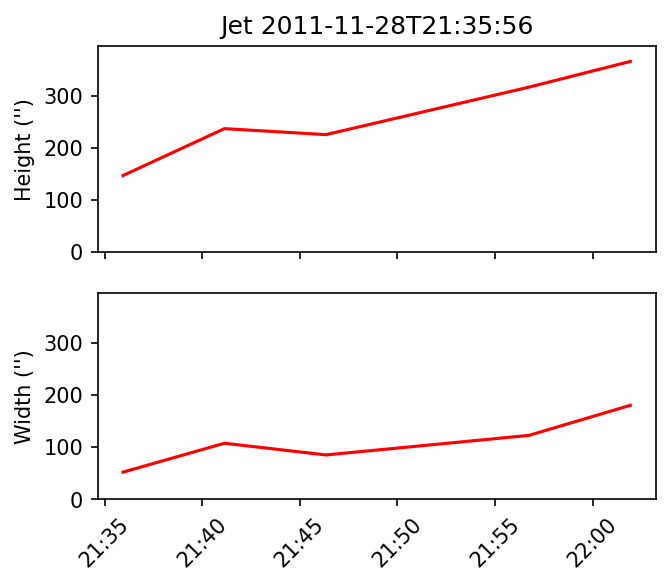

Jet start
Start base 428.106 298.302
0.8578265506084224



/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 592.783 379.682
1.0000000000016365


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 380.528 240.238
0.7606209831187843


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 630.289 366.577
0.2508121300367844


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 615.948 404.765
0.7758933155282167


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -598.171 -328.328
0.41402132364469113


Start base -591.547 -331.365
0.26188011036686903


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


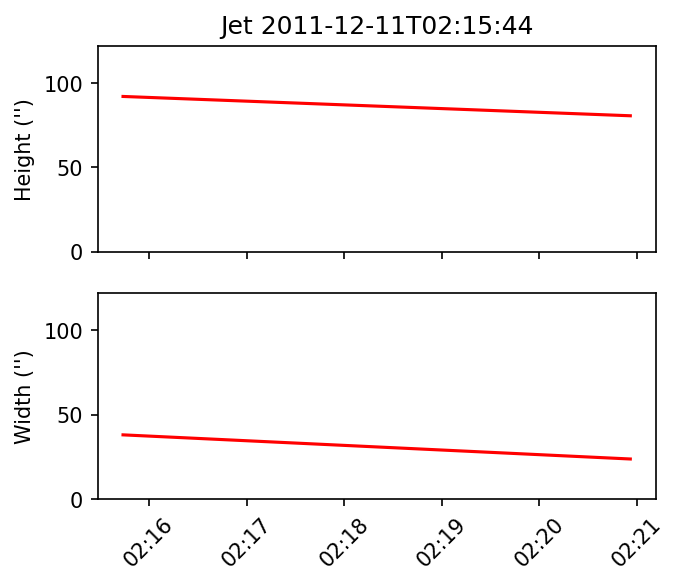

Jet start
Start base -589.766 -299.75
0.6031944985787796


Start base -607.876 -275.797
0.40867597964150465


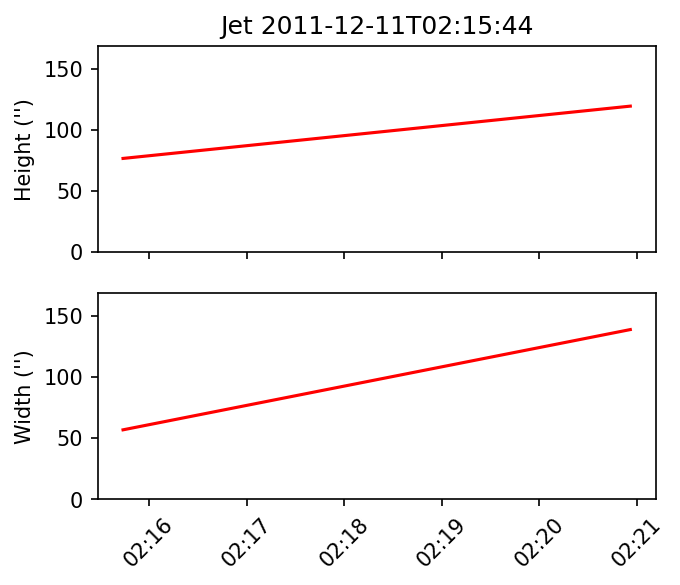

Jet start
Start base -673.255 -323.745
0.5176046472211748


Start base -597.658 -313.866
0.8113759473424235


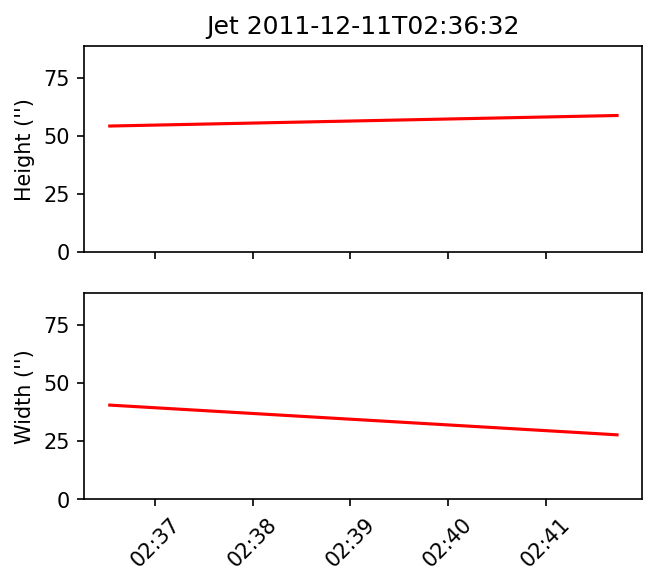

Jet start
Start base -673.255 -323.745
0.16287516339875052


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -585.13 -297.311
0.21077519245320872


Start base -591.292 -294.771
0.2686419172354581


Start base -582.927 -327.554
0.3203493776813749


Start base -555.349 -305.741
0.43493658405359303


Start base -551.073 -309.057
0.7403355152107968


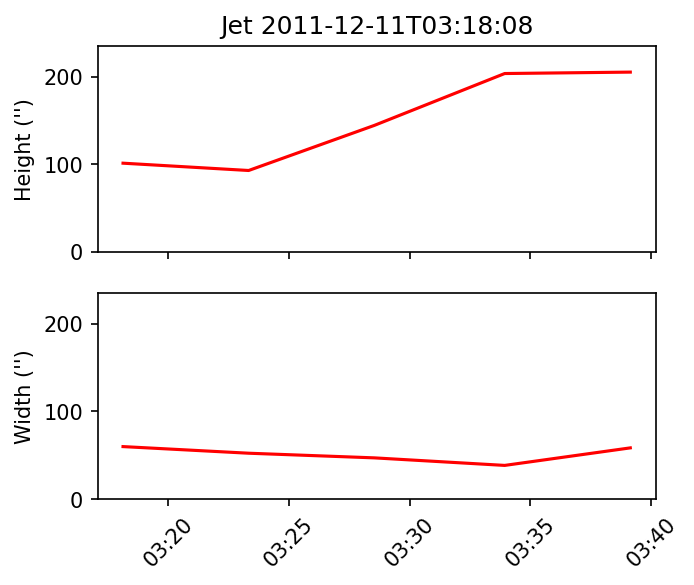

Jet start
Start base -555.749 -306.518
0.22340063847538316


Start base -583.752 -327.844
0.24009922649310667


Start base -584.019 -323.399
1.0159086952340017


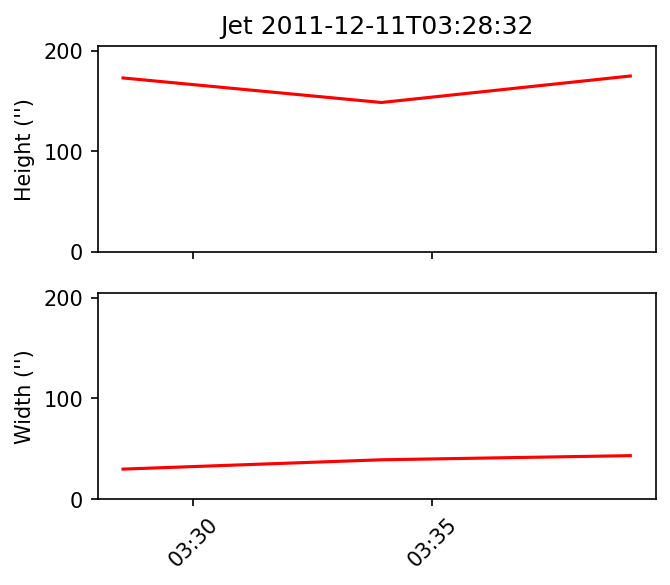

Jet start
Start base -594.934 -320.101
0.057862888539413335


Start base -596.979 -323.714
0.19899265641073582


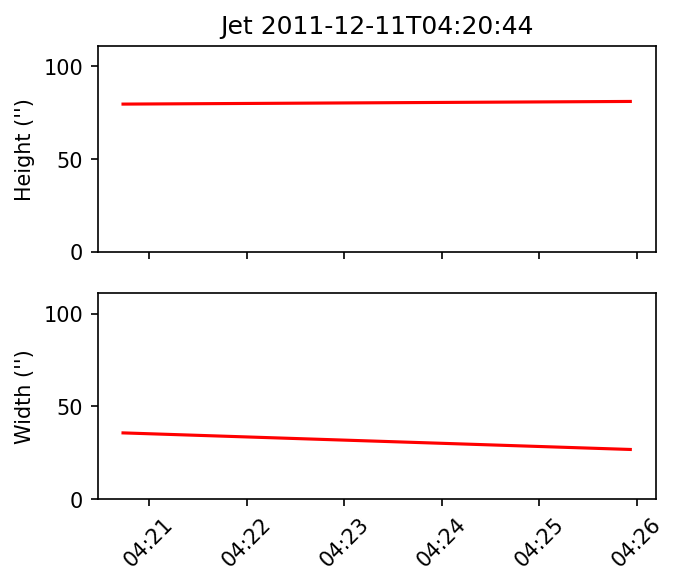

Jet start
Start base -498.137 -317.813
0.13265863306285286


Start base -505.98 -323.036
0.25221418667840956


Start base -501.212 -324.797
0.5635610567763198


Start base -527.676 -290.59
0.28552504849112303


Start base -522.305 -295.125
0.3985727716044653


Start base -497.119 -308.383
0.6344374201224068


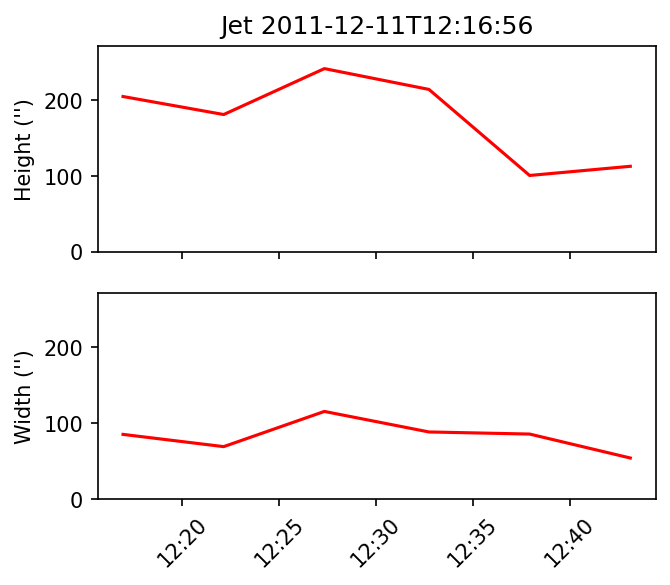

Jet start
Start base -526.476 -293.196
0.6082360893187195


Start base -501.212 -324.797
0.4379775837442016


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


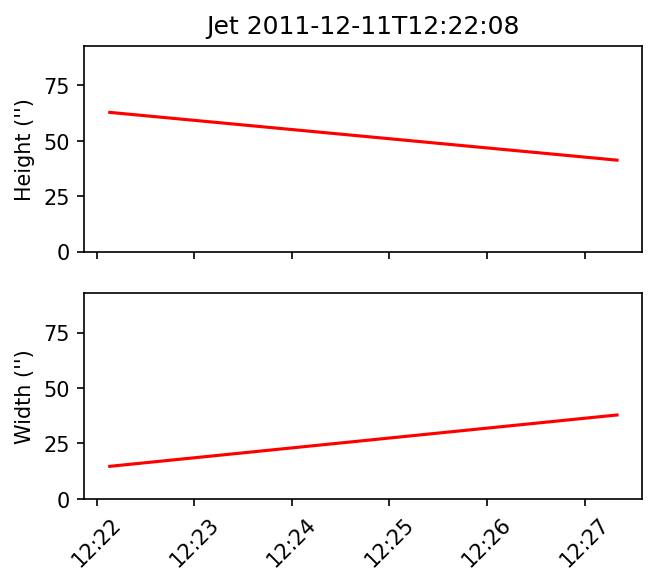

Jet start
Start base -576.654 -293.897
0.38842229360436653


Start base -487.291 -296.458
0.6685341130173098


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


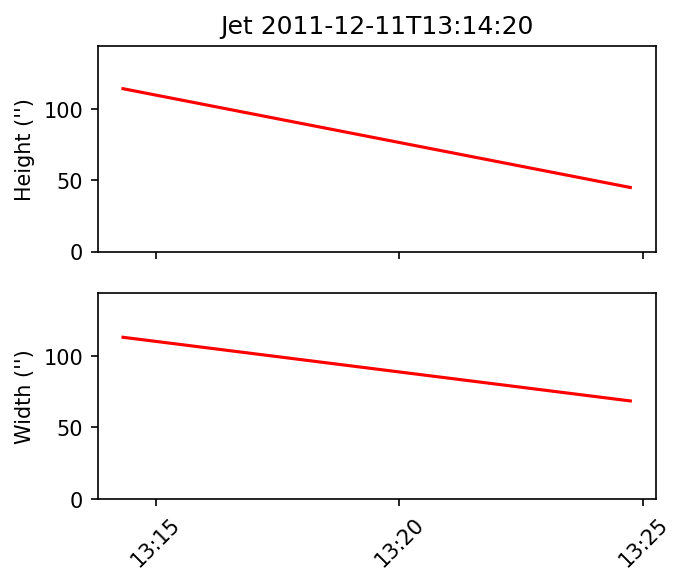

Jet start
Start base -537.037 -271.46
0.6149052280663673


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -418.37 -279.37
0.5745974421506844


Start base -419.365 -285.515
0.24311973277577859


Start base -411.119 -287.203
0.30775726802358233


Start base -425.303 -299.985
0.6221421796395319


Start base -461.03 -302.034
0.9990961732031424


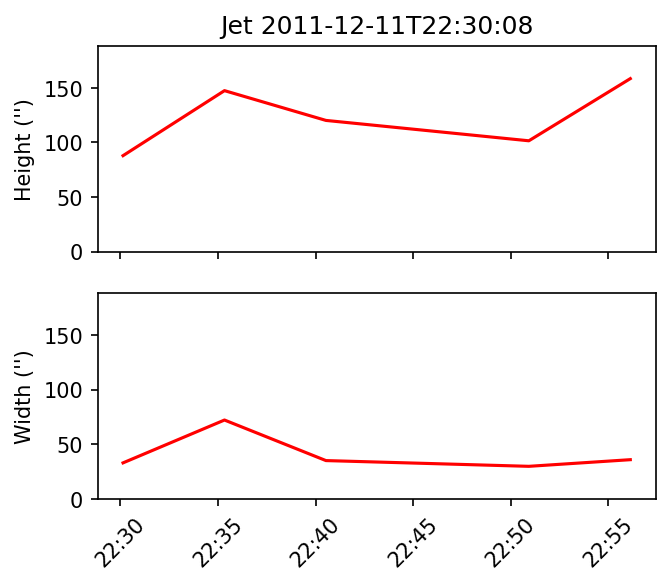

Jet start
Start base -418.37 -279.37
1.0379264195694586


Start base -445.733 -290.383
1.0000000070297987


Start base -471.388 -313.601
0.4004232799185909


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


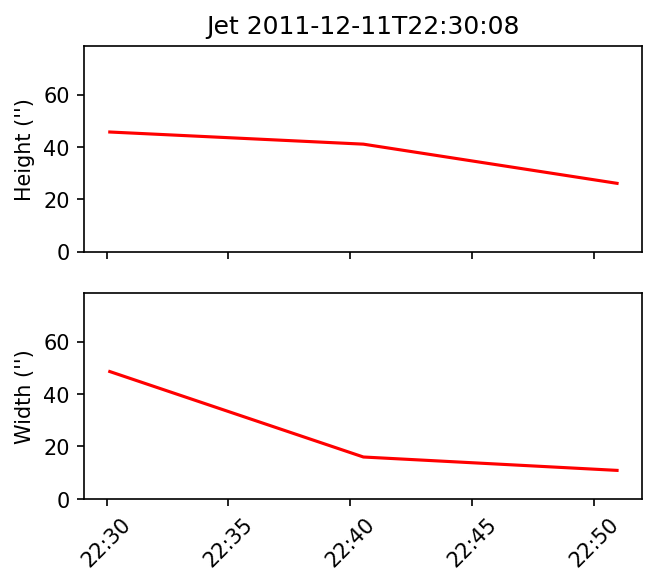

Jet start
Start base -418.909 -259.859
0.5386120397951375


Start base -417.715 -269.828
0.32084460432861805


Start base -407.681 -276.1
0.1356472531467403


Start base -437.301 -287.441
0.21300985508683634


Start base -448.647 -291.735
0.35471943587507093


Start base -419.005 -300.432
0.2845984502469971


Start base -423.662 -300.032
0.25269530887166086


Start base -420.736 -300.992
0.21000811254995655


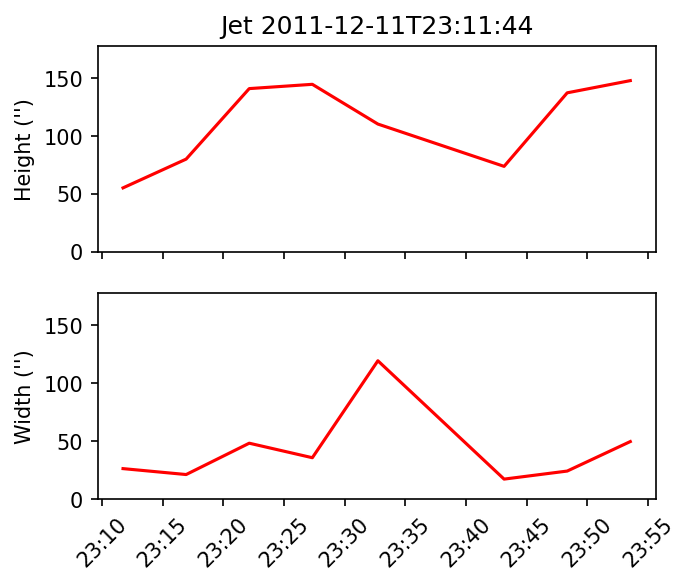

Jet start
Start base -450.621 -319.066
0.8855428208264795


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -448.647 -291.735
0.16118495772019148


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -872.635 -376.534
0.2712753312526847


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -806.675 -517.829
0.7369468103723905


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -838.127 -403.537
0.19900810920015188


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -870.746 372.621
0.14596592910841302


Start base -865.006 394.993
0.15951923243843882


Start base -860.027 409.276
0.14834121047380597


Start base -852.919 415.75
0.20729198493494086


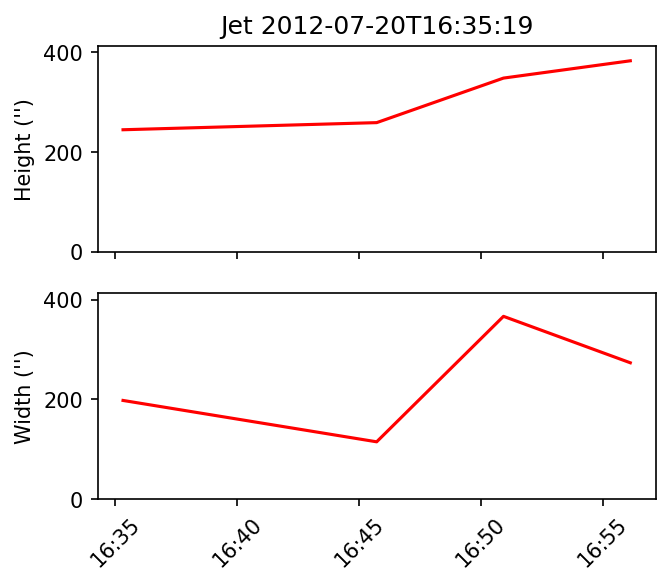

Jet start
Start base -858.267 417.025
0.6374554387753202


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -666.721 328.627
0.21451092964305077


Start base -662.093 331.06
0.21182376229216632


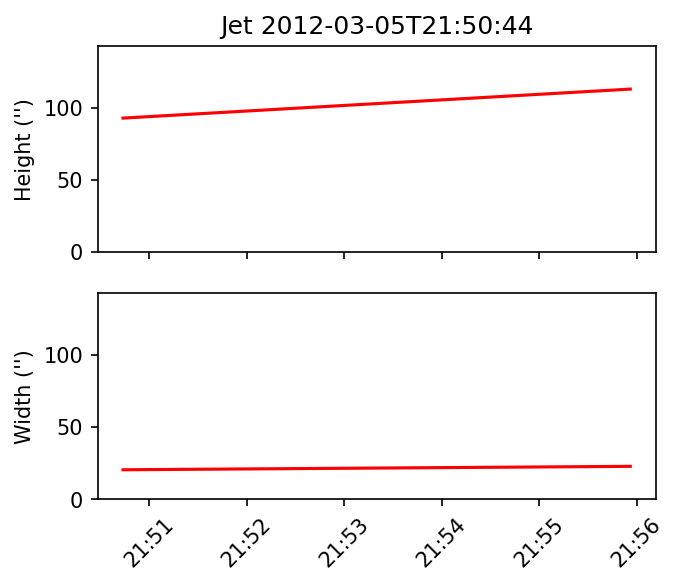

Jet start
Start base -602.477 353.885
0.42897157985508094


Start base -639.198 360.37
0.32690440731755643


Start base -624.855 359.742
0.10032228609627107


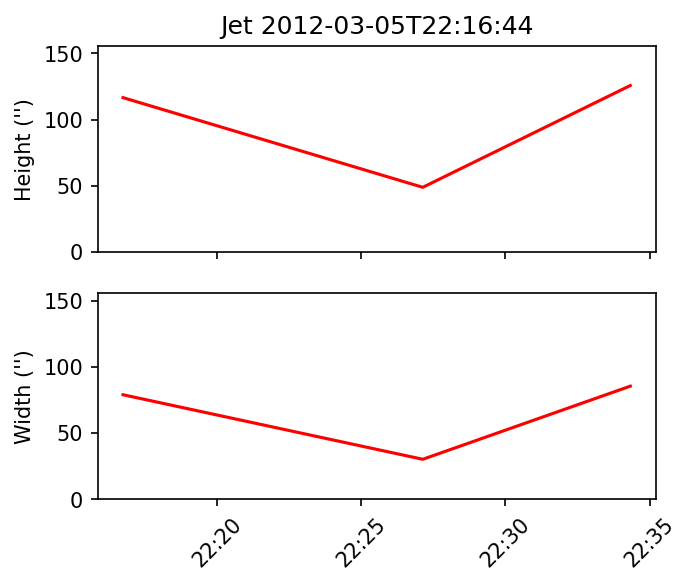

Jet start
Start base -198.312 959.454
0.7092624052712428


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -211.837 959.772
0.7747732287003631


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 812.254 544.381
0.1846483208996058


Start base 809.522 547.905
0.24880279038892605


Start base 806.46 546.658
0.21840903532411762


Start base 809.948 553.724
0.5334801158194562


Start base 809.323 557.591
0.5240212290863285


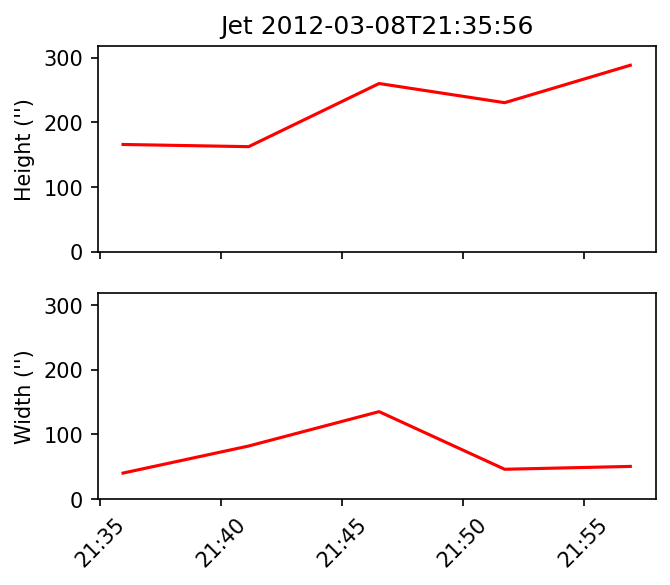

Jet start
Start base 180.205 -963.191
0.5674773458808589


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 180.205 -963.191
0.6225667480806557


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 235.063 -956.907
0.2711224338127276


Start base 213.204 -956.472
0.7951712033220419


Start base 226.263 -950.689
0.3476768622420352


Start base 217.102 -951.932
0.33526614044136455


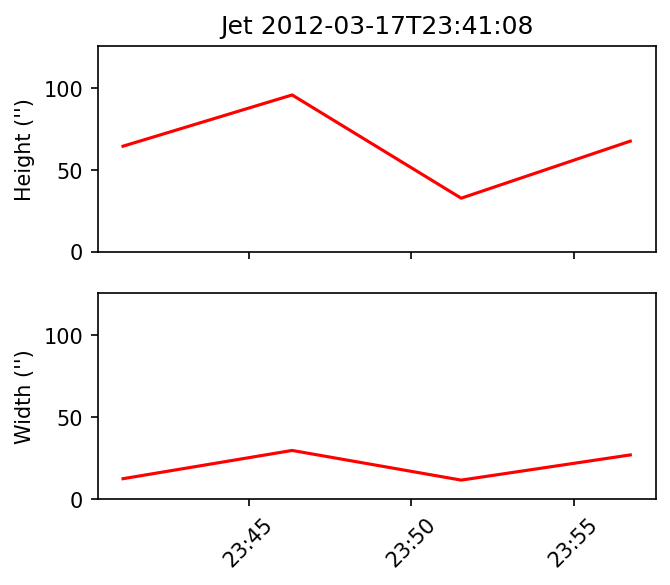

Jet start
Start base 213.204 -956.472
0.20243091905702187


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 266.596 -939.761
0.5555569574153654


Start base 225.885 -954.547
0.32025841206705974


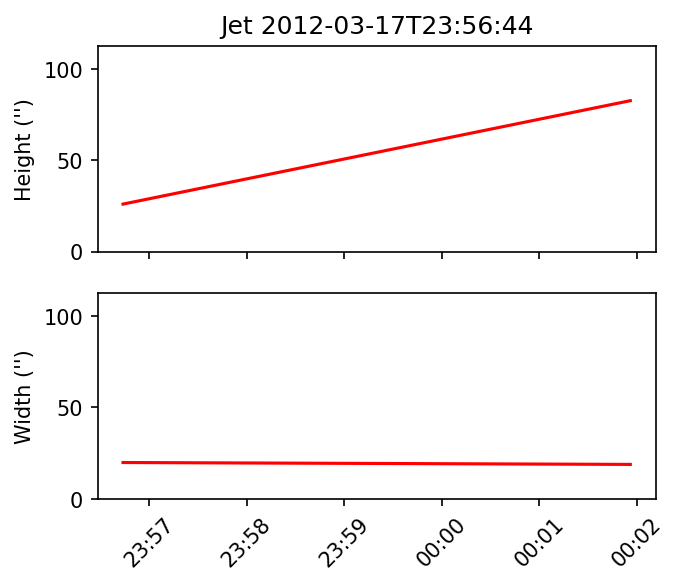

Jet start
Start base 205.725 -954.798
0.3110176772817417


Start base 204.6 -959.741
0.4664921114577371


Start base 232.52 -948.512
0.15478102767861202


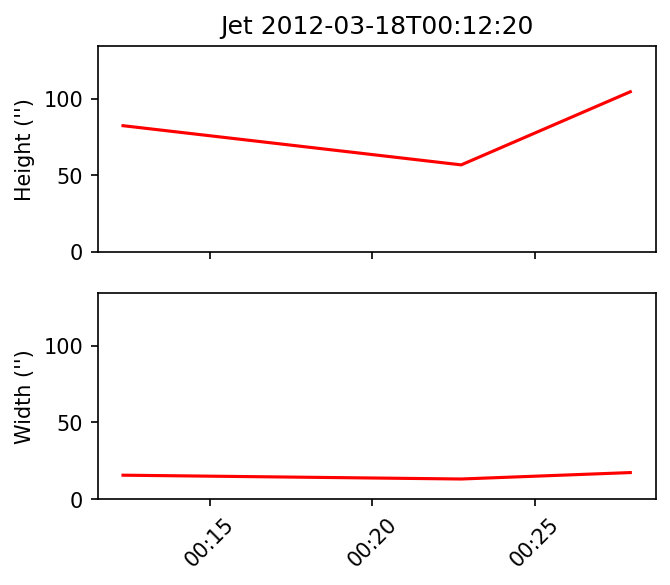

Jet start
Start base 237.417 -956.627
0.16052753773500553


Start base 225.788 -952.27
0.3000550136703245


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


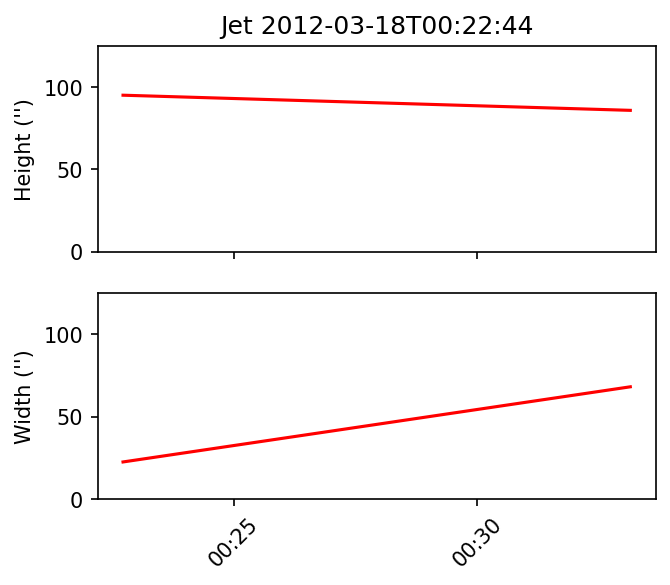

Jet start
Start base 220.477 -958.799
0.5679574134385086


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 233.89 -951.747
0.24389821370088133


Start base 233.406 -946.113
0.8114131853153488


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


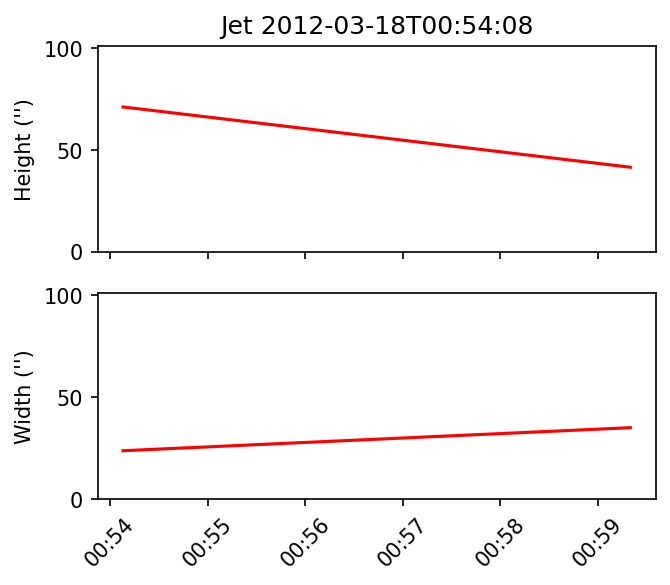

Jet start
Start base 925.112 205.803
0.8201985873873345


Start base 933.861 203.181
0.5553619018501018


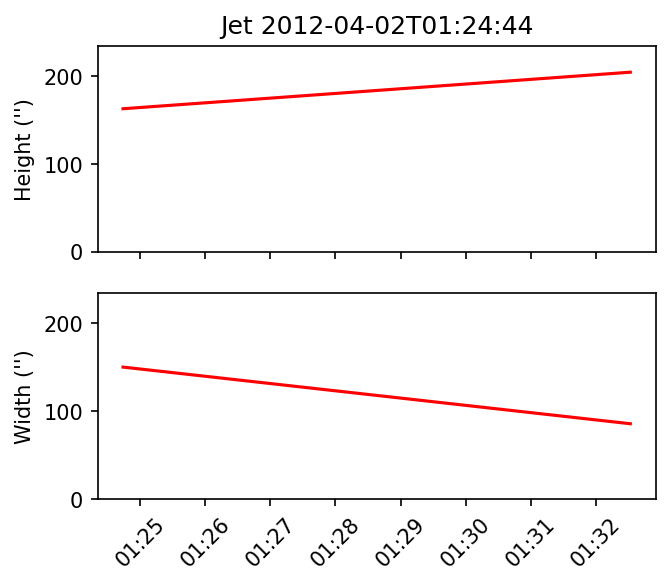

Jet start
Start base 933.569 202.453
0.36505020010904243


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 967.096 49.2887
0.26693535930678935


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 943.13 186.316
0.7565325560457026


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 967.096 49.2887
1.0000000026483962


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 965.102 96.7482
0.5218682112573266


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 965.102 96.7482
0.6060778424168078


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 965.102 96.7482
1.000000657718294


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 929.884 198.704
0.6371805193241353


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 922.863 159.342
0.4024976753518708


Start base 935.632 203.081
0.5828056463281572


Start base 936.492 198.447
0.16000856283765702


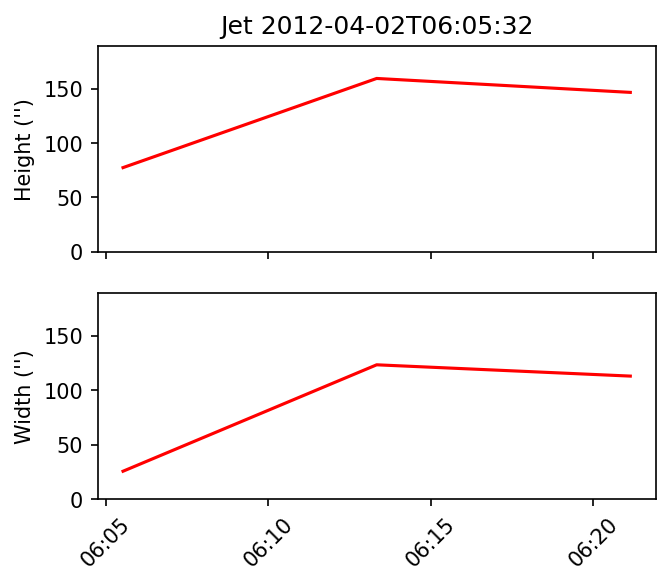

Jet start
Start base 922.863 159.342
0.5170681023695622


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 965.121 81.0475
0.28099751847261883


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 965.121 81.0475
1.0000322608311327


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 967.057 76.6508
0.5158085266804456


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 967.057 76.6508
0.679517762766554


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 945.942 -22.0347
0.4562844806693502


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 944.512 185.296
0.47057594005552755


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 945.942 -22.0347
0.772571551111679


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 939.436 201.552
0.7534306041728037


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 939.436 201.552
1.0026362460882525


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 925.836 194.617
0.8408758211506699


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 943.488 194.248
0.6484946092242179


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 941.208 192.085
0.2688564916124154


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 966.255 83.1272
0.7168544846267254


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 947.327 181.434
0.2988806112779736


Start base 949.225 180.35
0.25118434273562945


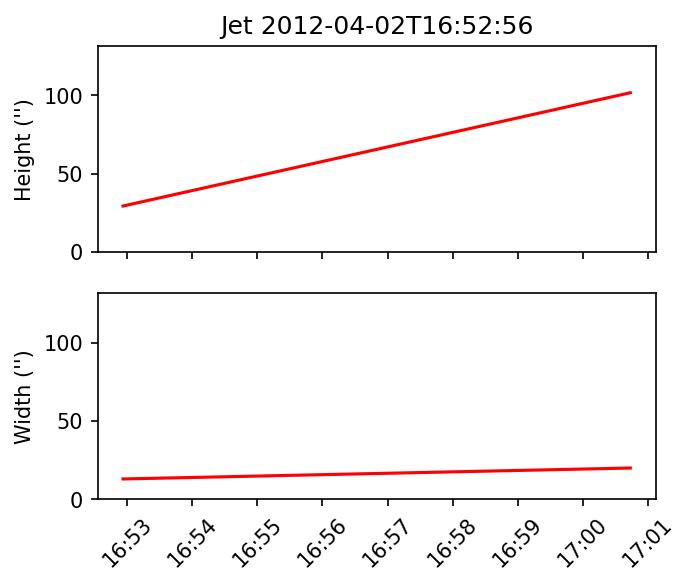

Jet start
Start base 947.327 181.434
0.6961263440565086


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 947.327 181.434
1.0103291914512065


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 946.391 177.92
0.30974331905375807


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 946.391 177.92
0.4478438259118474


Start base 948.06 176.445
0.3545081925851963


Start base 946.2 176.252
0.3753385172676145


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


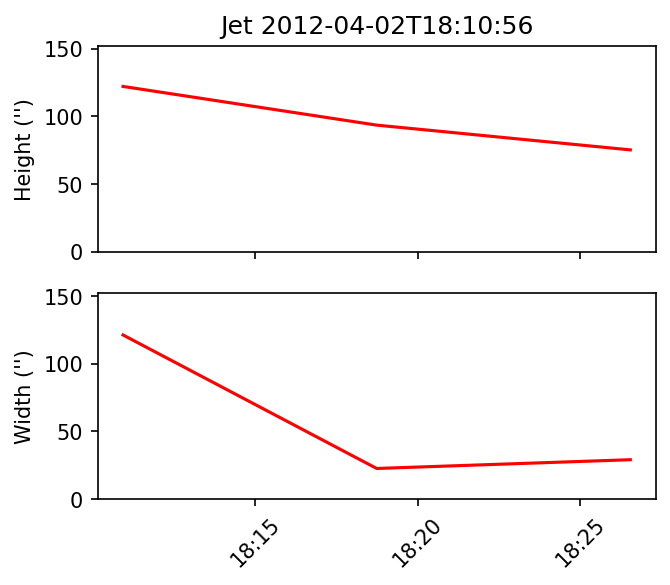

Jet start
Start base 946.391 177.92
1.000000002699648


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 947.348 178.904
0.5173727338720777


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 947.348 178.904
0.3052246981499136


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 951.016 174.262
0.35669799961657


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 951.016 174.262
0.32978953798743554


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 941.952 199.812
0.98085390253808


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 941.515 42.2791
1.0001359604172588


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 945.512 191.392
0.17932176932587374


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 954.91 141.864
0.4781724070090152


Start base 956.331 146.917
0.7308496418907089


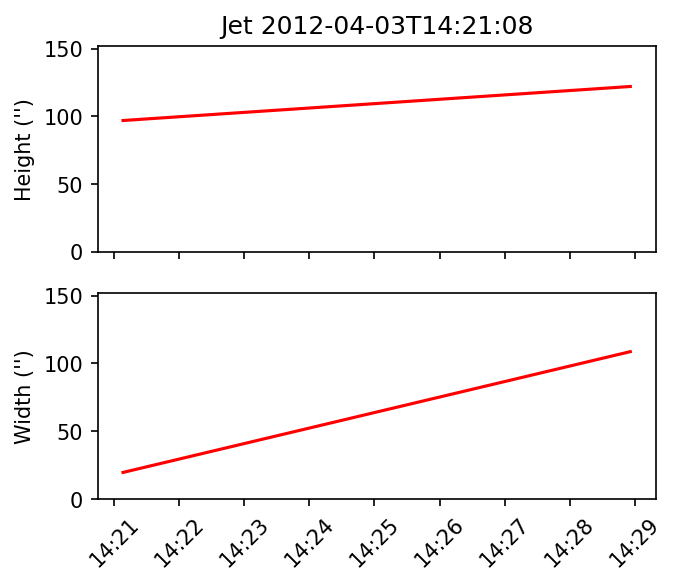

Jet start
Start base 954.91 141.864
0.5340946707840828


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 947.22 194.354
0.5138410860167101


Start base 947.127 194.998
0.2643978756923094


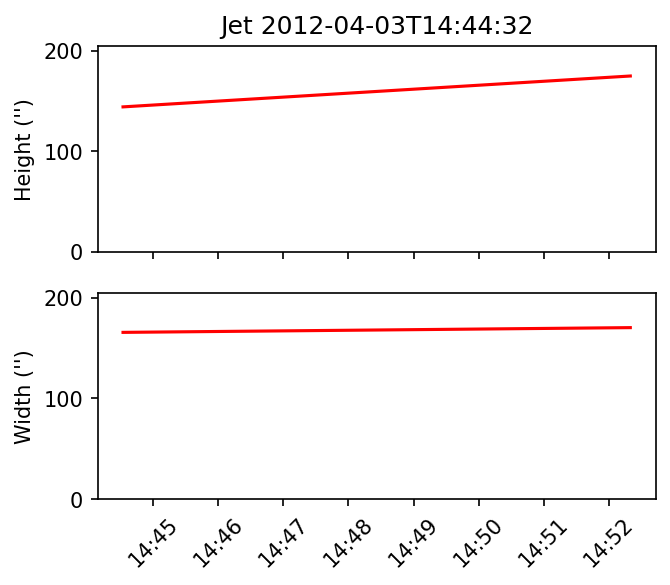

Jet start
Start base 854.085 175.844
0.1278507177546597


Start base 858.743 172.126
0.3962775972233478


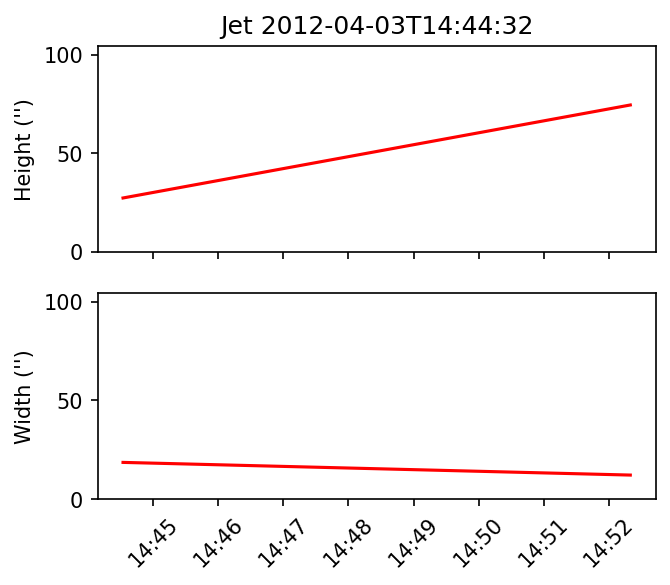

Jet start
Start base 946.751 173.878
0.7485693704197042


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 960.344 157.919
0.7088172305678258


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 960.344 157.919
0.9276490290682528


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 953.277 200.472
0.27575955886549414


Start base 957.139 -121.312
0.5886023023717046


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


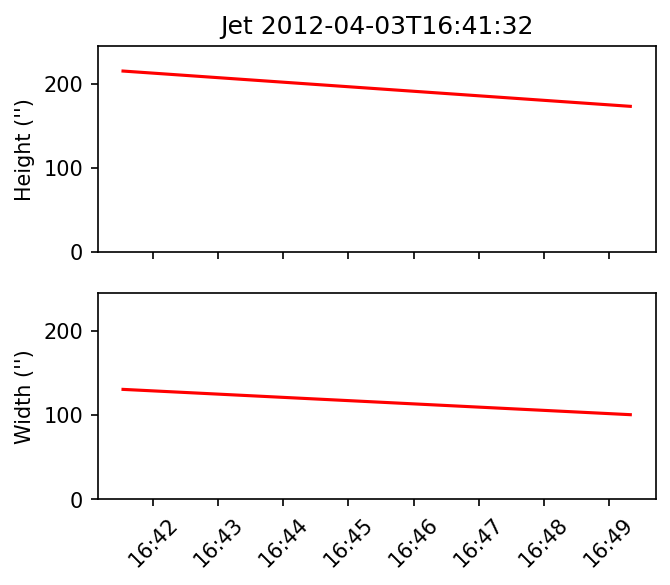

Jet start
Start base 953.277 200.472
0.6901504112067355


Start base 957.139 -121.312
0.11168092245813863


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


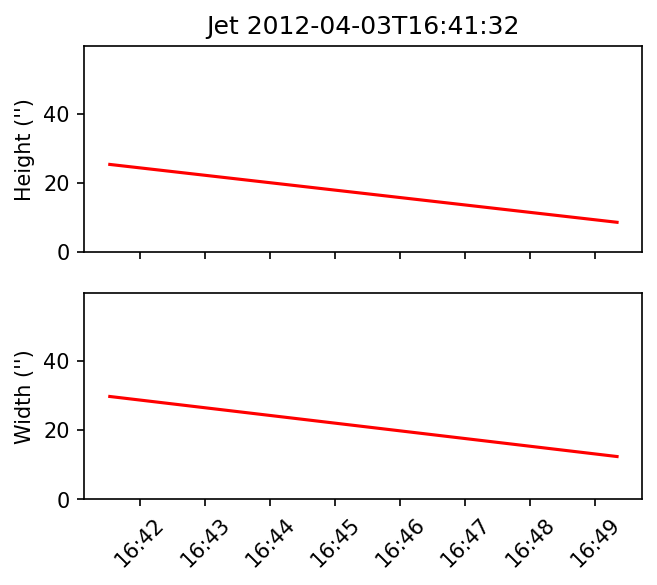

Jet start
Start base 957.139 -121.312
0.3418565349348494


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 964.156 -123.845
0.6426816000112779


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 952.276 173.788
0.3331063728532723


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 964.156 -123.845
0.37711037955254717


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 948.25 187.475
0.5720235657101415


Start base 952.675 193.904
0.5514774851260507


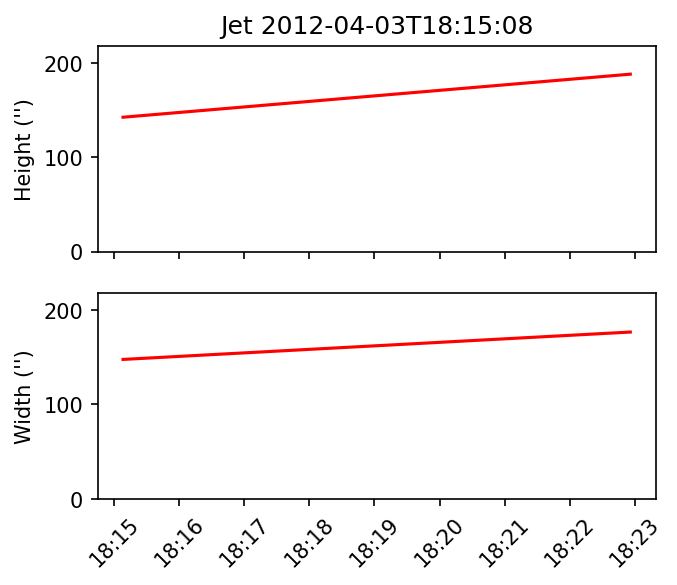

Jet start
Start base 961.371 184.895
0.7202159038996988


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 951.591 40.0885
0.7973705721192854


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 202.921 591.753
0.3126861468913682


Start base 207.507 570.437
0.7480933105302173


Start base 204.724 614.776
0.4064497068820049


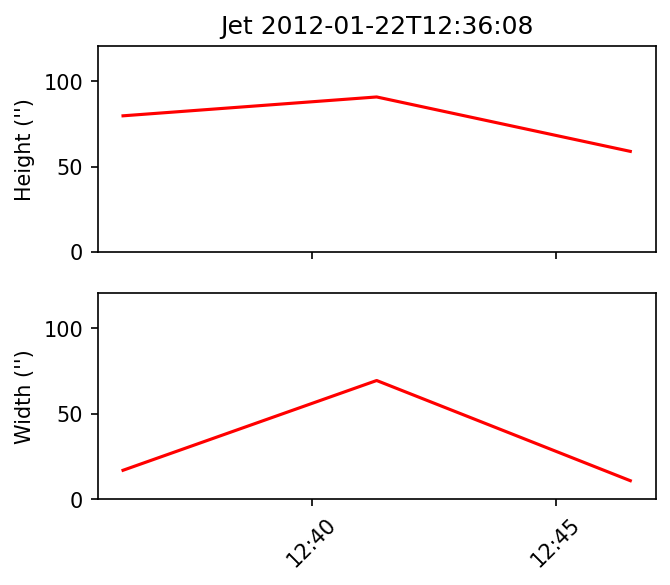

Jet start
Start base 202.921 591.753
0.29060492411687555


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 269.322 378.97
0.7480796302819314


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 208.018 612.564
0.283009896718624


Start base 209.161 613.592
0.8386997175276232


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


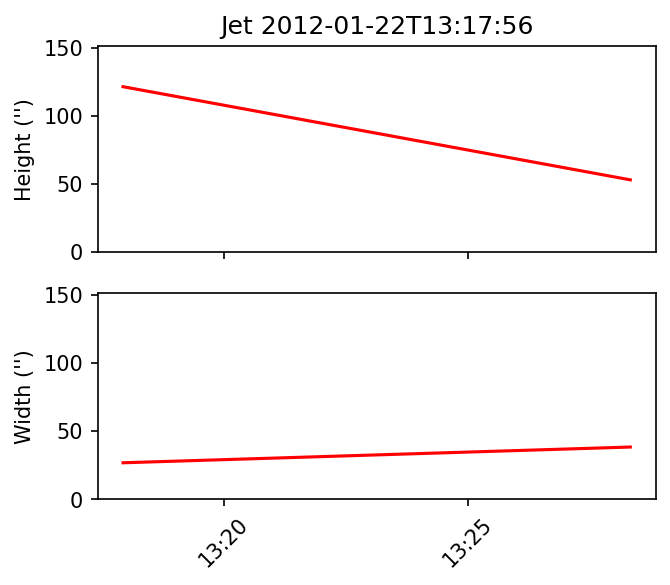

Jet start
Start base 209.161 613.592
0.5307532952764078


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 209.161 613.592
0.3939211457206171


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 214.004 603.707
0.7584665961568402


Start base 217.643 599.48
0.35469486475670114


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


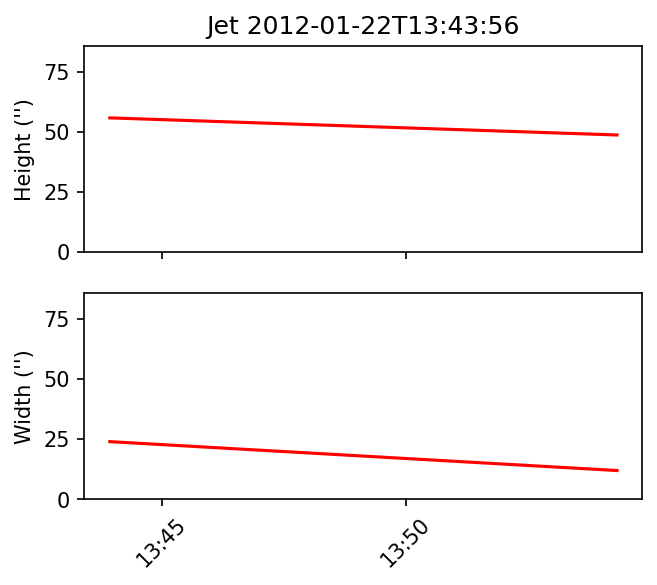

Jet start
Start base 99.6415 987.483
0.465272244066874


Start base 101.84 984.151
0.8251216020191108


Start base -105.403 984.806
0.27950239221783557


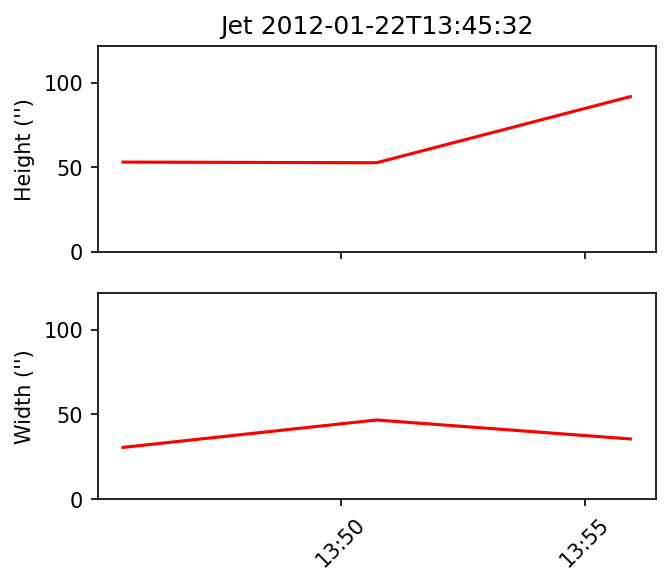

Jet start
Start base -116.665 979.621
0.09891897605190135


Start base -113.833 980.857
0.2579007824832943


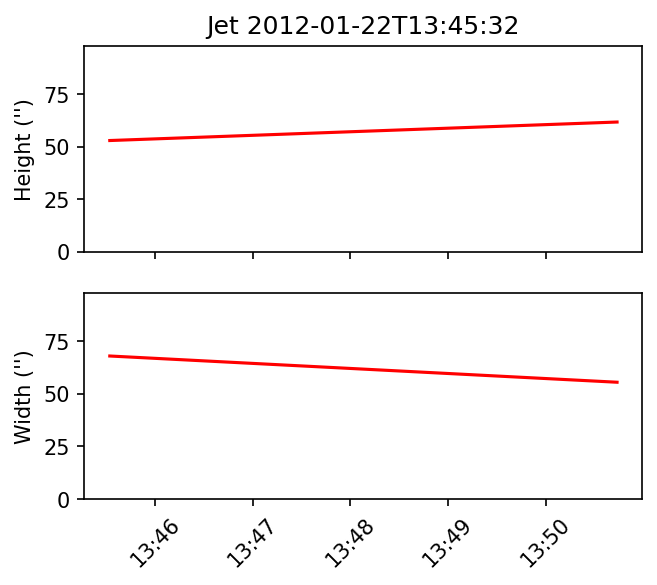

Jet start
Start base 317.984 933.647
0.7224791029395904


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 317.244 936.376
0.2619727798654426


Start base 310.492 937.395
0.16667479588782605


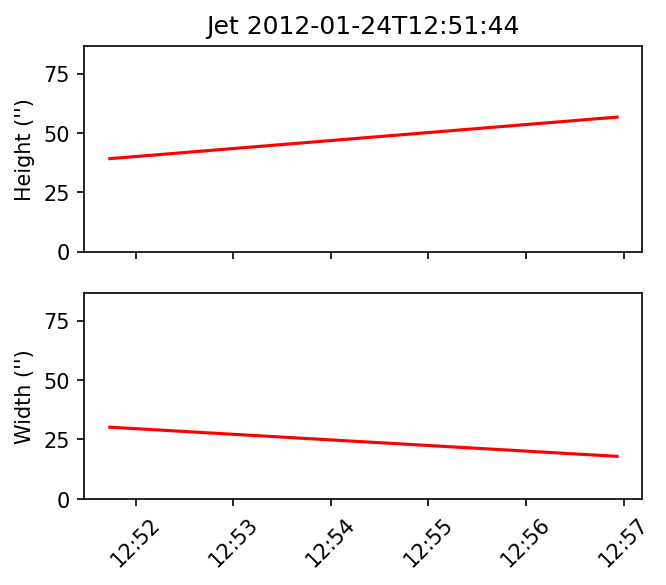

Jet start
Start base 338.124 924.027
0.09096252367334609


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 108.219 951.818
0.17972173004683717


Start base 124.953 952.941
0.25221201138099736


Start base 124.243 952.13
0.30808702078394595


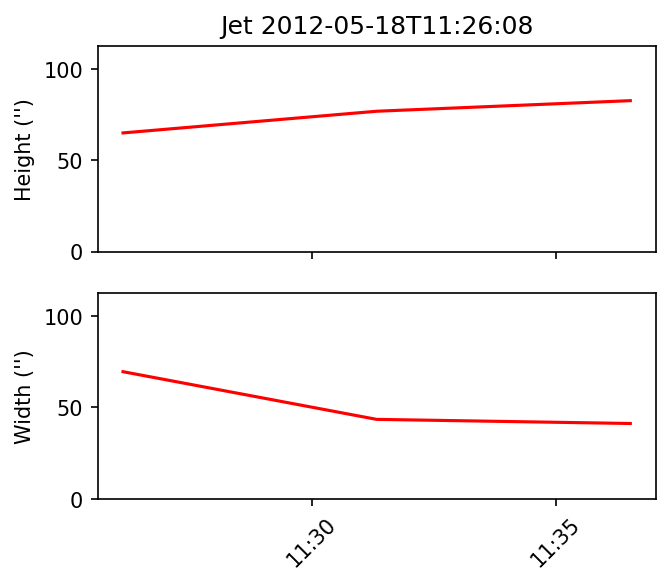

Jet start
Start base -689.39 668.867
0.26967376838519513


Start base -685.206 671.029
0.09893743498152623


Start base -680.556 672.895
0.23859664340464667


Start base -675.8 674.273
0.1040218272383626


Start base -678.461 670.854
0.3993005679654777


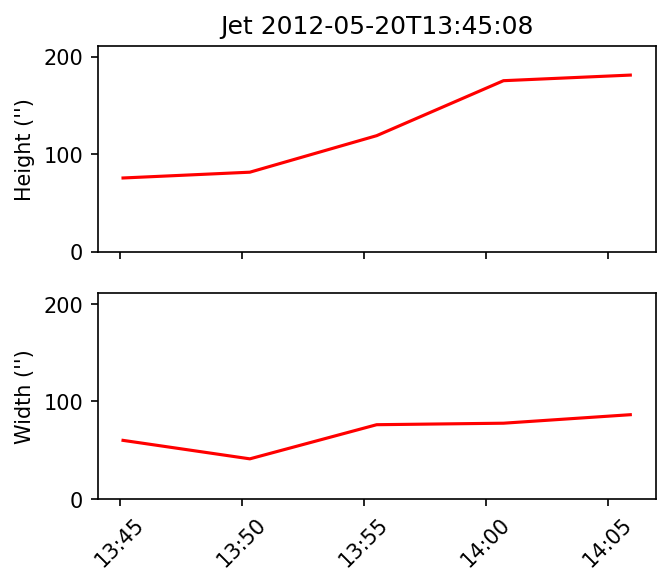

Jet start
Start base -700.692 662.743
0.2935668099166536


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -154.835 -275.451
0.7095370185594002


Start base -155.085 -274.294
0.7430332940240901


Start base -153.357 -269.977
0.5275419384471938


Start base -151.071 -274.766
0.6144227554766223


Start base -149.788 -281.59
0.28559907698108866


Start base -148.667 -281.244
0.5204924595444339


Start base -147.633 -275.751
0.6788861174081238


Start base -147.782 -274.98
0.37081290304837483


Start base -145.841 -281.23
0.24586306424431753


Start base -144.709 -280.745
0.3377383372551321


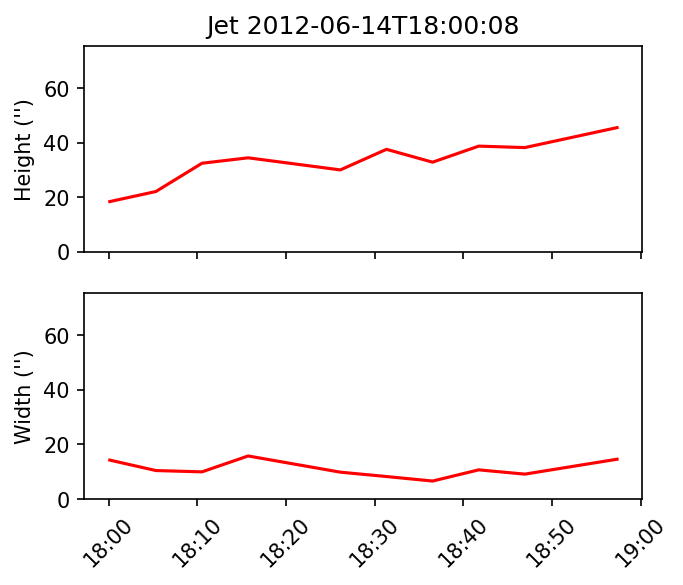

Jet start
Start base -154.835 -275.451
1.0000013675554789


Start base -154.393 -285.693
0.8172907592642984


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


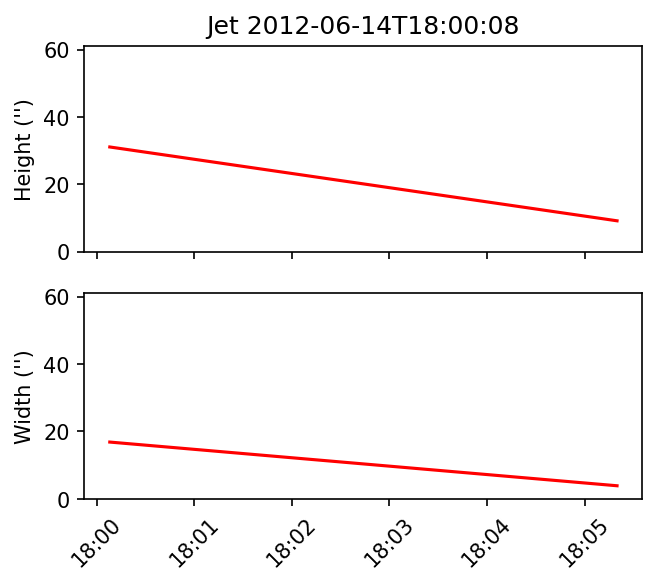

Jet start
Start base -128.523 -294.217
0.7630016169671802


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -129.812 -304.284
0.6871361623663761


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -147.502 -282.556
0.566713750790038


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -142.176 -276.808
0.27050259152812395


Start base -139.713 -278.068
0.2639977873610046


Start base -141.08 -277.886
0.18660901522528406


Start base -139.841 -273.447
0.21145893174452346


Start base -139.278 -273.349
0.43506475377900083


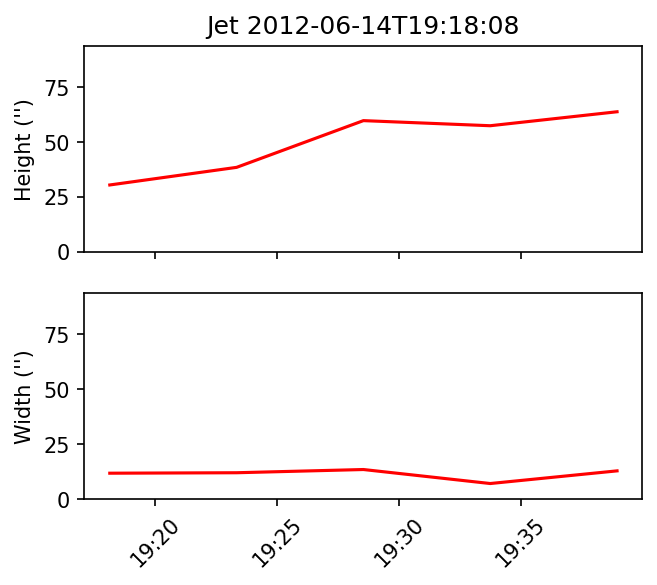

Jet start
Start base -117.449 -292.569
0.9214968840005994


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -136.583 -280.308
0.4172125866420863


Start base -132.816 -279.169
0.39709700254180713


Start base -131.835 -279.091
0.3669824005855117


Start base -131.779 -280.124
0.2938930466132804


Start base -131.048 -278.994
0.332382937830511


Start base -132.872 -275.668
0.45253074742502775


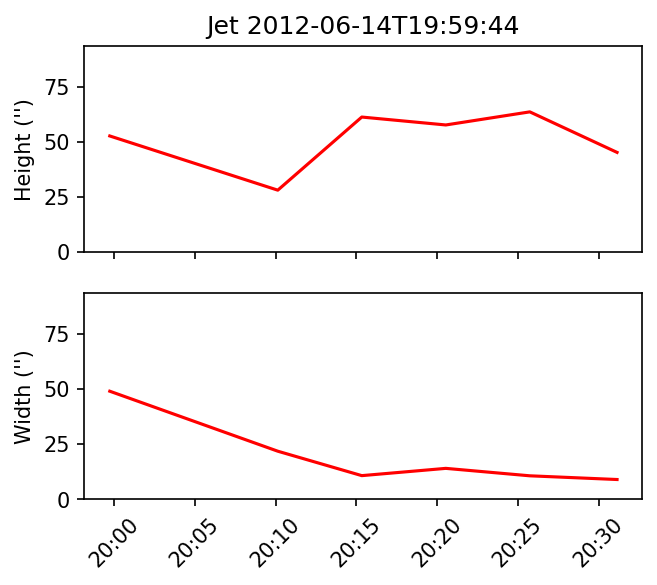

Jet start
Start base -136.583 -280.308
0.6884645840354786


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -135.147 -276.678
0.8033172119480352


Start base -131.048 -278.994
0.5834335451643533


Start base -134.138 -282.167
0.38731119110786383


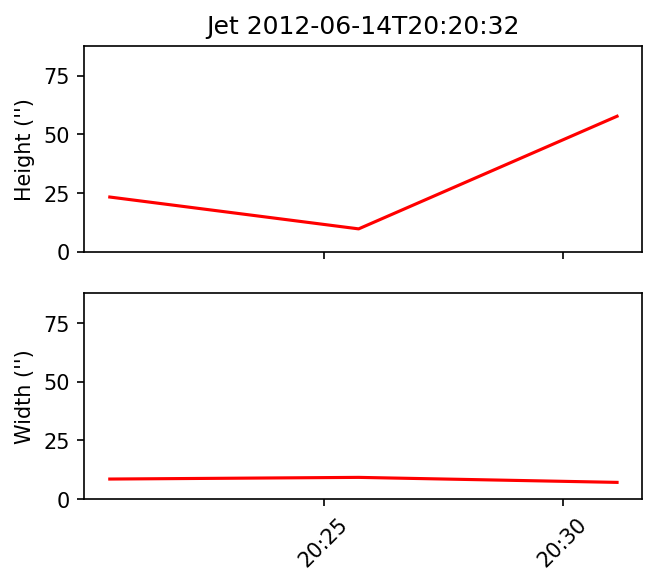

Jet start
Start base -130.241 -275.265
0.2396320993366469


Start base -127.749 -275.238
0.6682008866315943


Start base -120.03 -292.53
0.38977789236009663


Start base -124.939 -281.319
0.8286157684405705


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


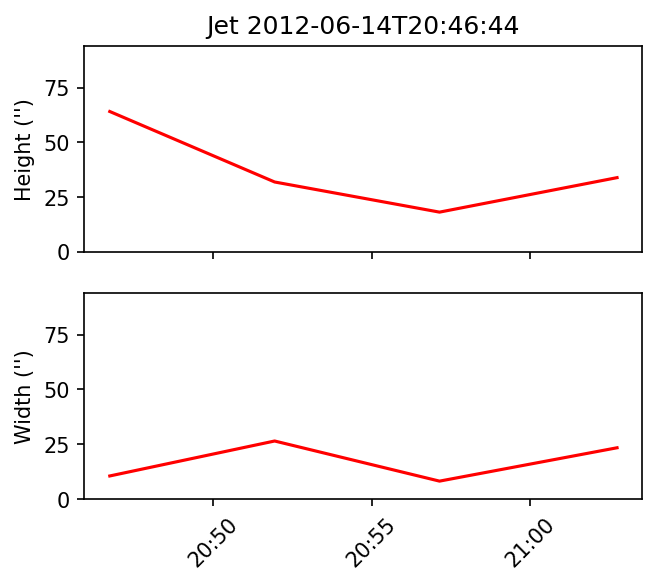

Jet start
Start base -125.353 -276.995
0.8015797541103201


Start base -124.28 -278.931
0.4267341418129428


Start base -120.95 -280.01
0.28105831675669846


Start base -121.982 -281.762
0.21049021861275183


Start base -121.344 -281.474
0.5925261478944739


Start base -119.585 -279.174
0.3772933749074585


Start base -119.943 -278.311
0.6557199091260375


Start base -109.274 -294.078
0.2876541765054984


Start base -117.607 -278.197
0.5884778776775016


Start base -116.039 -277.327
0.3399037594212583


Start base -116.026 -278.032
0.3487828729689492


Start base -113.46 -278.727
0.26495721063469274


Start base -114.584 -276.459
0.7230769116309312


Start base -113.208 -275.724
0.4195279266658932


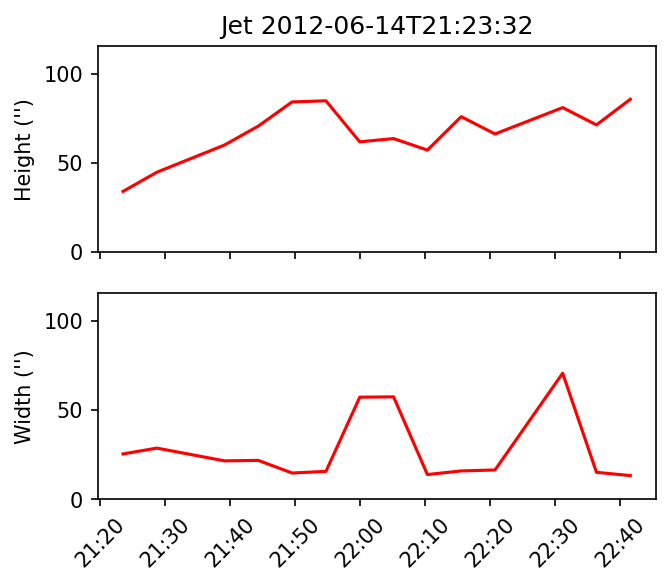

Jet start
Start base -125.353 -276.995
0.9130574259490978


Start base -115.088 -295.138
0.22728299208763467


Start base -113.254 -292.082
0.5834598080361773


Start base -123.528 -275.94
0.6319486382075347


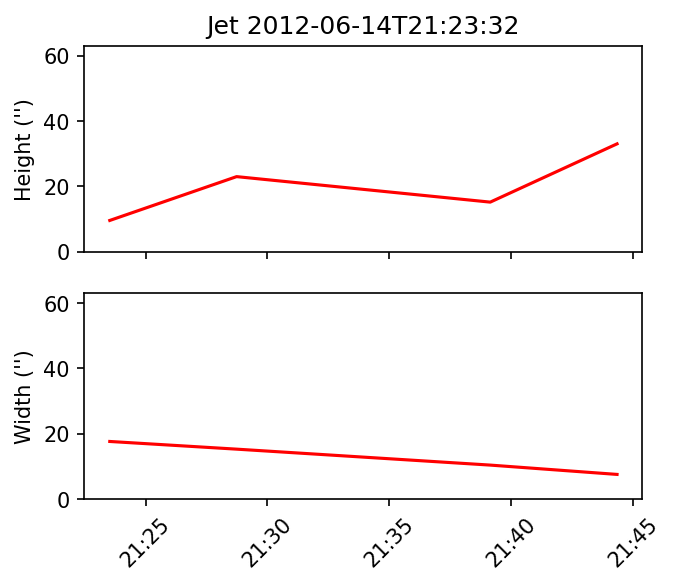

Jet start
Start base -109.274 -294.078
0.71023842889342


Start base -95.5272 -302.332
0.884772137442663


Start base -116.039 -277.327
0.5393831098247508


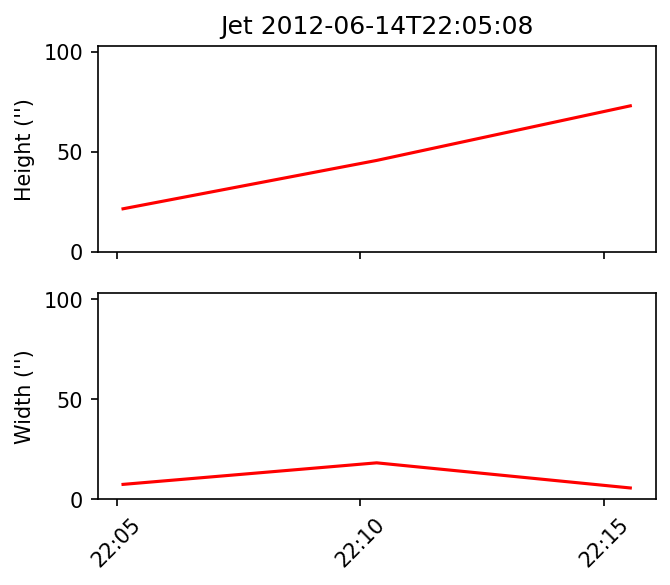

Jet start
Start base -116.039 -277.327
1.0181792469625133


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -113.208 -275.724
1.0000003223925553


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -117.794 -944.053
0.7976743977082322


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -122.928 -888.481
1.0000000145173569


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 24.1452 -953.877
0.1324295132160532


Start base 26.2146 -961.436
0.17659791240158465


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


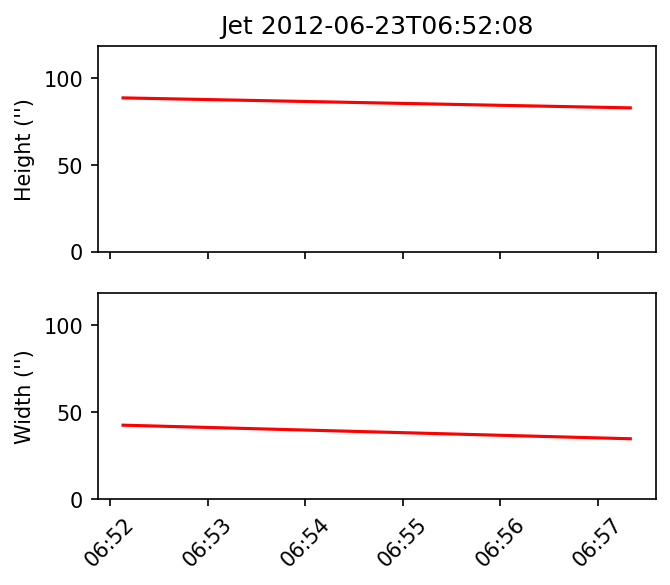

Jet start
Start base -144.327 -954.765
0.6956573537820787


Start base -147.673 -948.957
0.3794631018339936


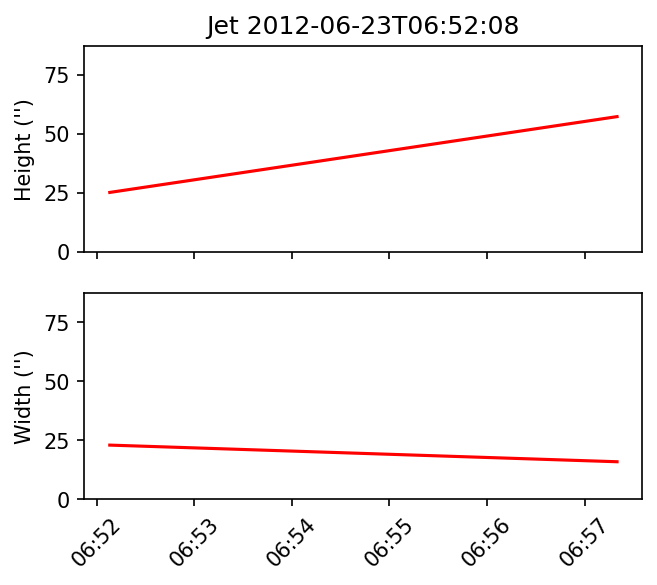

Jet start
Start base -236.748 -928.317
0.10666381099487074


Start base -233.374 -928.259
0.10088688109893558


Start base -234.602 -929.495
0.11322721632708092


Start base -236.441 -940.56
0.10748466785754465


Start base -233.068 -930.462
0.10967618635801454


Start base -228.136 -929.708
0.1988778389381015


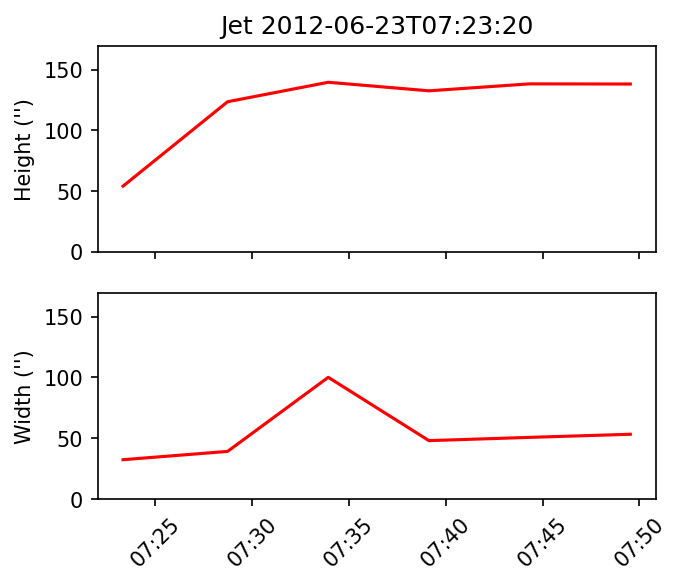

Jet start
Start base -60.7554 -917.927
0.8579129109853366


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -68.9073 -968.41
0.13718015775819845


Start base -68.2695 -956.5
0.24647107378110344


Start base -71.8889 -955.058
0.1814676536826454


Start base -77.5081 -955.345
0.11763799701854454


Start base -76.4283 -954.186
0.3544079514470118


Start base -68.7141 -953.123
0.39203547274393724


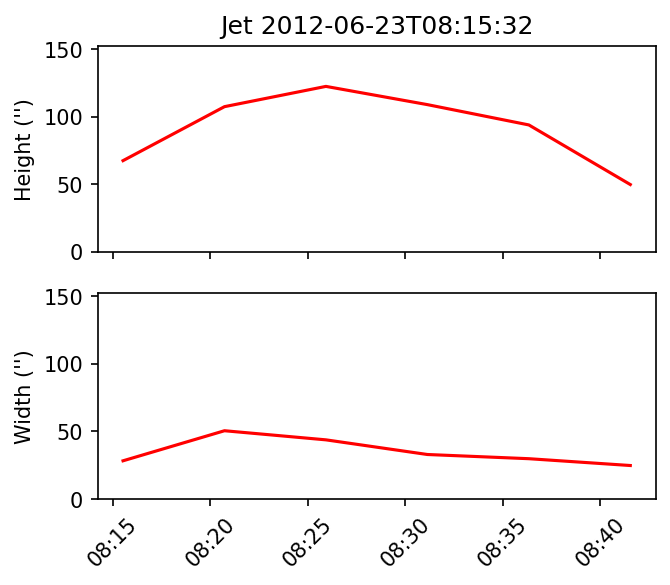

Jet start
Start base -218.771 -932.209
0.25217821017816966


Start base -215.743 -932.75
0.3668845375056235


Start base -221.253 -932.793
0.46105031958844855


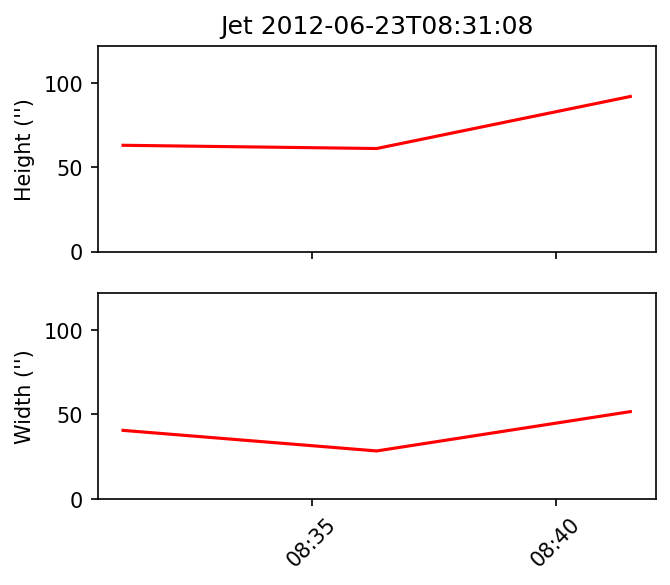

Jet start
Start base -76.4283 -954.186
0.3867586558926382


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -474.31 -541.456
0.27714426532901837


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -596.71 -564.496
0.8007201990358278


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -567.637 -479.118
0.91291133291828


Start base -574.443 -508.47
0.6999138772525489


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


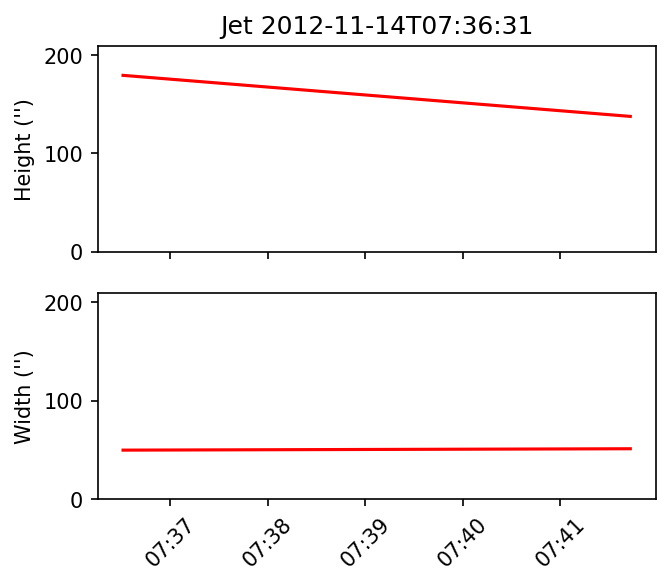

Jet start
Start base -578.254 -556.948
0.5661050187469004


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -953.026 -4.40995
0.2530684394768891


Start base -984.963 67.9642
0.3556669427108429


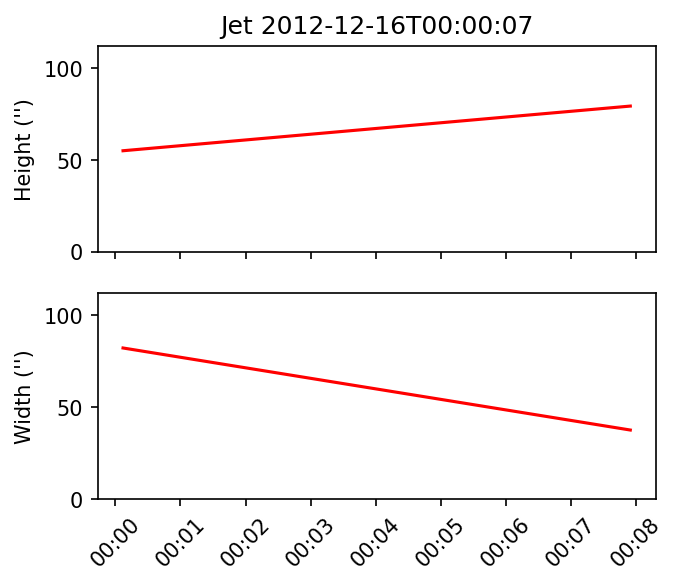

Jet start
Start base -945.63 281.658
0.3868782373353275


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -945.63 281.658
0.7174213879761908


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -961.077 224.183
0.562622144403048


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -963.199 213.917
0.23855437961058842


Start base -960.953 214.685
0.3512173742271369


Start base -959.05 223.415
0.7318593826050104


Start base -967.814 66.4428
0.8167670982248506


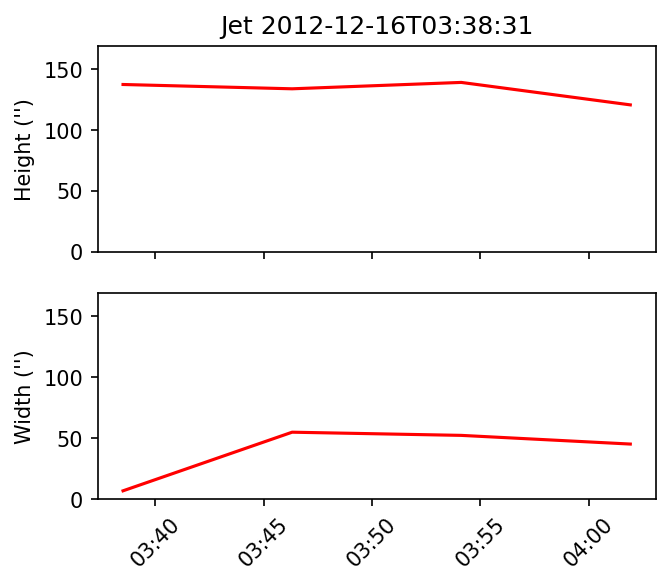

Jet start
Start base -959.05 223.415
0.5719350115384993


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -1004.23 -6.05026
0.5993367836003582


Start base -1042.21 14.0811
0.6797060955585452


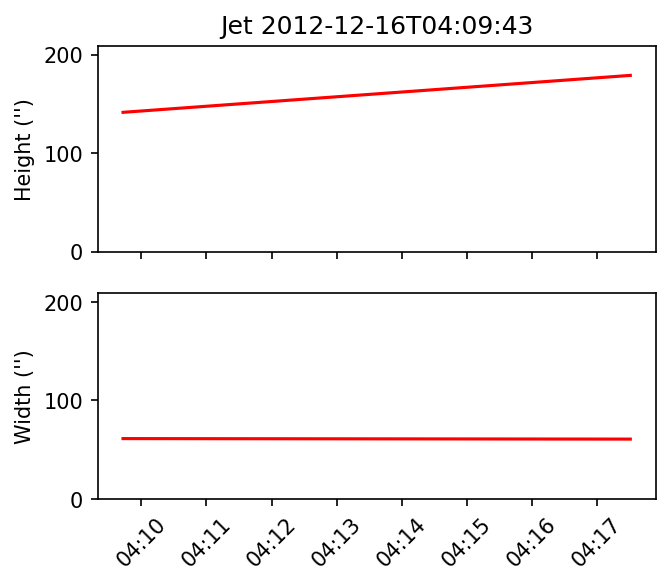

Jet start
Start base -1024.97 66.4855
0.9217370022409112


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -938.928 299.968
0.37073745944276976


Start base -939.477 298.956
0.16547534412979328


Start base -945.952 301.861
0.20211799507333822


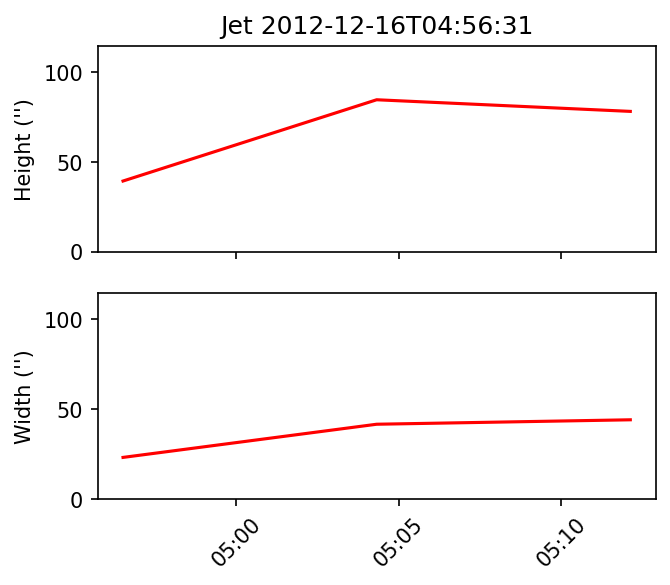

Jet start
Start base -985.828 81.97
0.9692941024269995


Start base -982.432 123.614
0.5849693424387594


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


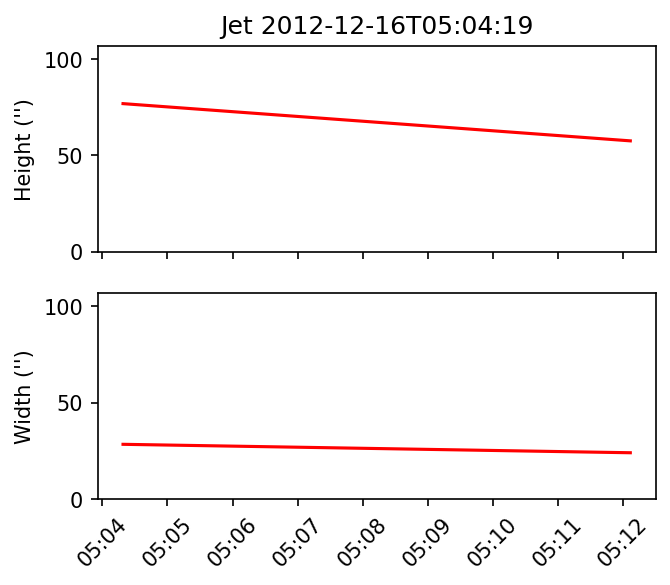

Jet start
Start base -982.432 123.614
0.3973096997175962


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -961.982 211.906
0.1716372506540887


Start base -962.773 212.863
0.50038616762599


Start base -977.665 135.691
0.7896196618581905


Start base -978.389 126.353
0.28978199463179605


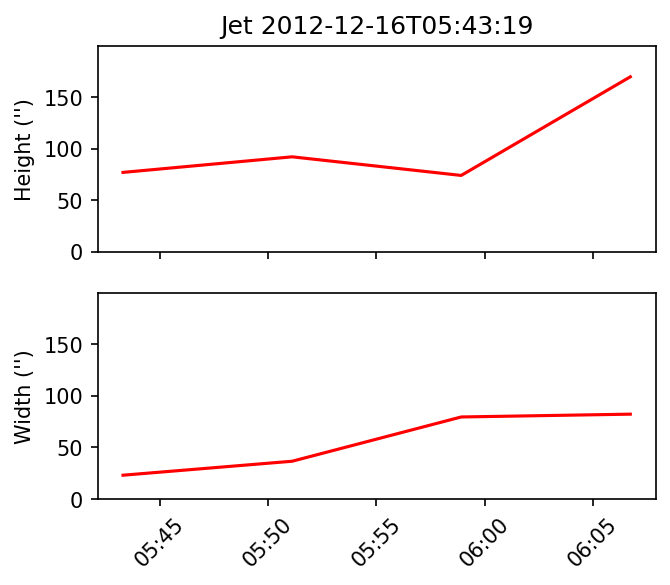

Jet start
Start base -934.347 -5.80549
0.49859427876446755


Start base -977.665 135.691
0.31492227108946935


Start base -1021.35 -5.8309
0.33351959011758386


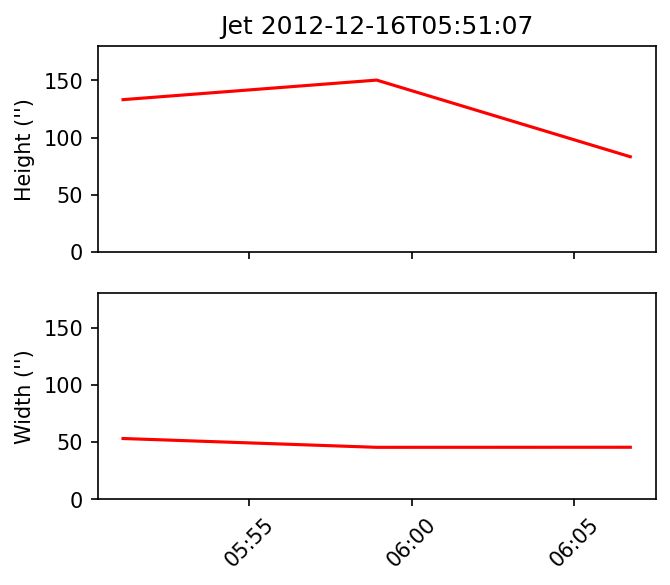

Jet start
Start base -976.704 133.03
0.7930303119327093


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -958.905 225.559
0.35051938619139433


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -988.184 26.1069
0.40680491626551935


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -960.094 211.887
0.2982407999497755


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -971.357 181.635
0.17608681632105294


Start base -968.682 182.118
0.2958206419803622


Start base -974.392 178.221
0.5964589890541105


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


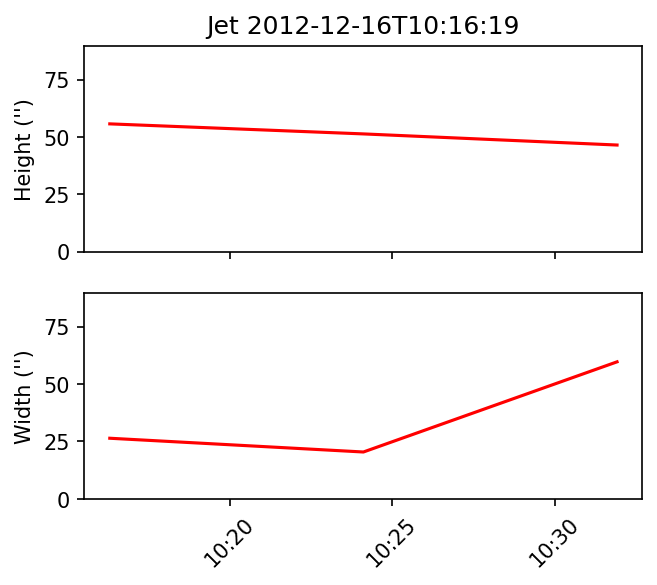

Jet start
Start base -968.682 182.118
1.0005163936203154


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -971.317 186.544
0.20511365081906846


Start base -970.366 188.511
0.21980165231989773


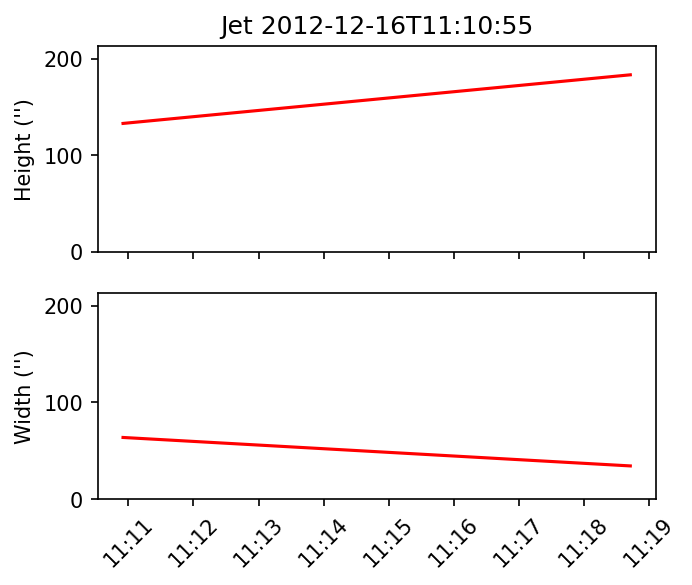

Jet start
Start base -957.11 223.074
0.7208400984971


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -968.666 163.437
0.2044981282642475


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -968.666 163.437
0.2770152497926008


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -972.815 189.118
0.9480628528567328


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -965.893 181.849
0.1630006388686196


Start base -984.164 183.501
0.18687155897060437


Start base -966.795 185.618
0.08170708669100898


Start base -966.413 187.702
0.1220787727076467


Start base -968.476 187.968
0.17285973114032804


Start base -964.574 183.279
0.06447661535781318


Start base -967.69 183.883
0.18475570206956055


Start base -967.483 176.708
0.19265628101546065


Start base -967.521 177.179
0.19745032101970406


Start base -967.488 182.586
0.19747173617634003


Start base -970.642 181.695
0.44967877434308257


Start base -966.817 182.36
0.1592829552320105


Start base -969.089 181.138
0.19741141612043073


Start base -965.894 186.682
0.2504523283688342


Start base -965.226 183.132
0.1283337598523876


Start base -969.063 179.141
0.14048540016255978


Start base -970.872 167.949
0.991094140023978


Start base -969.375 185.521
0.17923763770574594


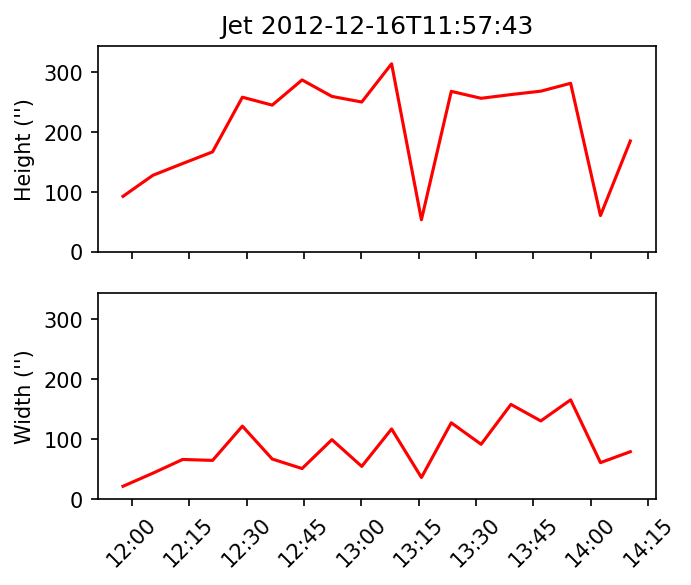

Jet start
Start base -984.358 102.711
0.3449175471373958


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -967.521 177.179
0.31393586379615385


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -970.642 181.695
0.1768846513347019


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -975.611 155.067
0.2684397238326623


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -944.896 285.075
0.17426747573910156


Start base -945.131 271.131
0.6922540850715563


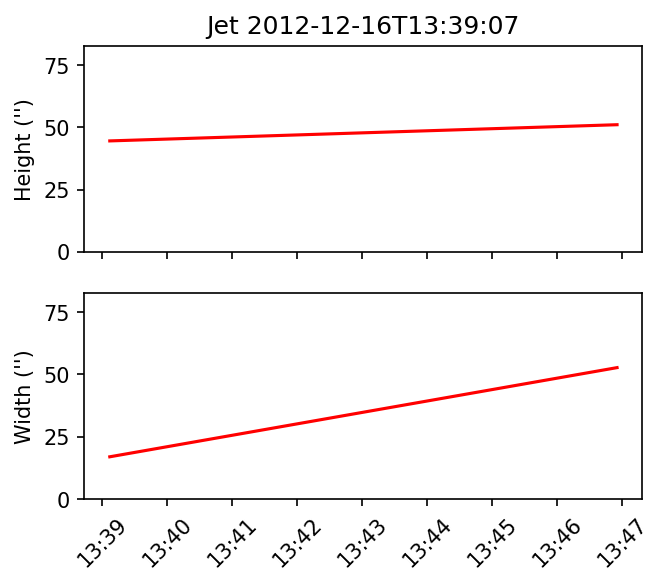

Jet start
Start base -970.872 167.949
0.09572291134900245


Start base -969.375 185.521
0.9711424149824175


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


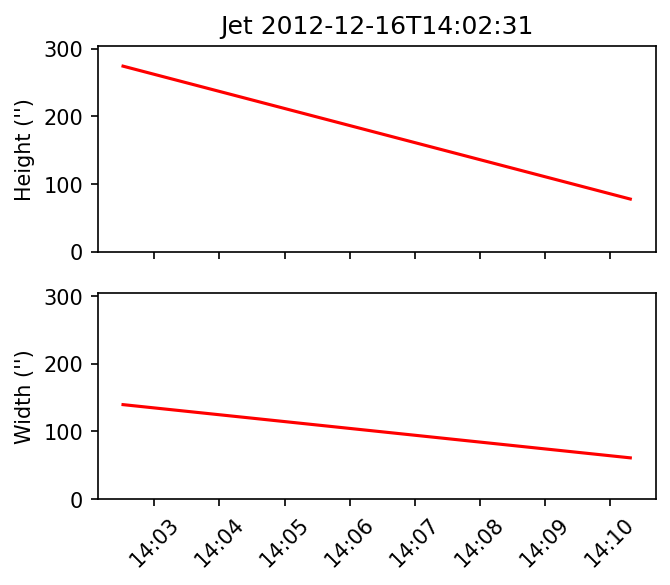

Jet start
Start base -966.847 194.018
0.09115250610413515


Start base -967.246 188.171
0.12666214353565833


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


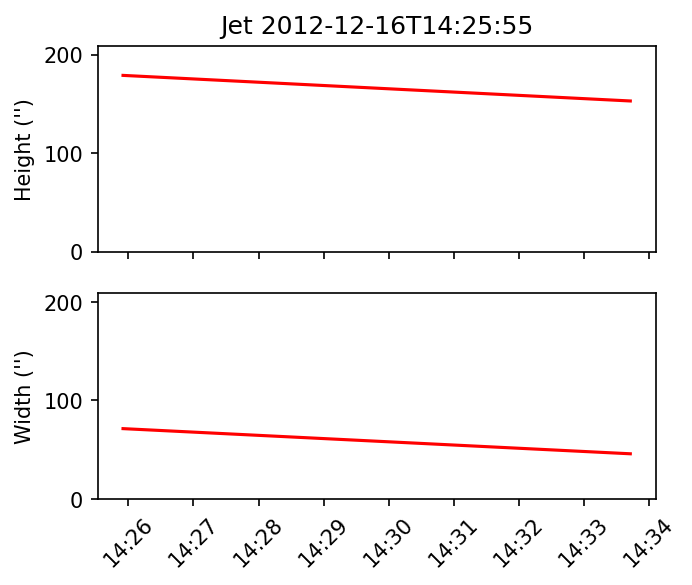

Jet start
Start base -980.044 124.397
0.40002655554353417


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -960.325 187.91
0.17500326009134445


Start base -966.489 185.363
0.17545997152147816


Start base -969.546 186.517
0.303699021746332


Start base -965.497 194.57
0.08799464575270638


Start base -959.681 208.154
0.8282453665590507


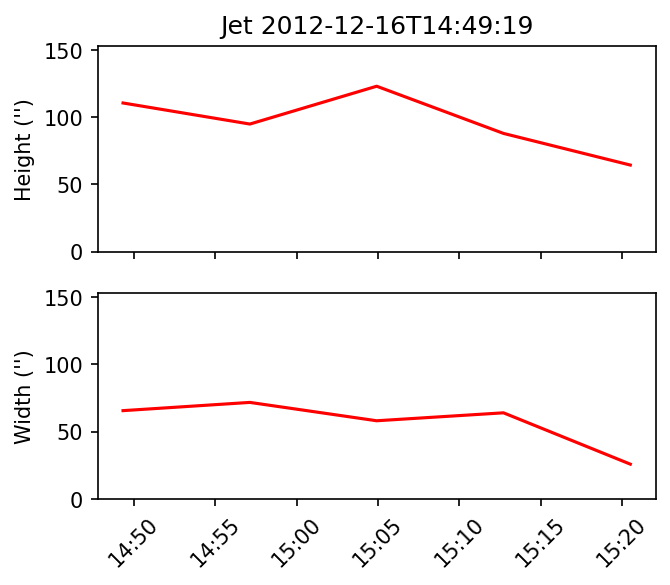

Jet start
Start base -983.249 111.018
0.5968376844505942


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -973.917 141.824
0.23384246954672733


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -963.575 204.27
0.6343088309388295


Start base -962.077 205.328
1.0001842767779217


Start base -961.567 209.636
0.2120098632135804


Start base -970.3 213.568
0.24318950042363713


Start base -959.887 209.334
0.342725046955631


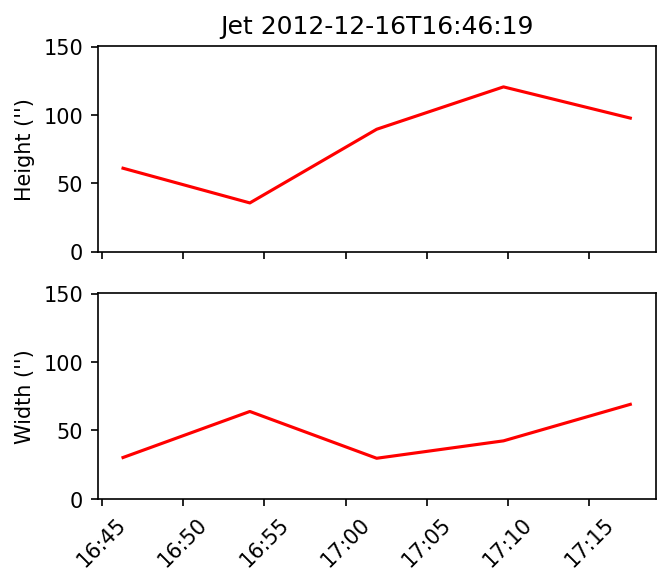

Jet start
Start base -962.077 205.328
0.10808682016958396


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -967.631 151.482
0.9998092951645917


Start base -974.361 132.253
0.18060864539232618


Start base -968.904 167.725
0.5083419024486272


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


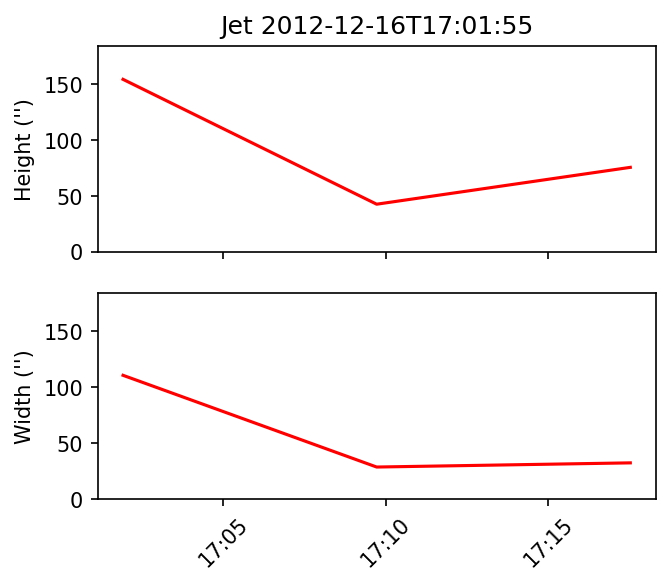

Jet start
Start base -971.077 161.622
0.5416994140759713


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -971.077 161.622
1.000000577192752


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -971.179 167.27
0.3187732308049251


Start base -973.198 165.19
0.1491918082887887


Start base -969.064 168.251
0.20910053472691553


Start base -969.005 170.915
0.29873877652520386


Start base -968.038 192.213
0.6603872763234422


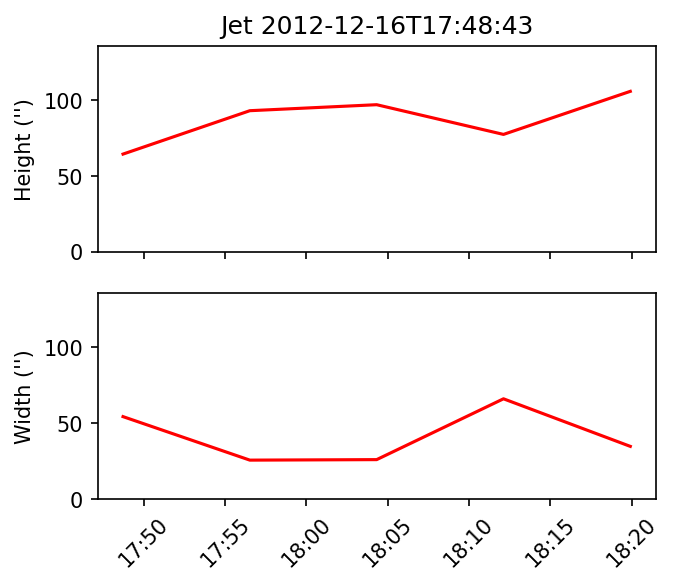

Jet start
Start base -927.16 337.855
1.000000017263782


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -965.361 211.032
0.7162303880222435


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -984.321 91.151
0.9588800283758805


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -980.275 130.529
0.4216150398598866


Start base -980.673 135.418
0.31538454160716806


Start base -968.537 169.185
0.09072094127487526


Start base -968.814 175.935
0.32853579715291414


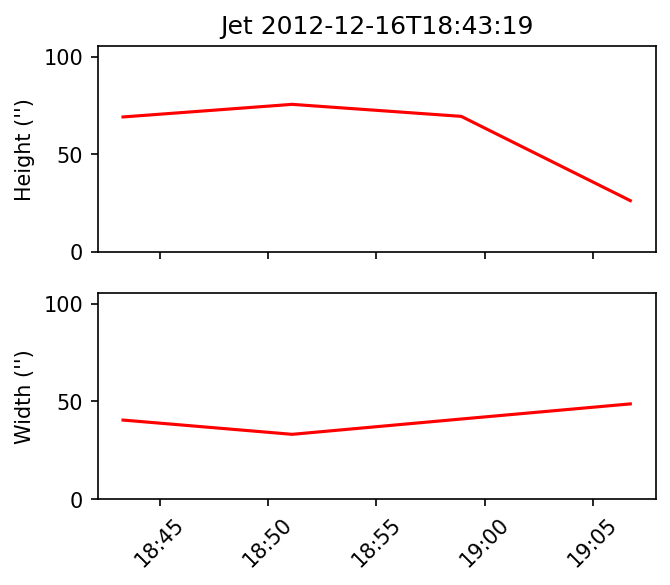

Jet start
Start base -963.466 203.765
0.6794273587166314


Start base -965.62 205.632
0.5277358956357391


Start base -968.537 169.185
0.9531354110158887


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


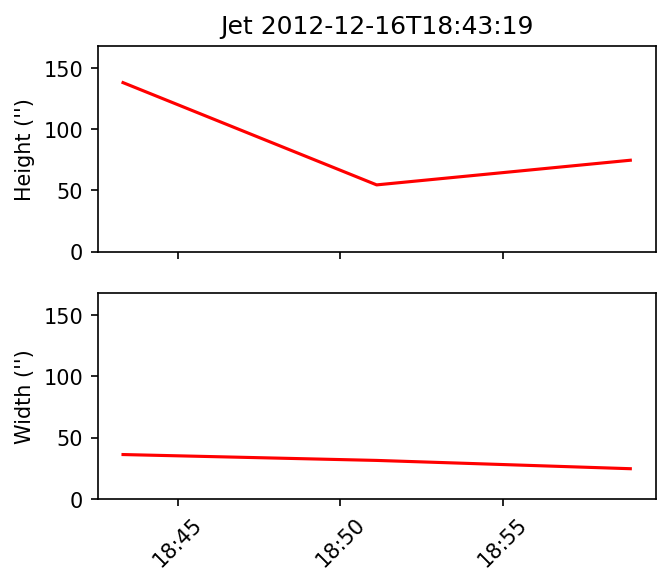

Jet start
Start base -964.232 211.877
0.1995732351418667


Start base -964.38 211.297
0.17347330151594964


Start base -959.766 210.051
0.3445581569017832


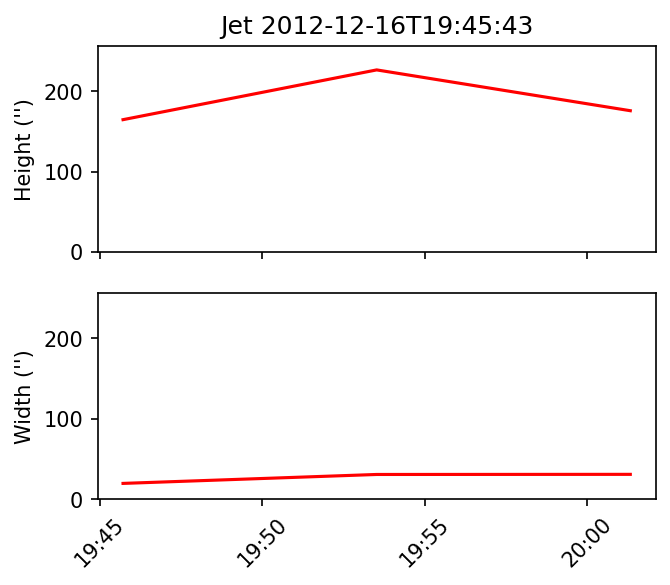

Jet start
Start base -968.98 166.572
0.26794594541191624


Start base -968.043 170.104
0.14217276999453904


Start base -965.343 175.149
0.12363537988367032


Start base -967.963 172.285
0.3142374338942963


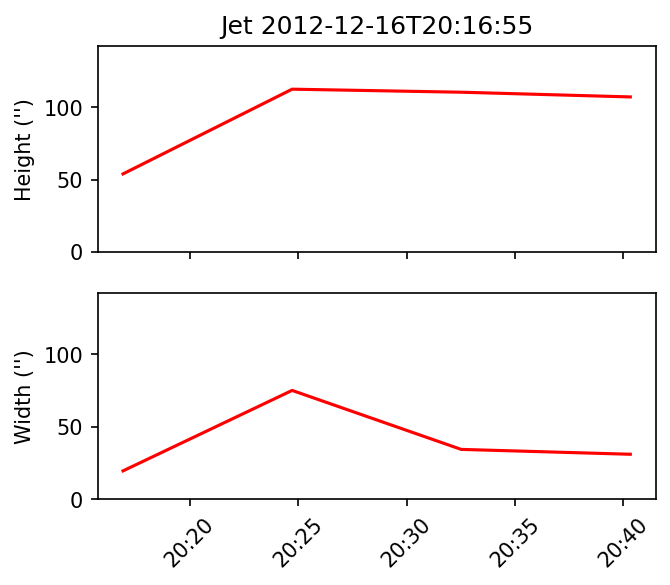

Jet start
Start base -965.509 195.861
0.5025414174657703


Start base -961.505 217.041
0.7114605394860117


Start base -961.112 214.508
0.7612308823971975


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


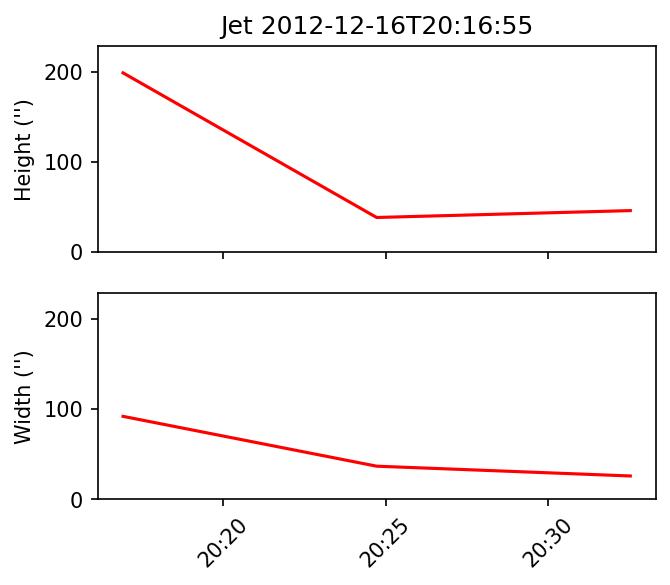

Jet start
Start base -968.907 166.415
0.29561786136334006


Start base -967.784 169.544
0.17710308238184105


Start base -964.836 165.918
0.3579136777344129


Start base -968.574 169.969
0.10847249822571202


Start base -965.286 173.452
0.2540248797191385


Start base -968.342 169.378
0.23725531138903053


Start base -979.642 170.271
0.3476727328091497


Start base -978.523 147.972
0.17812664789603555


Start base -965.811 177.695
0.155727312101321


Start base -972.307 175.812
0.1818848392398373


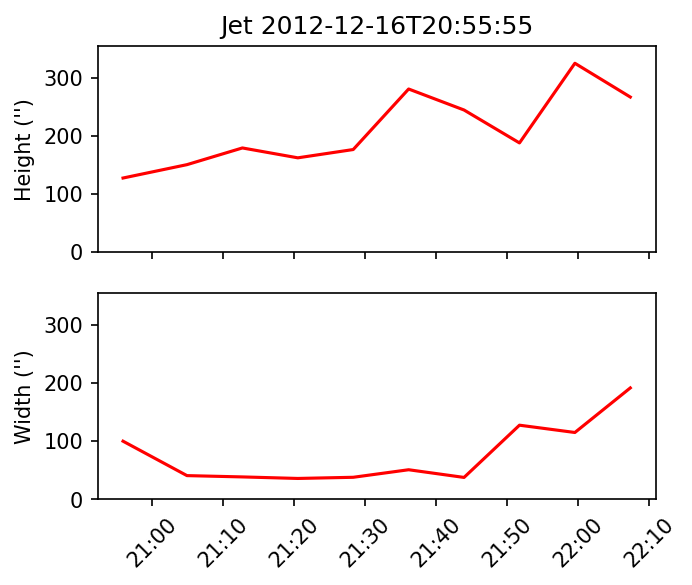

Jet start
Start base -961.152 207.094
0.32495850671422394


Start base -960.668 205.751
0.1695786281464721


Start base -962.02 208.673
0.4831111101024702


Start base -962.574 209.169
0.23340845443794428


Start base -968.342 169.378
0.6557897143664148


Start base -971.129 153.517
0.23168815851990732


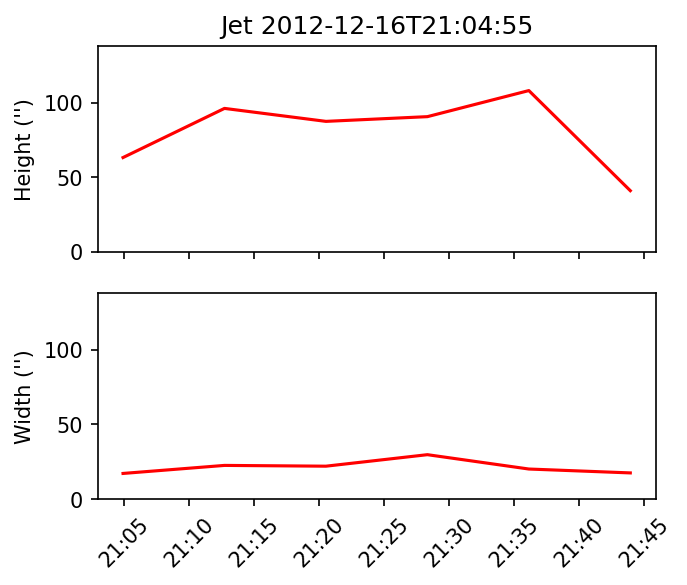

Jet start
Start base -968.574 169.969
0.4795087770217986


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -978.523 147.972
0.2062326546244171


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -963.805 173.813
0.21698326064539167


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -959.805 198.364
0.4705936918452958


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -959.805 198.364
0.896169387687423


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -973.413 157.513
0.6386895791802051


Start base -971.006 161.433
0.3175948598795866


Start base -969.368 170.051
0.26582296550507856


Start base -973.344 165.206
0.3598376537512284


Start base -981.289 125.29
0.33358520678967285


Start base -964.943 179.528
0.24517498537671129


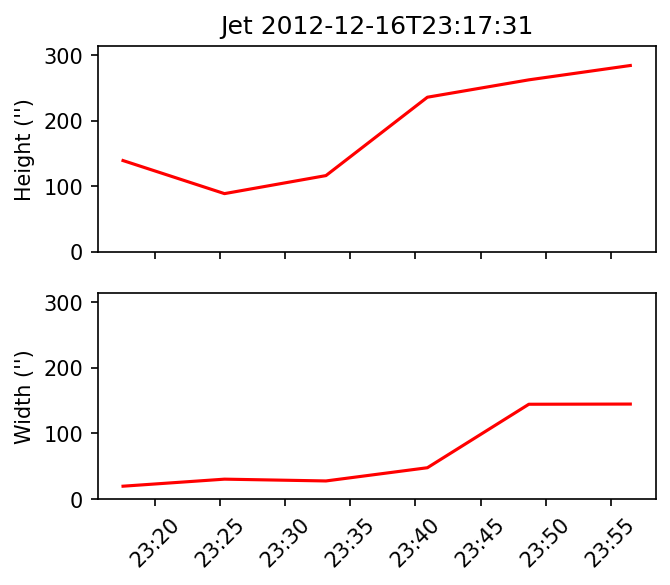

Jet start
Start base -973.413 157.513
0.8262118185465414


Start base -971.006 161.433
0.4745329165445109


Start base -969.368 170.051
0.5462122742879724


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


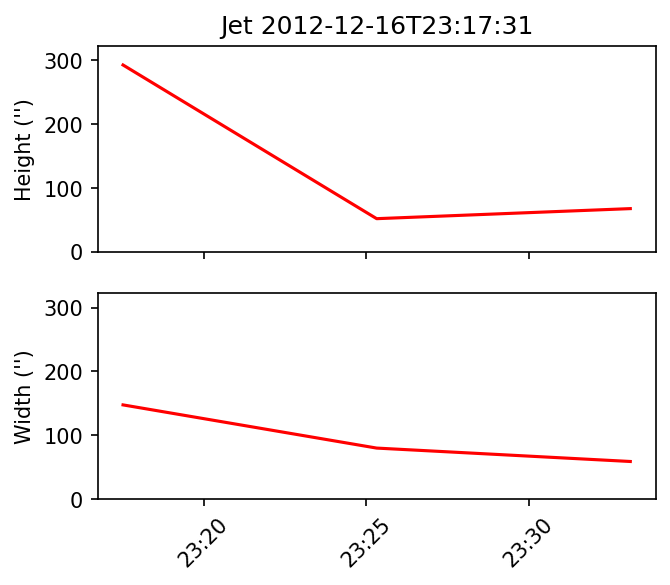

Jet start
Start base -968.847 175.548
0.7762007607784348


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -973.141 162.159
0.13748640082034044


Start base -971.961 167.614
0.2942409588811974


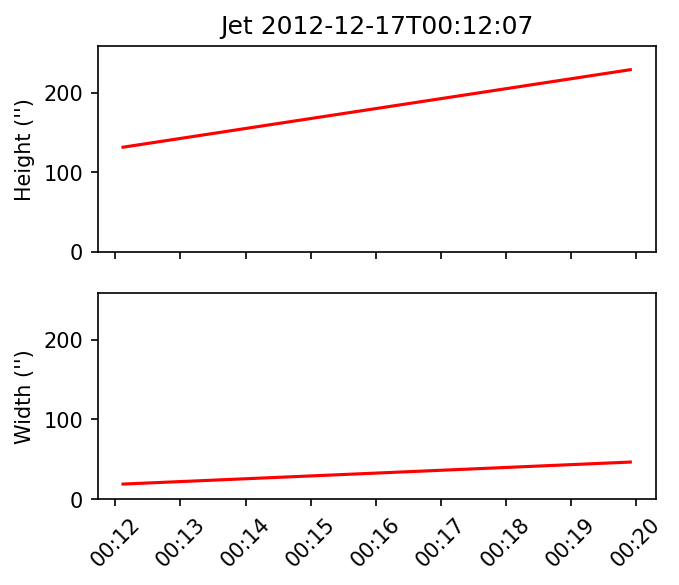

Jet start
Start base -956.073 239.439
0.5199368117198238


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -967.507 182.213
0.47167579807806603


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -974.509 165.977
0.56177645417596


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -958.814 187.623
0.8048875767697935


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -958.814 187.623
1.0000002272373067


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -968.451 173.2
0.21928999018551937


Start base -968.882 178.706
0.21286751233166515


Start base -973.426 147.354
0.3240462978330181


Start base -975.266 149.669
0.14516659460384457


Start base -963.217 201.247
0.6816821864362153


Start base -969.92 170.623
0.3236072348747391


Start base -971.609 175.988
0.3050884909924455


Start base -969.115 174.37
0.40288699228720126


Start base -969.178 174.624
1.0010438755745932


Start base -967.514 179.852
0.23441780137776444


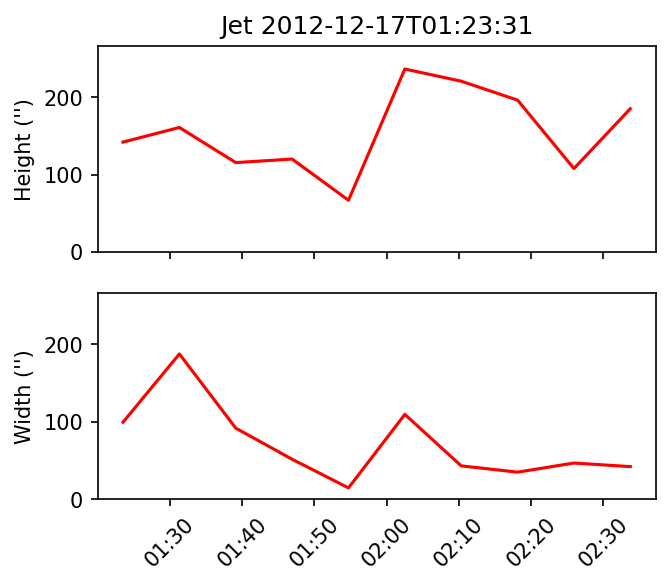

Jet start
Start base -968.451 173.2
0.43814678257005835


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -968.451 173.2
1.0000679178428995


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -957.643 239.848
0.46109641903043697


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -973.432 154.289
0.30772900267565356


Start base -965.718 177.944
0.4593918486581194


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


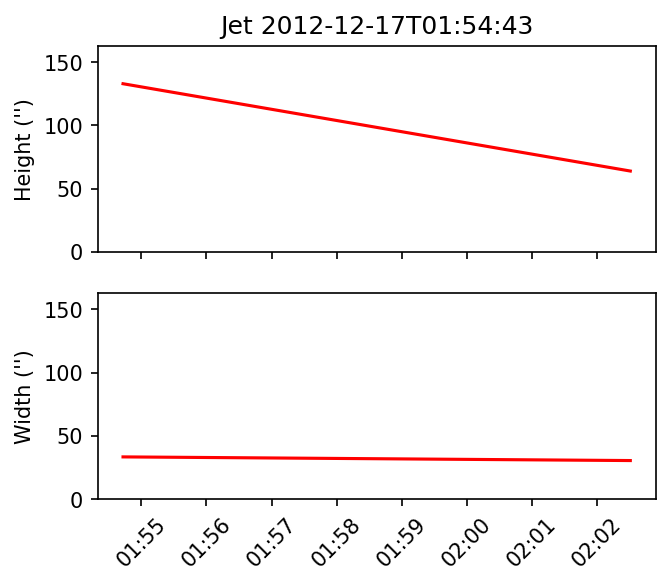

Jet start
Start base -969.115 174.37
0.2348579784398495


Start base -969.178 174.624
0.099133564251911


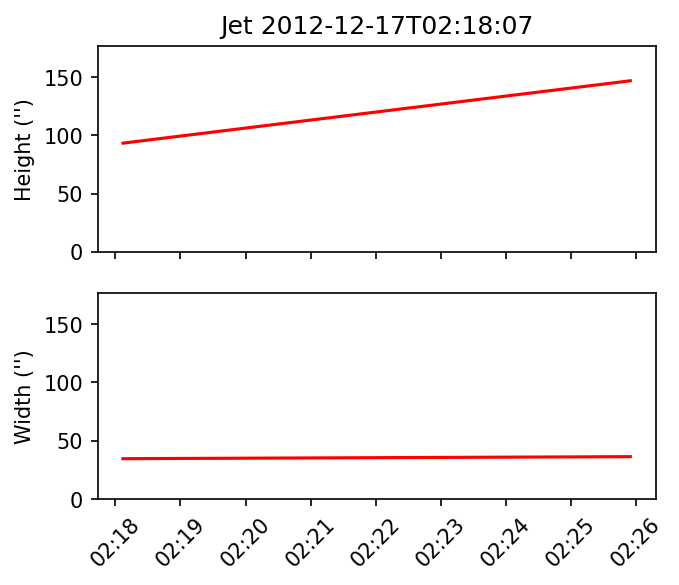

Jet start
Start base -972.317 157.232
0.17176113421301822


Start base -972.425 163.324
0.18546014548725126


Start base -978.915 120.951
0.4744665972531595


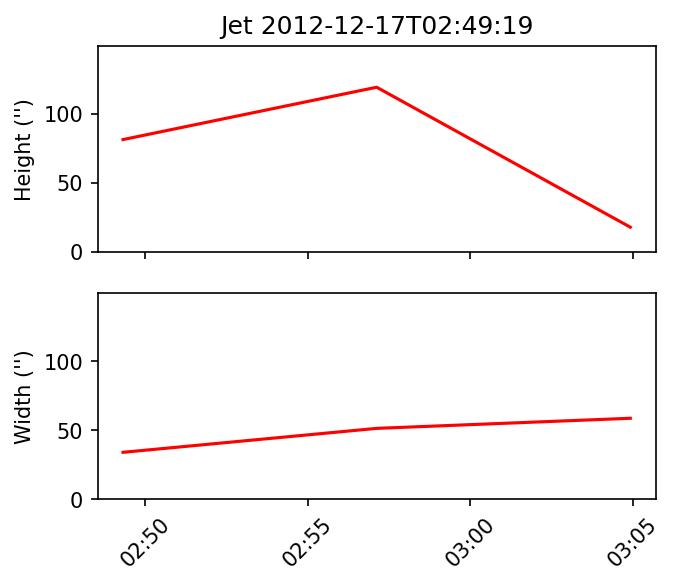

Jet start
Start base -972.317 157.232
0.46451396655560234


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -978.915 120.951
0.43186129254599637


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -957.154 231.181
0.7840335611003294


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -972.223 151.873
0.23167758345284498


Start base -978.892 153.285
0.25562733624791023


Start base -967.469 175.093
0.17310557247654865


Start base -967.058 179.219
0.11817629308088742


Start base -971.525 156.039
0.25805748739691214


Start base -970.999 161.913
0.17370469526920798


Start base -968.966 175.639
0.2924038818002146


Start base -966.295 180.31
0.23109065153973796


Start base -967.574 175.972
0.401512176778528


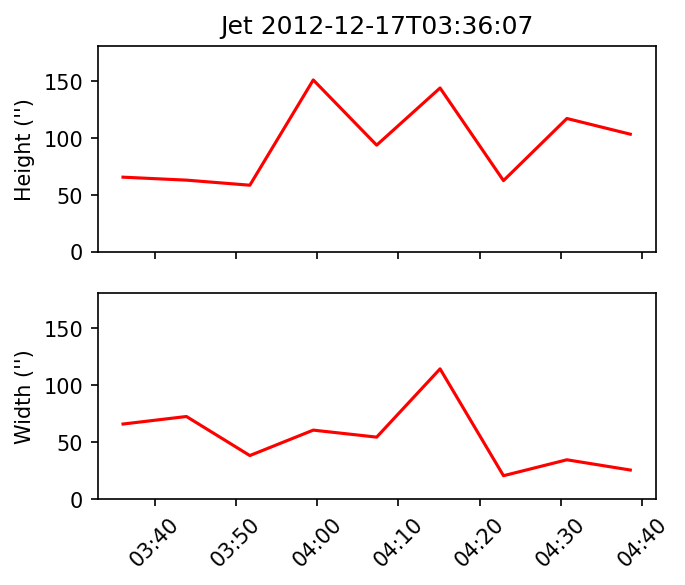

Jet start
Start base -980.891 251.119
0.7667999764470811


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -966.547 211.308
0.6424446360153253


Start base -970.035 184.868
0.22376796769545548


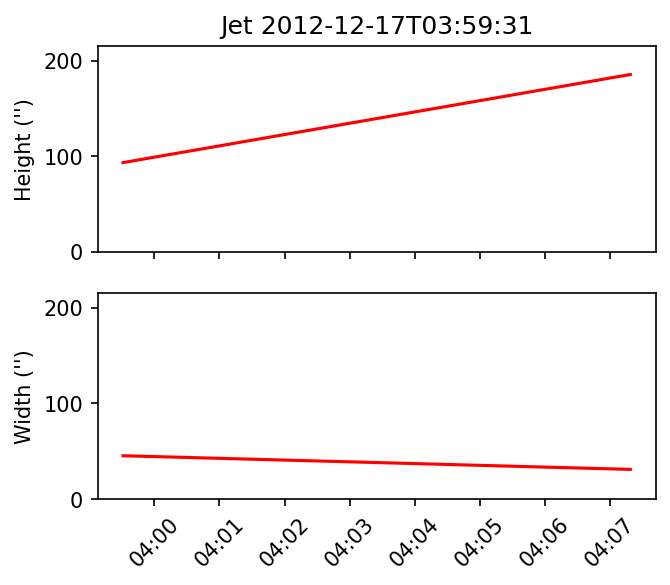

Jet start
Start base -968.966 175.639
0.22397235884377184


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -966.7 177.806
0.22135070290648465


Start base -967.574 175.972
0.3606086022662094


Start base -968.13 185.259
0.0856653098865665


Start base -966.235 182.001
0.1375360322917126


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


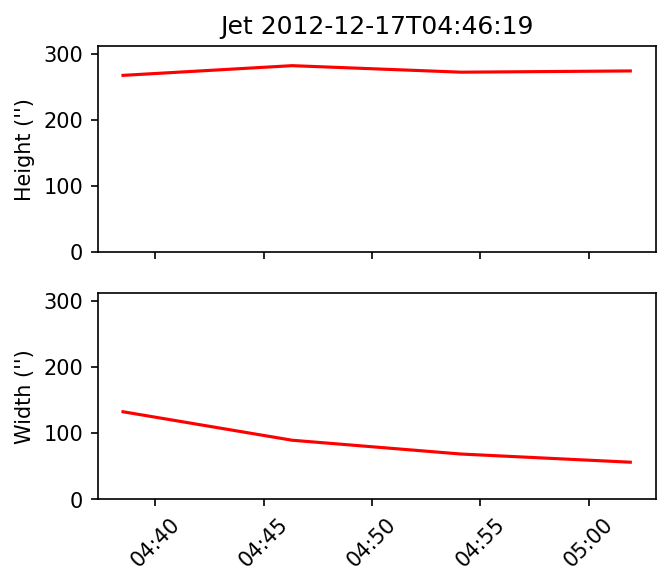

Jet start
Start base -964.466 195.118
0.43304925537282707


Start base -966.327 199.147
0.6016017287531885


Start base -966.235 182.001
0.8470432989812038


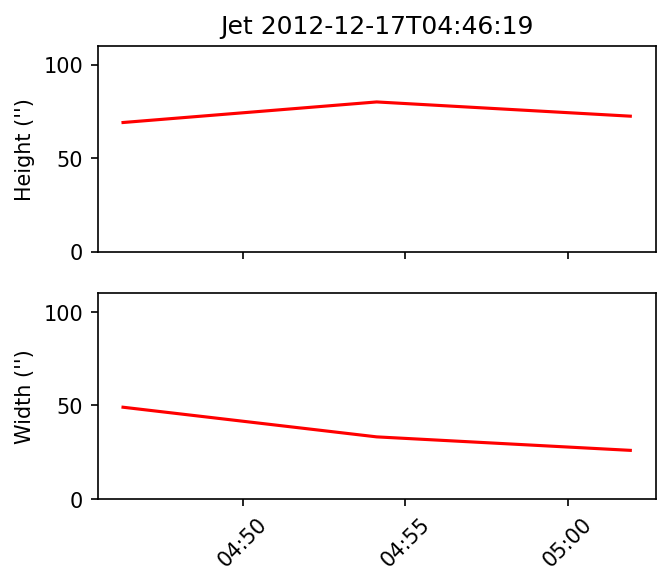

Jet start
Start base -965.912 195.492
0.3882968359427665


Start base -964.713 196.937
0.1529342896365185


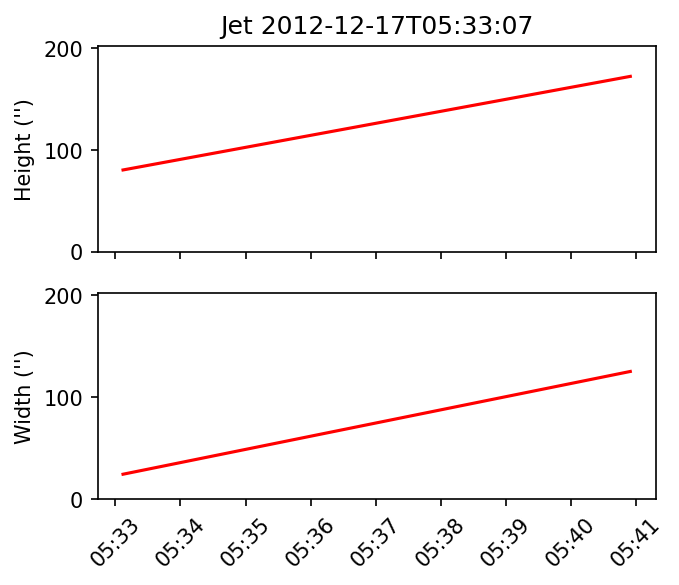

Jet start
Start base -979.103 162.843
0.6305482940610073


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -967.178 182.964
0.40743385509714225


Start base -965.805 185.675
0.6742266685446554


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


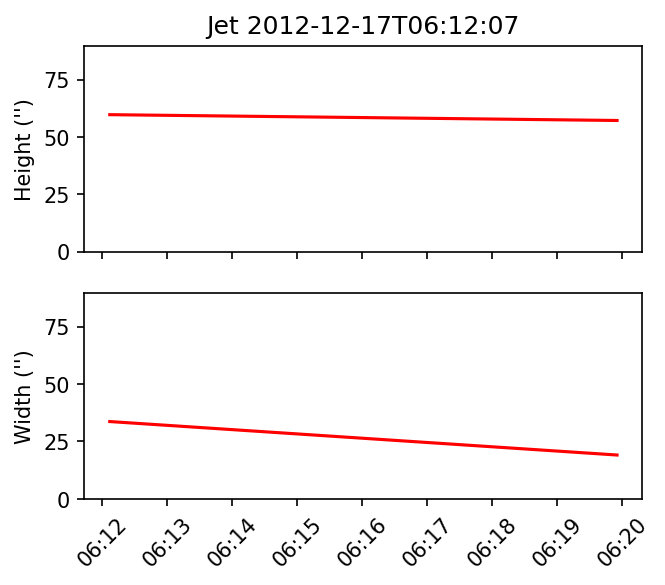

Jet start
Start base -967.178 182.964
0.19889580060901677


Start base -973.719 163.311
0.5520574326680949


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


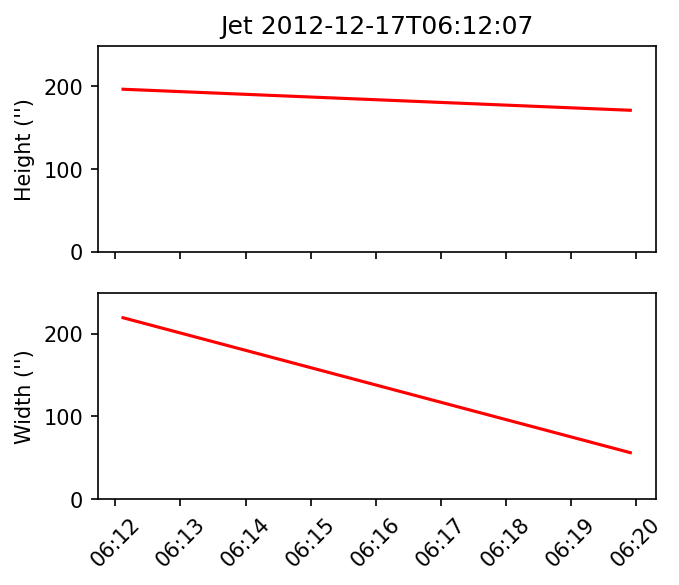

Jet start
Start base -967.178 182.964
0.5668503306827459


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -966.9 180.08
0.1731977344017046


Start base -970.398 181.559
0.22597030740071491


Start base -968.413 179.72
0.45408922393680906


Start base -966.495 182.54
0.4394514282077231


Start base -966.24 188.83
0.15425902973635353


Start base -974.304 189.515
0.18062044466066288


Start base -967.787 187.814
0.3517271785947469


Start base -966.159 180.748
0.277531081039935


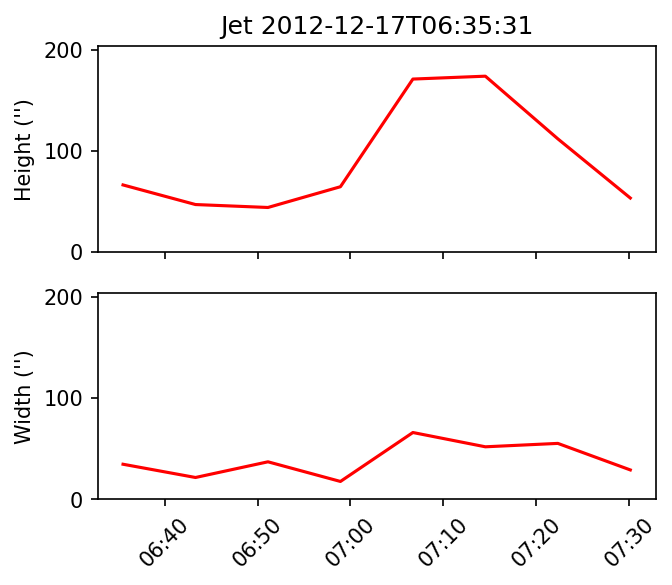

Jet start
Start base -970.398 181.559
1.000000000002654


Start base -968.413 179.72
0.08022794242343938


Start base -966.495 182.54
0.11975904729313273


Start base -955.354 237.622
0.39926901065372256


Start base -947.994 257.994
0.9082333489237936


Start base -939.148 286.306
0.805112725764464


Start base -966.159 180.748
0.474128908060506


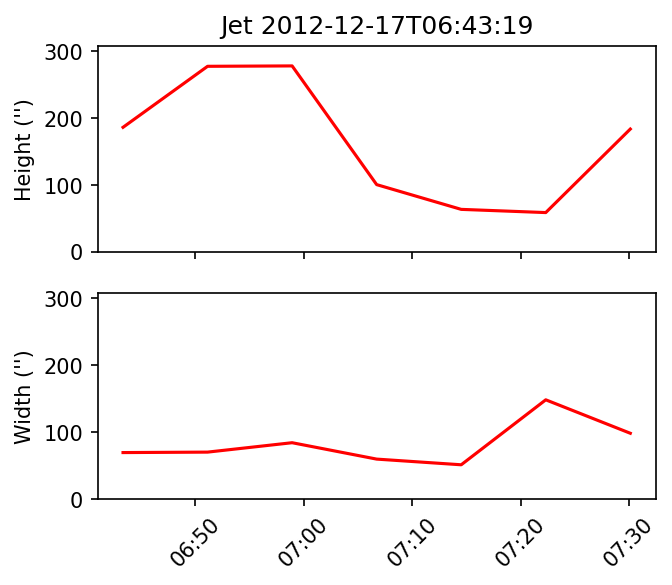

Jet start
Start base -948.181 268.493
0.8317054671569819


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -967.787 187.814
0.3226057569031997


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -964.431 182.885
0.572946772355699


Start base -968.517 174.538
0.5172700346843352


Start base -965.155 188.243
0.442171649639708


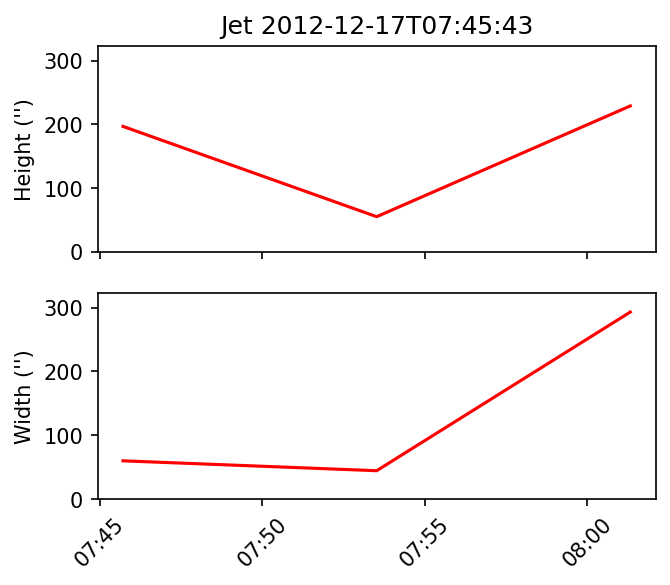

Jet start
Start base -950.589 247.553
0.3997345956621828


Start base -967.188 195.41
0.7742184000848025


Start base -965.155 188.243
0.5208736199944756


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


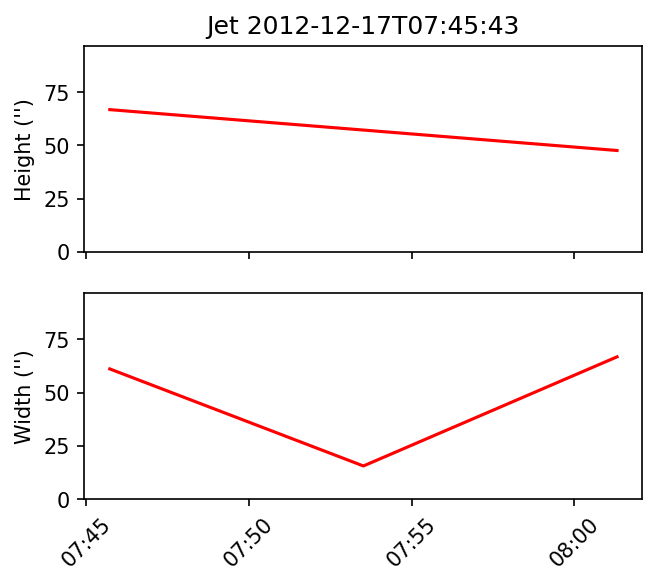

Jet start
Start base -964.431 182.885
0.8404106152109907


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -965.155 188.243
0.25938677853031017


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -966.697 186.044
0.5882084573785024


Start base -972.587 187.503
0.2870855612383706


Start base -967.023 190.452
0.12544340893691558


Start base -966.717 195.178
0.20788883037602185


Start base -965.487 193.491
0.2489440926745303


Start base -967.677 180.443
0.269967009289179


Start base -967.698 179.91
0.16043987753776953


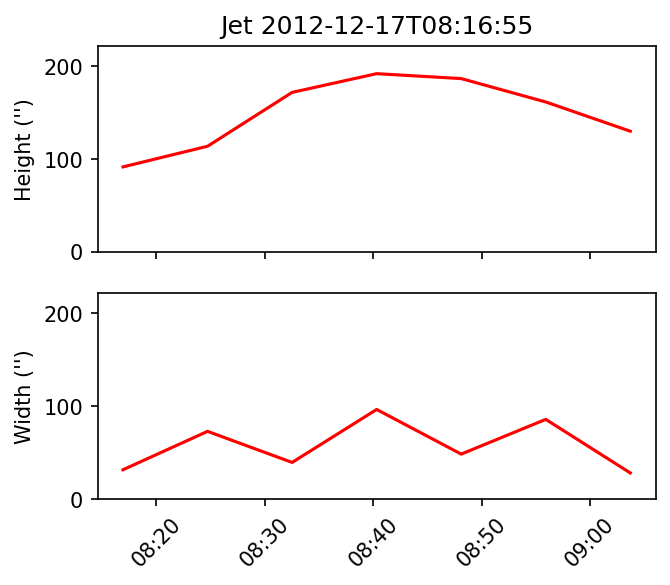

Jet start
Start base -966.697 186.044
0.43718640322852975


Start base -972.587 187.503
0.3266042376618451


Start base -967.023 190.452
1.0000000004390273


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


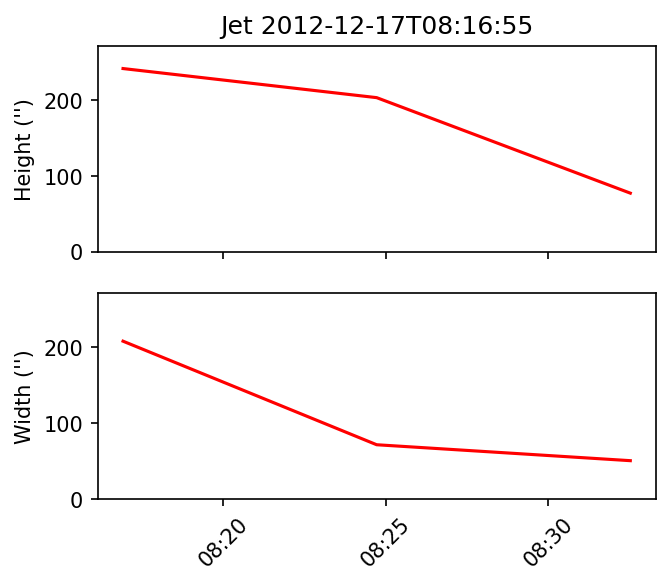

Jet start
Start base -971.358 174.727
0.42069663549779396


Start base -967.677 180.443
1.000404377815999


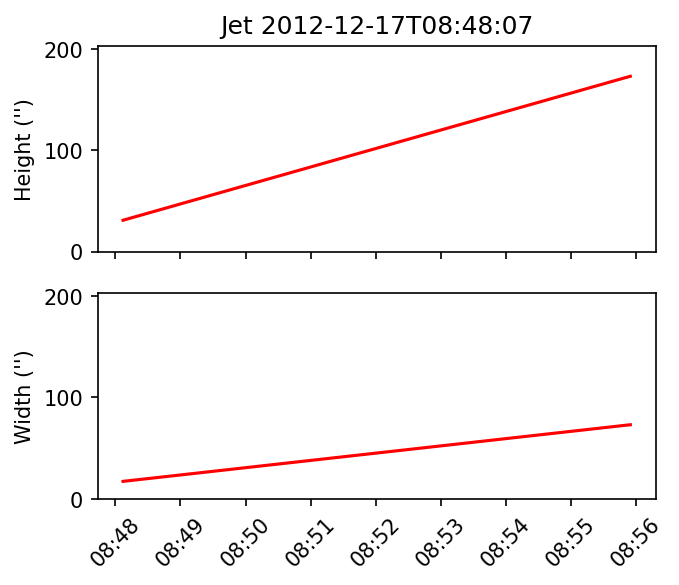

Jet start
Start base -965.487 193.491
0.9701121499520305


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -981.952 187.782
0.10719542436089376


Start base -970.271 185.379
0.6103118403698449


Start base -969.42 182.79
0.4295244593749615


Start base -967.996 188.836
0.4132030727298189


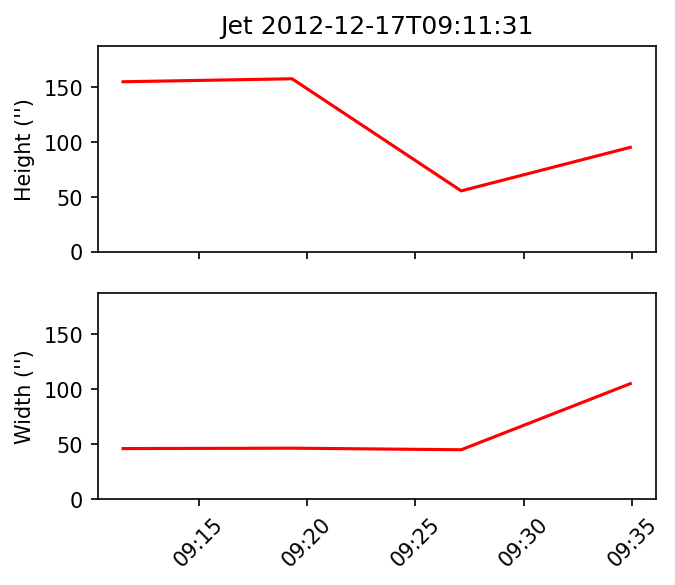

Jet start
Start base -965.877 202.032
0.37897068184765864


Start base -970.271 185.379
1.0000026259980226


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


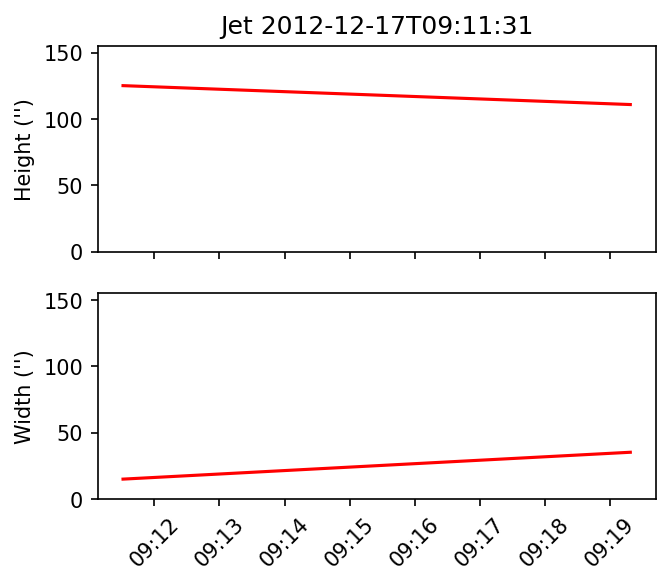

Jet start
Start base -954.895 219.163
0.8324814400244192


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -963.189 195.16
0.2125402763573803


Start base -967.52 175.047
0.4774239858262064


Start base -963.437 197.687
0.4026337532201949


Start base -962.375 194.684
0.6461380335522618


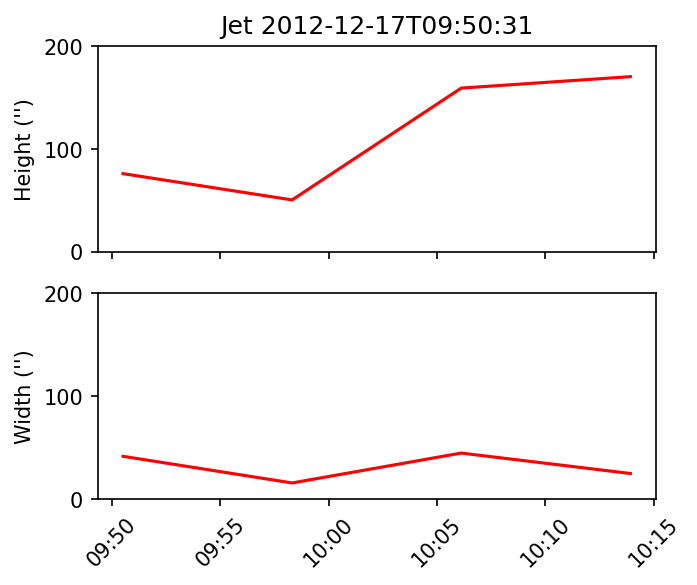

Jet start
Start base -963.976 197.128
0.29425981407177215


Start base -966.635 176.512
0.24517833779980983


Start base -966.261 182.644
0.30635382362638297


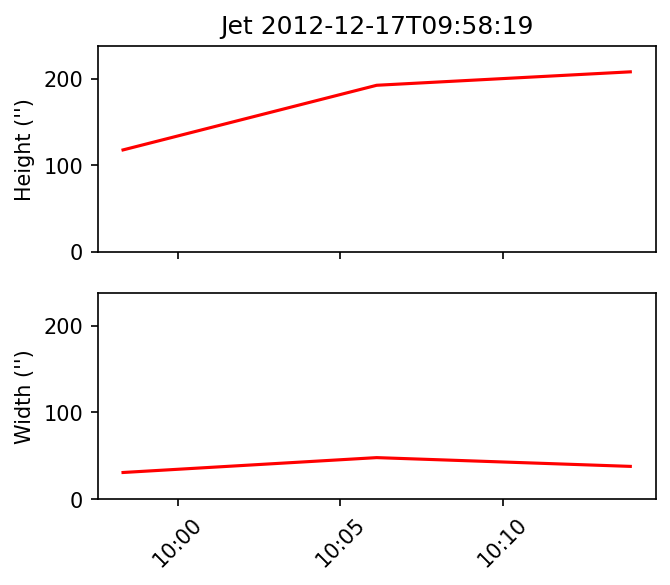

Jet start
Start base -963.004 198.128
0.40175194176912077


Start base -967.164 183.025
0.31670069797766637


Start base -965.8 197.367
0.339461802795596


Start base -964.793 176.399
0.7879171122330879


Start base -966.341 180.421
0.3684416821743912


Start base -962.264 199.319
0.1716220951476671


Start base -965.811 191.339
0.5290307723273702


Start base -966.339 200.47
0.2286415389071075


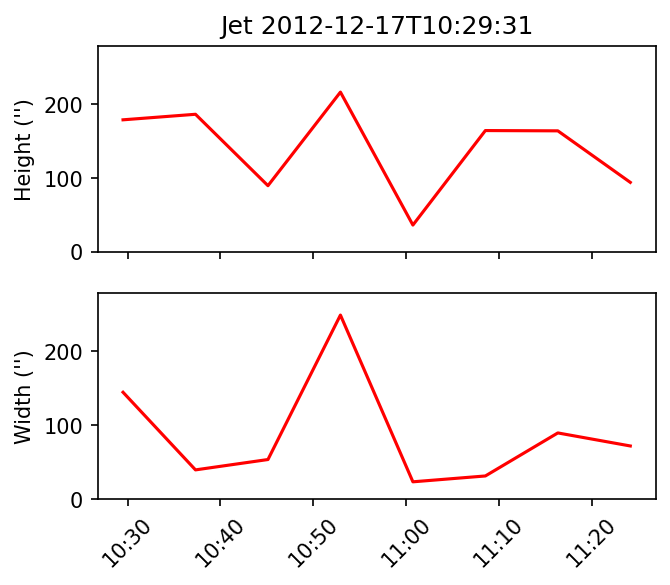

Jet start
Start base -967.904 180.92
0.3063501110129846


Start base -967.164 183.025
0.15559344406572878


Start base -987.909 168.724
0.702326537796302


Start base -964.793 176.399
0.21767544907573205


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


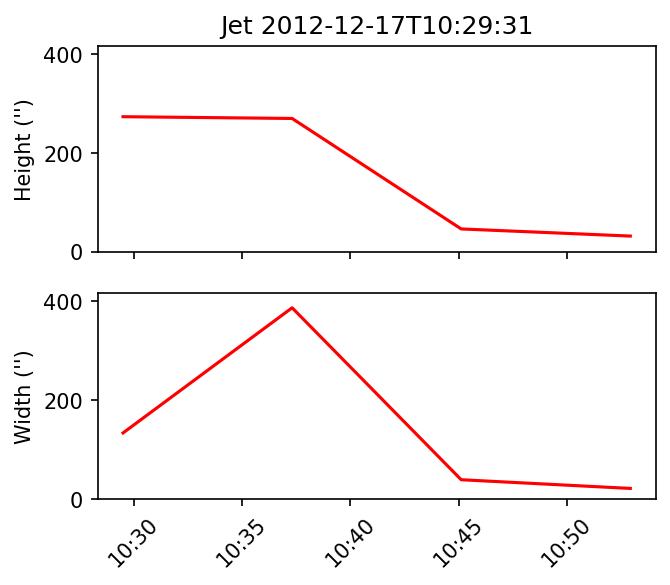

Jet start
Start base -967.164 183.025
0.6088652717120724


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -967.164 183.025
0.798704612492102


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -966.341 180.421
0.9657002541096511


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -975.046 145.289
0.6555222962830052


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -973.152 201.918
0.23677514405316252


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -973.152 201.918
0.795638348483306


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -966.885 177.583
0.47797726181279276


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -965.114 183.682
0.2978242073184897


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -961.263 239.443
0.4467737445565737


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -850.833 444.605
0.16465896299436936


Start base -859.624 440.993
0.23190064458859877


Start base -860.739 437.512
0.2554091990920932


Start base -860.766 431.765
0.20136523782114252


Start base -862.271 432.656
0.17890233756413002


Start base -865.922 431.612
0.21598523498801048


Start base -861.239 430.895
0.2125686821301067


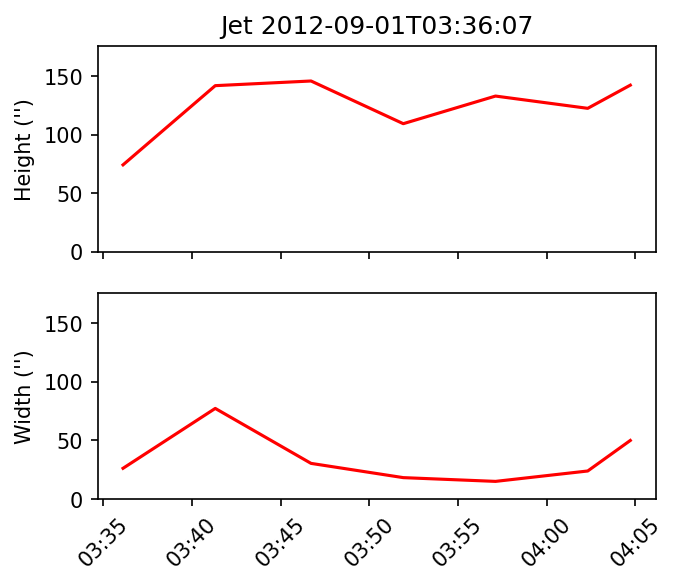

Jet start
Start base -851.337 450.713
0.5798684863111999


Start base -876.282 399.49
0.18750594181045394


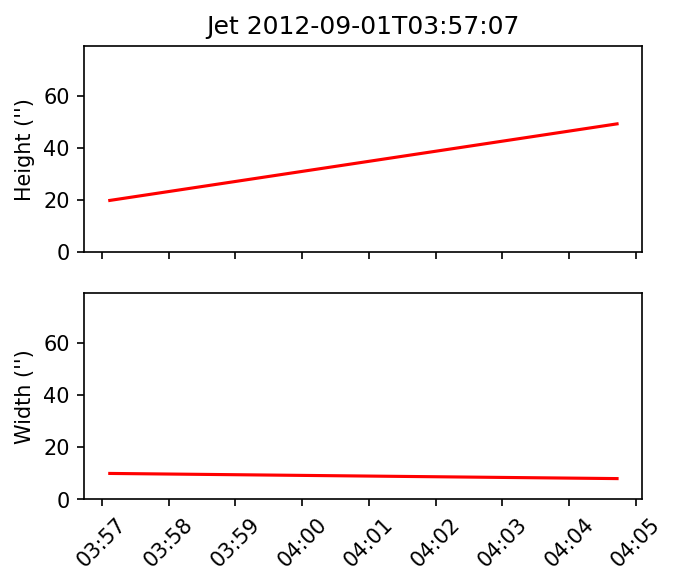

Jet start
Start base 897.211 349.152
0.21390063772165985


Start base 893.787 344.541
0.12770087725558968


Start base 897.739 350.117
0.14132619247844896


Start base 899.059 344.045
0.18973346623820947


Start base 903.076 340.891
0.21605448870916957


Start base 903.312 351.656
0.17603320640414477


Start base 896.943 359.986
0.3169186553978977


Start base 891.525 361.832
0.237267444543182


Start base 891.206 353.294
0.4666646926509804


Start base 894.775 351.42
0.14246586694064123


Start base 893.599 350.927
0.26765705330257067


Start base 892.83 356.392
0.3192518954587304


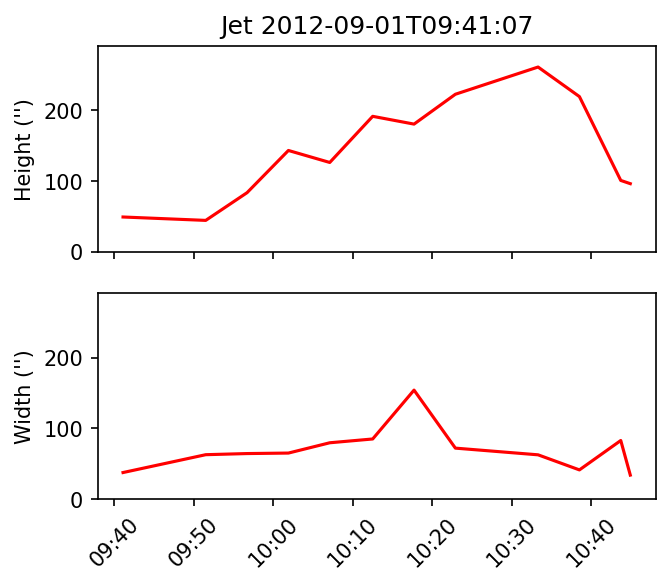

Jet start
Start base 893.787 344.541
0.6098284924010681


Start base 918.735 289.409
0.4149425907672492


Start base 903.076 340.891
1.0008915158281715


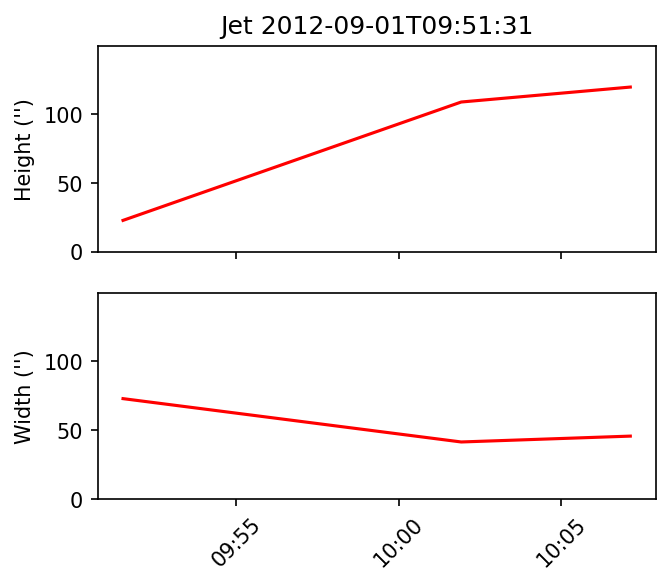

Jet start
Start base 919.056 287.172
0.7924441246380463


Start base 917.209 285.703
0.6260159148233114


Start base 916.19 285.926
0.5364474749294719


Start base 892.83 356.392
0.831974631406421


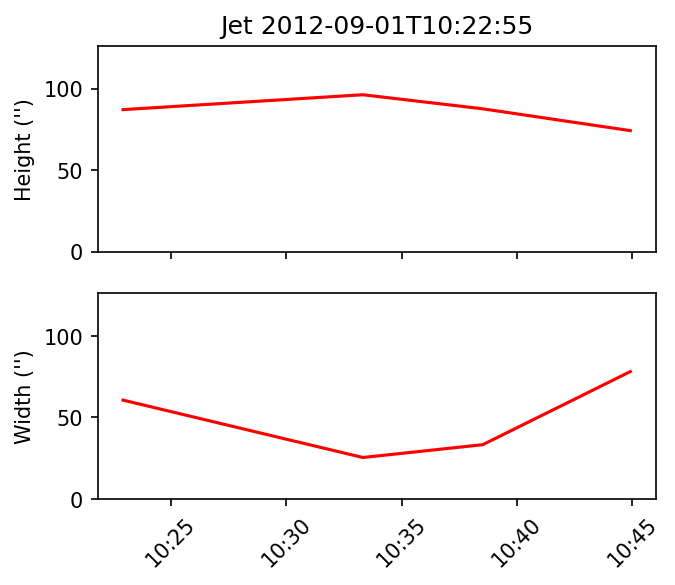

Jet start
Start base 934.861 -212.321
0.2601907403054054


Start base 934.238 -208.901
0.2806193190991107


Start base 935.825 -209.65
0.19108184265041492


Start base 936.082 -205.695
0.30490658699278583


Start base 935.047 -214.187
0.2672944183434776


Start base 933.535 -217.773
0.32499399509685106


Start base 935.682 -218.372
0.1309739024342581


Start base 936.281 -217.305
0.1637773972797469


Start base 934.297 -208.854
0.7447799521019027


Start base 934.416 -213.902
0.19833016723819608


Start base 936.42 -212.015
0.16436591476236637


Start base 937.426 -219.448
0.2487174104861066


Start base 936.05 -216.57
0.21266008203573267


Start base 935.637 -210.984
0.18733774513811524


Start base 935.148 -209.746
0.17461045096305378


Start base 939.605 -214.754
0.2638162805775753


Start base 933.726 -212.371
0.1500403988728405


Start base 936.511 -210.414
0.32839109955774404


Start base 935.723 -211.352
0.16590720798394618


Start base 933.646 -217.338
0.17351842834014278


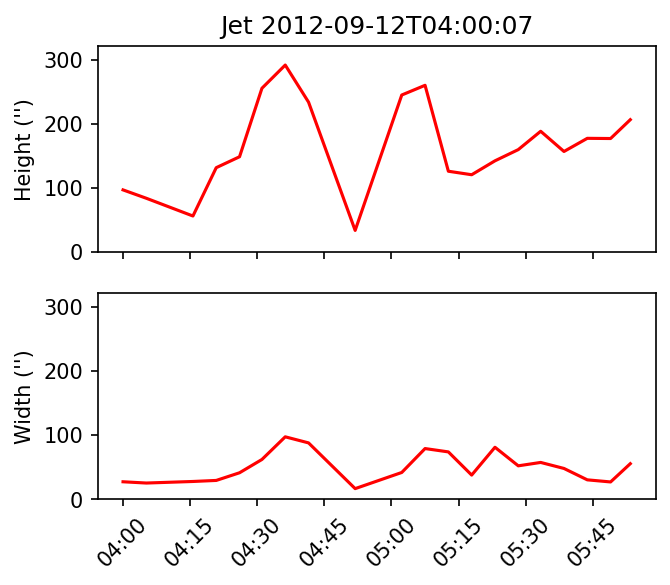

Jet start
Start base 957.843 -151.258
0.3595481685680013


Start base 934.238 -208.901
0.7103000133830647


Start base 935.825 -209.65
0.682932117455015


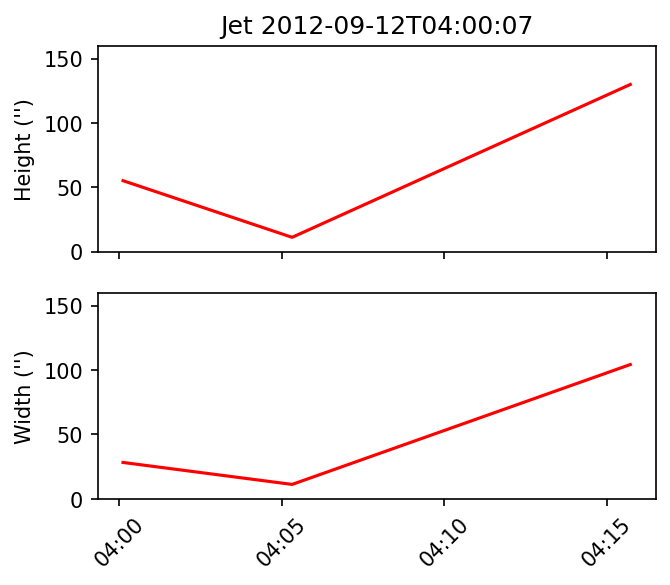

Jet start
Start base 901.254 -300.509
0.7999849732260007


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 947.422 -160.667
0.3725453160335617


Start base 945.378 -157.227
0.4190657904424886


Start base 937.754 -197.605
0.2559998016306683


Start base 935.158 -201.191
0.20435284362816067


Start base 936.05 -216.57
0.6447551725191887


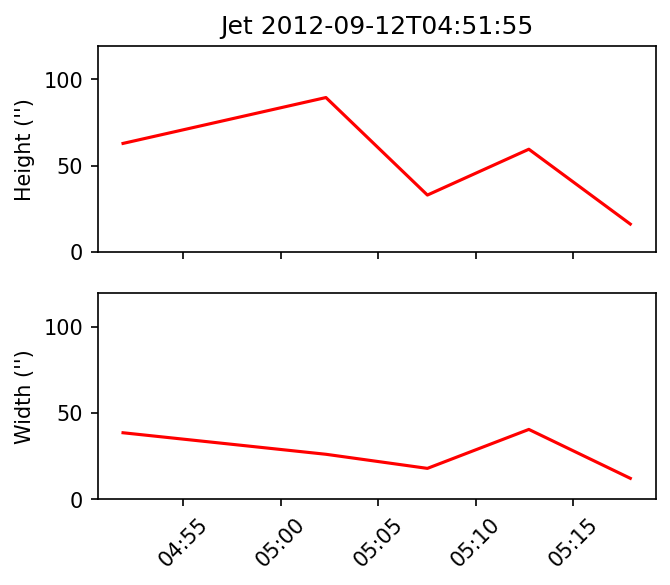

Jet start
Start base 934.297 -208.854
0.2698587640872345


Start base 934.416 -213.902
0.11310597908146461


Start base 936.42 -212.015
0.4154119950445637


Start base 936.05 -216.57
0.3040940109585116


Start base 935.637 -210.984
0.7576688572345146


Start base 926.605 -242.237
0.8950119380306193


Start base 924.334 -242.207
0.8251495544921928


Start base 942.879 -164.62
0.34246246066158575


Start base 935.723 -211.352
0.31386025644855714


Start base 933.646 -217.338
0.31549273715762355


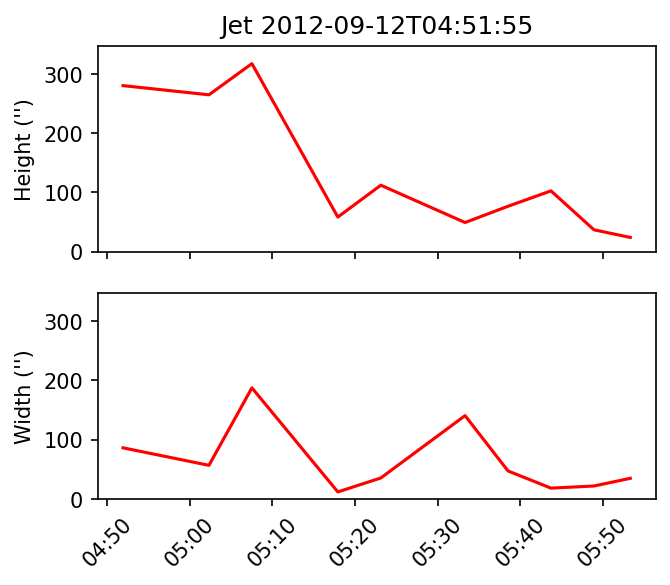

Jet start
Start base 936.05 -216.57
1.0019340249624076


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 922.788 -256.439
0.2600732650167844


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -380.483 890.07
0.2296889557363664


Start base -381.643 889.474
0.1635731896907155


Start base -381.799 889.514
0.20086837146416903


Start base -378.361 893.485
0.9384182823252702


Start base -351.827 901.248
0.5097324404536732


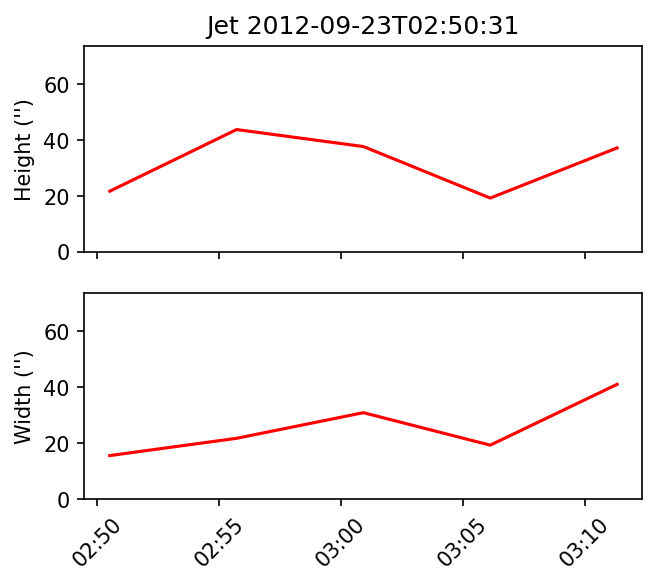

Jet start
Start base -302.732 931.282
0.5502471861236571


Start base -317.355 919.676
0.7902682497179546


Start base -328.639 914.378
0.9352024160834107


Start base -351.827 901.248
0.3881826983463815


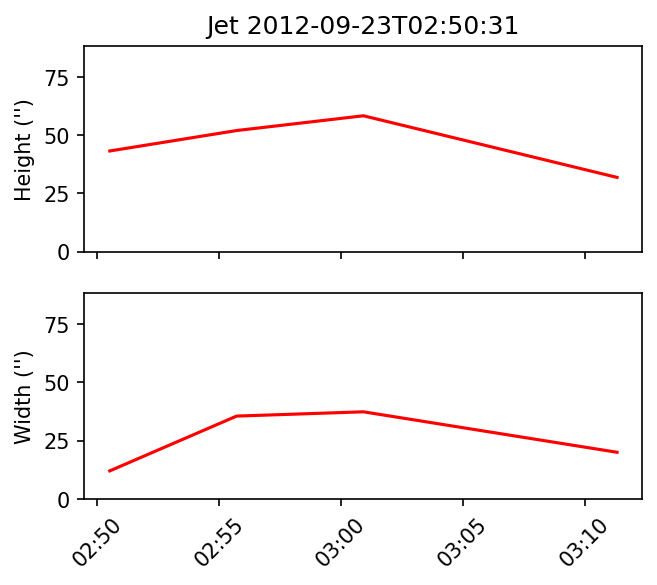

Jet start
Start base -302.732 931.282
0.8869892270246117


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -356.825 901.647
0.6670204681665571


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 449.319 861.133
0.44443562425872635


Start base 447.181 861.144
0.20017257039826303


Start base 631.828 728.825
0.25250511671811154


Start base 625.61 733.74
0.41738674013002314


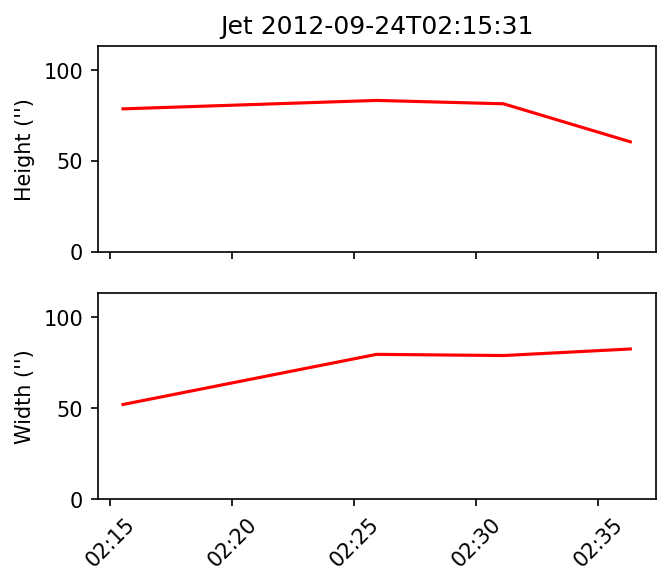

Jet start
Start base 449.319 861.133
0.9101032719081492


Start base 634.437 725.732
0.5531866501151166


Start base 625.61 733.74
0.21847404317585079


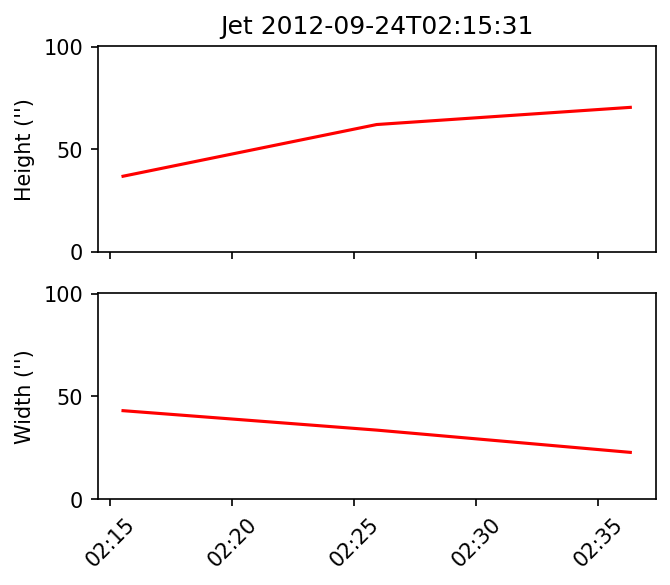

Jet start
Start base 510.58 -343.266
0.6253727651929063


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 510.58 -343.266
0.9210621789534502


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 497.573 -337.478
0.4690495515283442


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 551.267 -359.919
0.3901743325698611


Start base 556.355 -354.909
0.33341697139422544


Start base 547.367 -363.36
0.5856910815218426


Start base 559.552 -328.448
0.10033504170199548


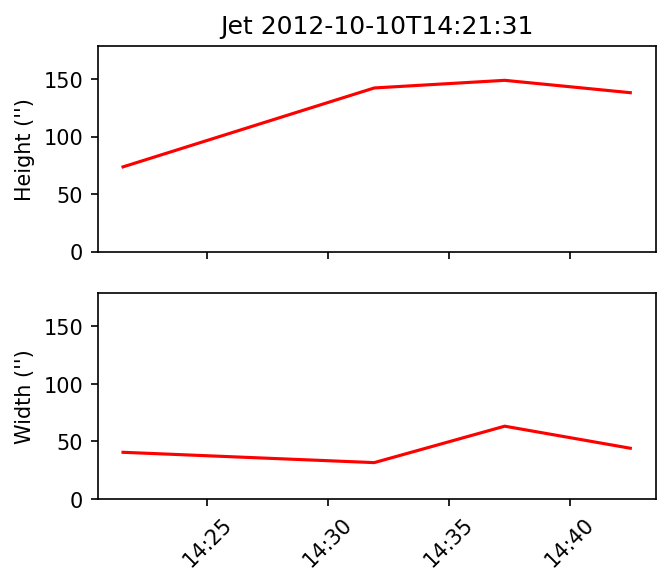

Jet start
Start base -929.284 -287.641
0.15865410185412707


Start base -930.909 -287.859
0.1569955222739957


Start base -936.061 -288.212
0.1984522293324234


Start base -930.102 -278.999
0.16756520989865348


Start base -932.492 -275.537
0.13788021542707296


Start base -927.247 -289.24
0.16206446349323383


Start base -928.03 -288.76
0.24646296762454123


Start base -926.789 -291.342
0.13301811139362799


Start base -937.655 -294.722
0.23424814687587267


Start base -926.814 -289.767
0.615232078969594


Start base -931.872 -287.644
0.13202528310954584


Start base -934.978 -290.015
0.1468124288957939


Start base -935.429 -292.779
0.2017525982324798


Start base -940.133 -292.012
0.3683148168170691


Start base -941.035 -293.15
0.3547780540033104


Start base -929.695 -290.386
0.2648494122671309


Start base -941.741 -294.043
0.14987602110088458


Start base -936.253 -290.76
0.4072434863600675


Start base -929.569 -293.7
0.5246024252589856


Start base -936.384 -297.949
0.17741386952753022


Start base -937.88 -293.995
0.14911563241280404


Start base -939.471 -295.088
0.5385851154813767


Start base -938.968 -289.653
0.41087852743304254


Start base -938.571 -291.078
0.20772239525089206


Start base -940.857 -290.876
0.2617855428045349


Start base -938.485 -287.104
0.22247916860444436


Start base -940.167 -292.039
0.24979301452714012


Start base -934.839 -287.475
0.1320166240592521


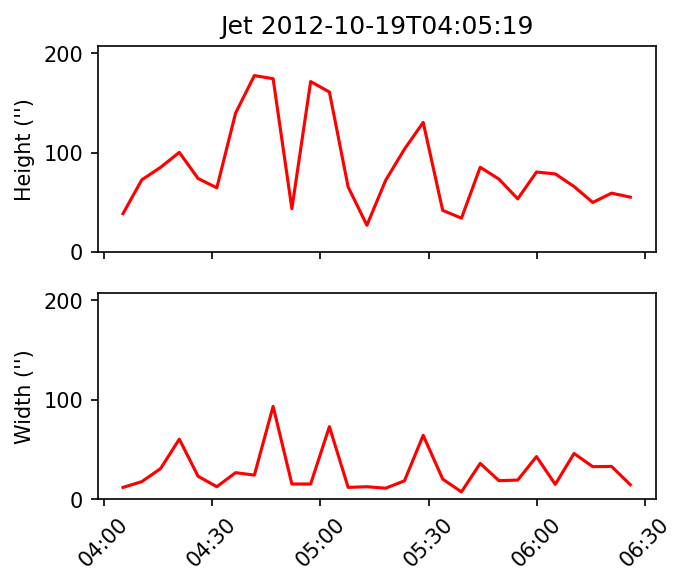

Jet start
Start base -926.814 -289.767
0.05207998273494466


Start base -930.727 -265.451
0.3997948485583517


Start base -934.612 -265.86
0.2781344309491421


Start base -938.318 -276.467
0.3282430238488823


Start base -940.133 -292.012
0.2473264561988653


Start base -929.695 -290.386
0.3703420024370021


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


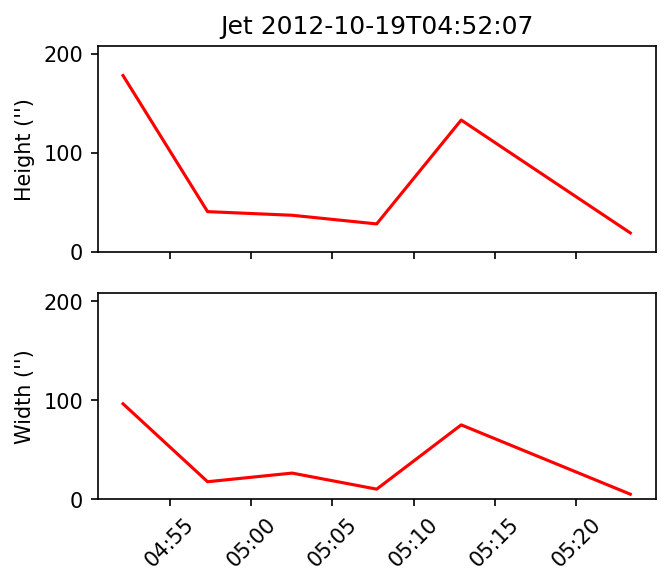

Jet start
Start base -926.814 -289.767
0.6495640898619515


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -929.569 -293.7
0.3569401250102085


Start base -936.384 -297.949
0.2764029135765212


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


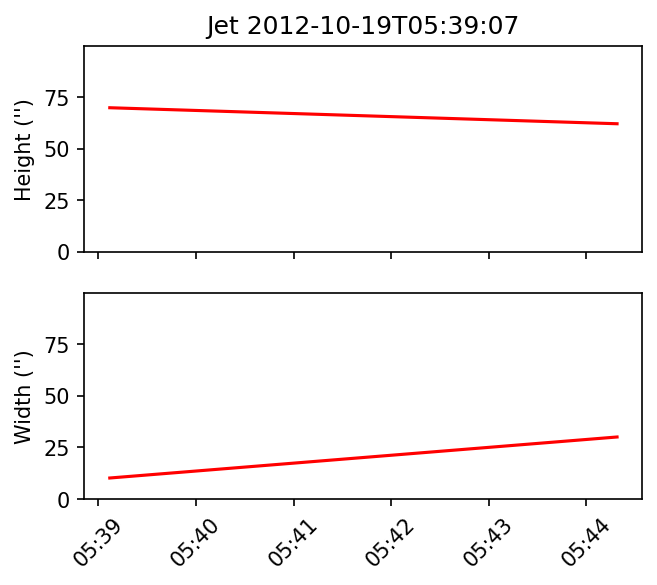

Jet start
Start base -940.857 -290.876
0.2437883372578155


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -933.888 -305.492
0.347961909172743


Start base -944.848 -307.38
0.7405279774362581


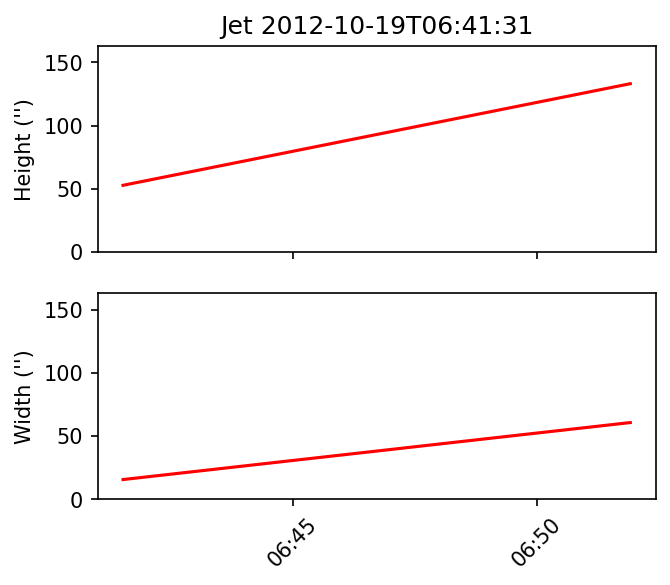

Jet start
Start base -935.877 -305.171
0.3447907481242824


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -965.138 -305.795
0.8705369552495781


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 184.412 -964.546
0.3234395069409347


Start base 180.849 -962.2
0.3857192570041095


Start base -53.4754 -974.365
0.8210794167846791


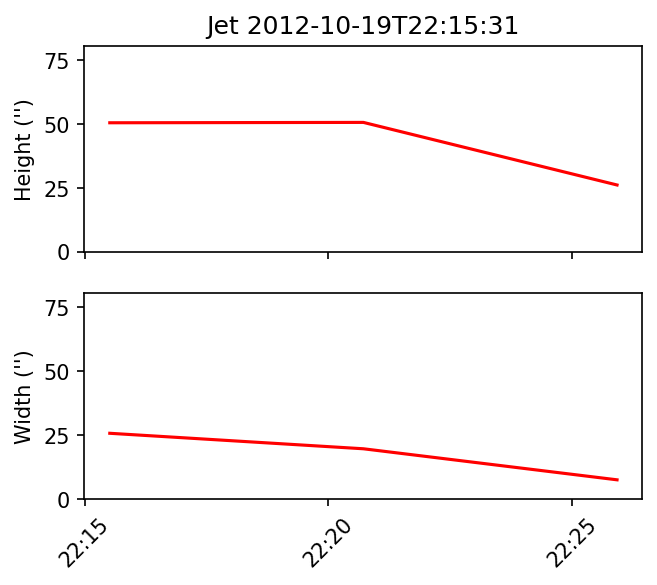

Jet start
Start base 184.412 -964.546
0.5003810453186422


Start base 180.849 -962.2
1.0000000001265994


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


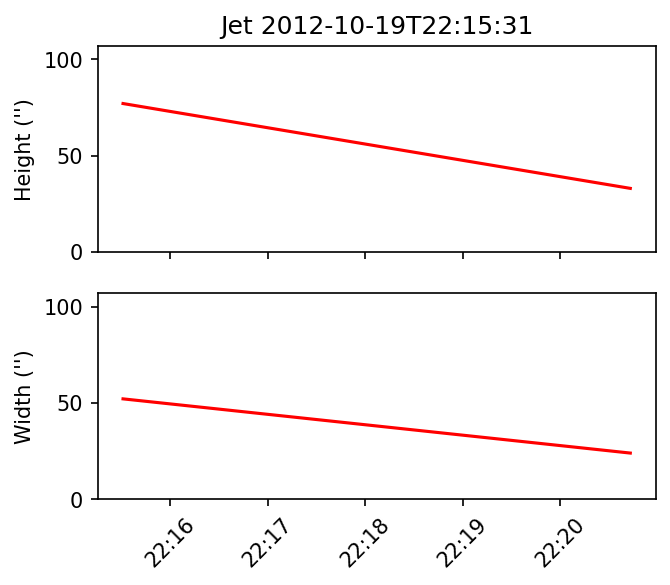

Jet start
Start base -1.4125 -986.581
0.47907609106704924


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -32.26 -973.241
0.554865698936791


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 152.75 -964.221
0.9758105416136251


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 71.2463 -976.05
0.8172986633748164


Start base 40.8303 -979.859
0.6753012299269402


Start base 11.4758 -980.808
0.7161165467399535


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


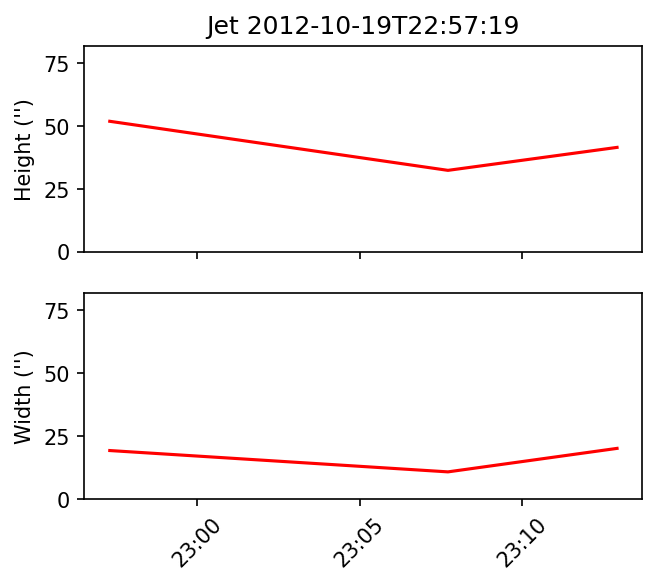

Jet start
Start base 103.199 -974.709
0.44756948751219383


Start base 98.5331 -982.535
0.46943296279923336


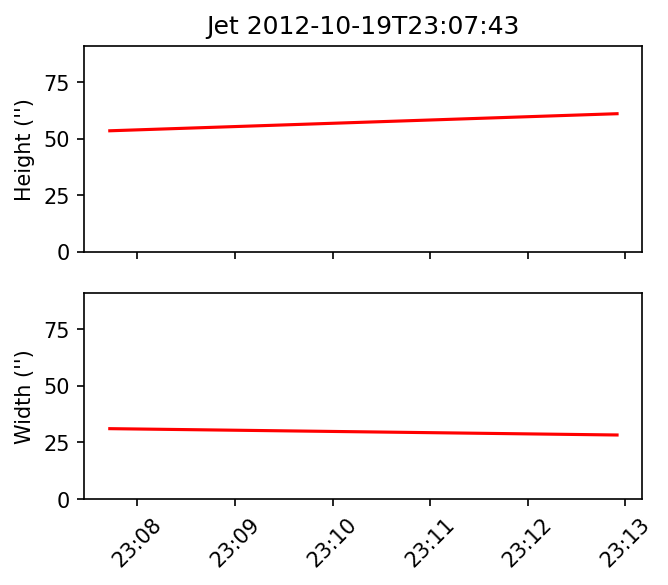

Jet start
Start base 40.8303 -979.859
0.7965697010054124


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -47.3569 -987.328
0.6668641217813828


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -26.4046 -981.523
0.14528891108822395


Start base -25.5344 -984.582
0.059663687411069956


Start base -16.9235 -980.891
0.17056033719622726


Start base -28.4834 -985.615
0.4224712017870196


Start base -38.6929 -984.208
0.28970409607106246


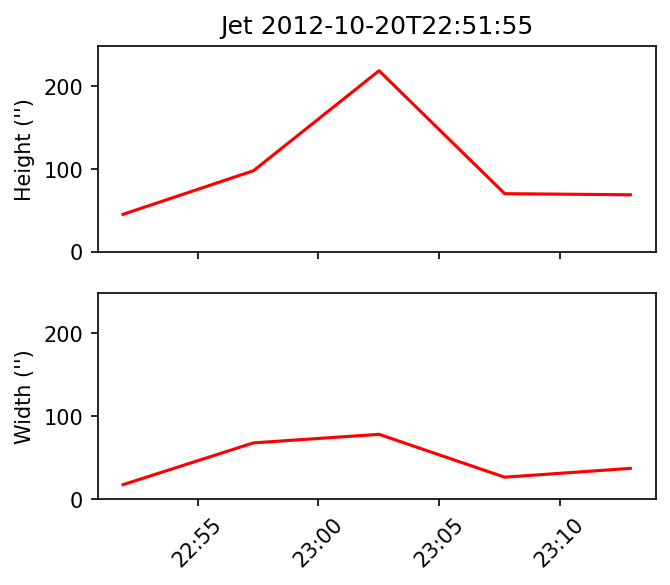

Jet start
Start base 950.786 -232.659
0.21861589949949792


Start base 952.106 -232.988
0.16773064001003277


Start base 952.544 -234.008
0.21738301404947716


Start base 959.822 -248.193
0.26558497086269783


Start base 949.988 -244.796
0.23567740159302103


Start base 950.651 -241.212
0.14928545662437623


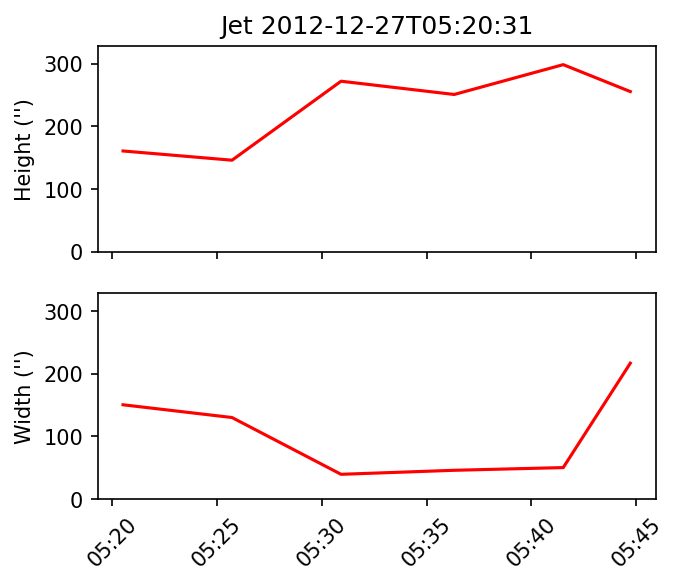

Jet start
Start base 948.907 -249.609
0.5318581905067049


Start base 949.988 -244.796
0.6177250323964972


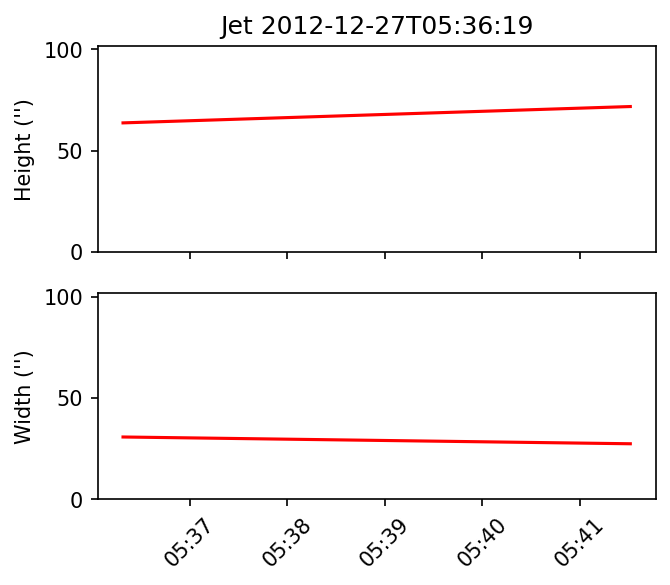

Jet start
Start base 452.874 854.881
0.4101579938405854


Start base 452.939 853.406
0.30449747342672273


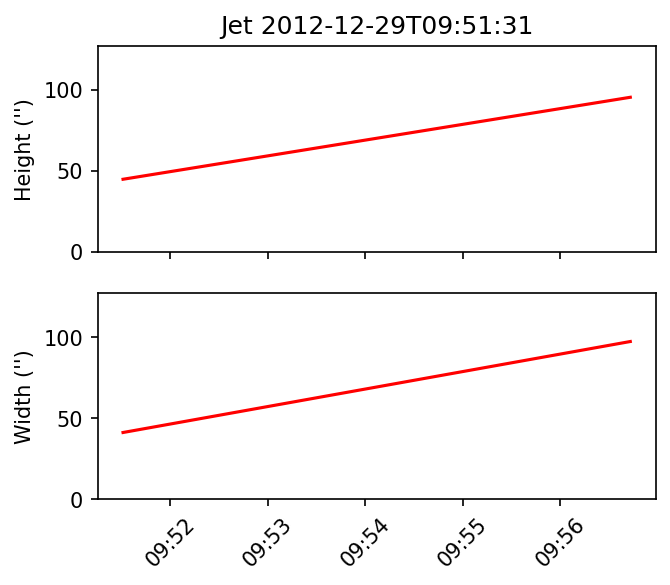

Jet start
Start base 461.517 852.787
0.5784145025797586


Start base 465.517 857.906
0.17311744314427965


Start base 461.934 846.33
0.19573032313942884


Start base 470.813 868.185
0.6099063183489848


Start base 473.876 870.084
0.16904733340873548


Start base 468.616 875.222
0.2279500156460351


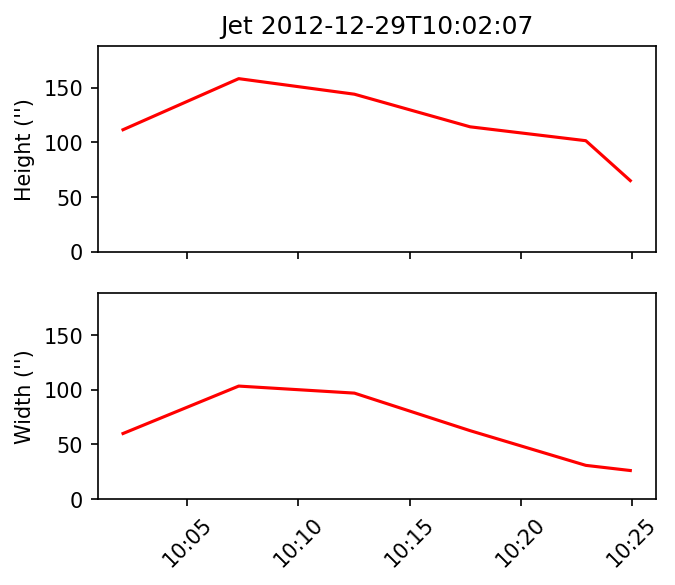

Jet start
Start base 465.517 857.906
0.5424363322323318


Start base 461.934 846.33
0.685250738001234


Start base 470.813 868.185
0.8030009170874601


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


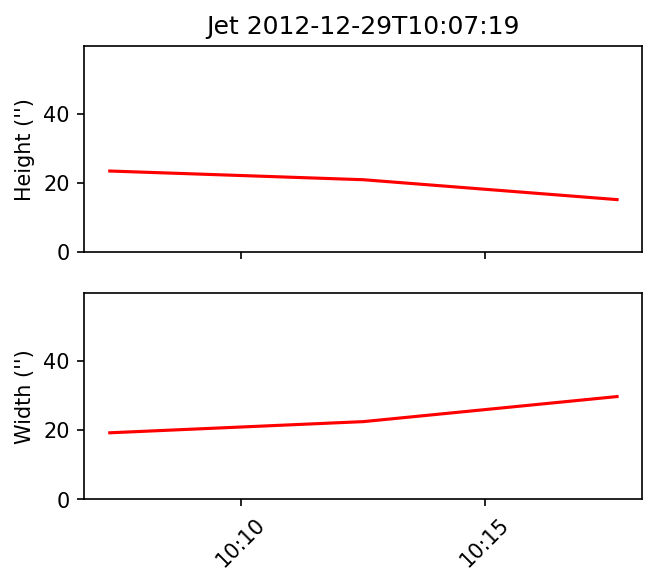

Jet start
Start base 41.3115 973.87
0.1674344628250292


Start base 34.097 985.384
0.30483280637780824


Start base 24.4071 988.482
0.08294467086399027


Start base 11.3806 981.693
0.6030651283038635


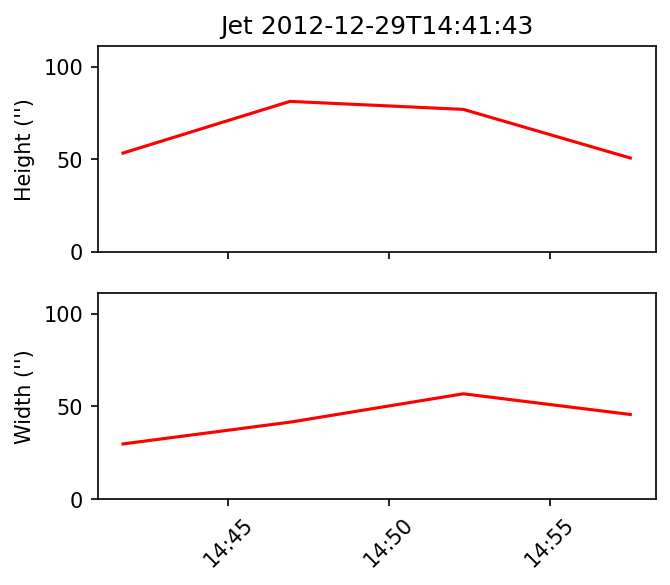

Jet start
Start base -50.1462 990.698
0.3194701730890372


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -62.8392 982.182
0.09304788763143847


Start base -66.6801 978.699
0.12533232551310425


Start base -64.9156 982.926
0.08823485445161296


Start base -65.2696 988.007
0.16392486996533676


Start base -64.1103 990.064
0.08757441797512332


Start base -65.0807 982.907
0.2636634375451191


Start base -65.3544 978.047
0.43112921762202583


Start base -64.6842 979.564
0.38690021171760053


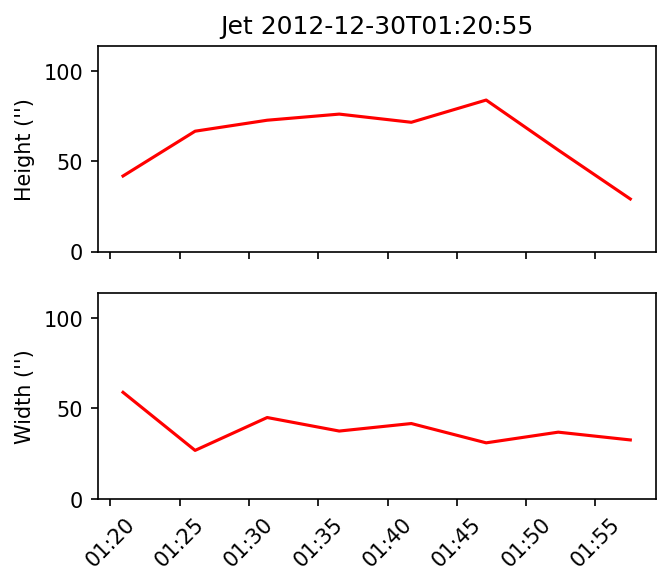

Jet start
Start base -65.0807 982.907
0.42290774110032897


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 62.1923 267.399
1.0000000000001115


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -112.738 196.247
0.9739934323557403


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 52.3658 379.445
0.7963832410157591


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 72.3809 368.394
0.6409374965317184


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -136.318 204.609
0.3983295559879731


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 317.215 281.612
0.7036977840469921


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -930.846 305.902
0.5446318982608577


Start base -932.029 298.727
0.2922775768314872


Start base -937.571 265.604
0.5197208069440414


Start base -925.978 300.369
0.47662532298397053


Start base -923.493 304.556
0.2522226217353208


Start base -929.941 301.4
0.1472625137993643


Start base -931.824 300.896
0.21465536899672896


Start base -927.969 300.531
0.21595250103743124


Start base -932.157 296.718
0.5710404996143917


Start base -931.594 303.347
0.68759092926277


Start base -934.598 295.694
0.5384865071857101


Start base -921.693 313.973
0.5982980387096137


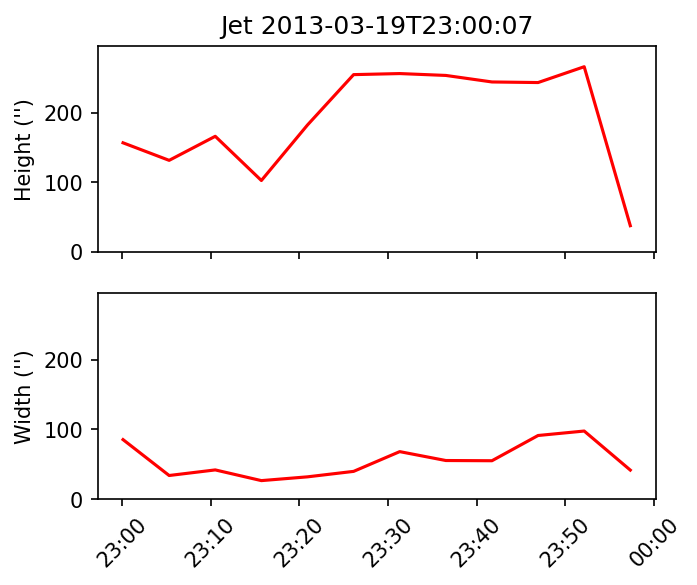

Jet start
Start base -930.846 305.902
0.48072641871755944


Start base -932.029 298.727
0.39246979354551964


Start base -926.14 300.591
0.166202874000637


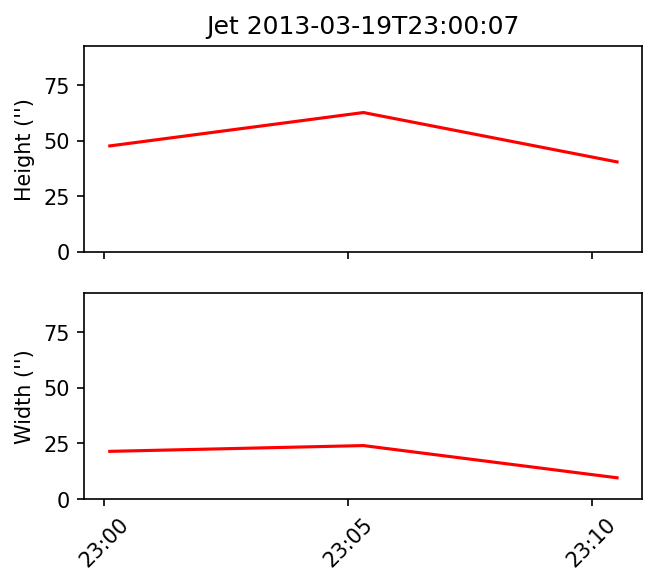

Jet start
Start base -954.962 218.959
1.004618288410363


Start base -935.37 261.796
0.20736777836932554


Start base -938.481 259.107
0.32963091702867614


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


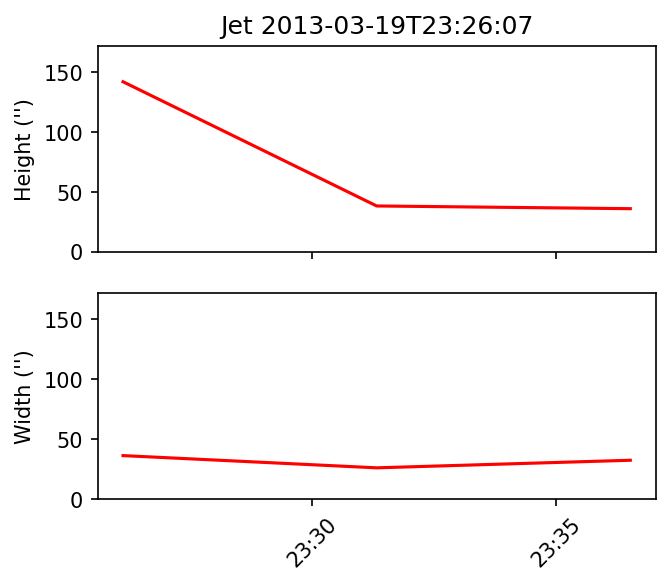

Jet start
Start base 107.255 482.028
0.17075458835952023


Start base 112.196 483.071
0.2828805836803728


Start base 108.327 482.257
0.2942939193110189


Start base 109.18 483.083
0.2357427122848378


Start base 104.94 480.84
0.2656656774062519


Start base 112.67 486.937
0.2504902018426435


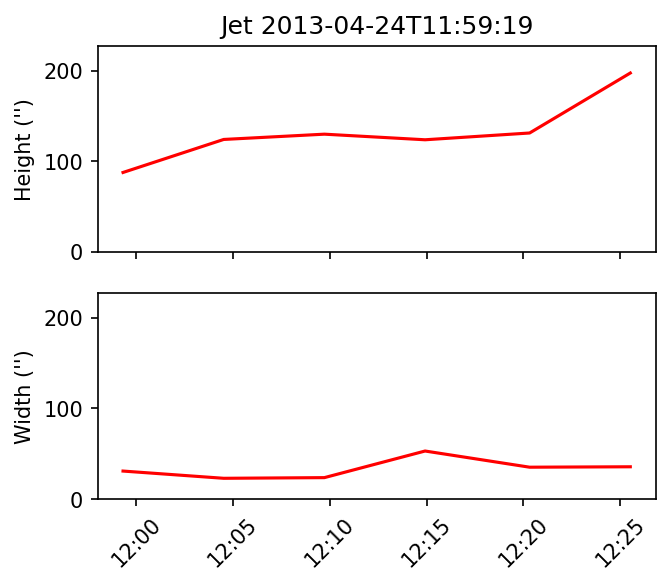

Jet start
Start base 112.67 486.937
0.3523539355040407


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 88.4242 992.411
0.7662808052011391


Start base 89.4481 990.165
0.5501355898312112


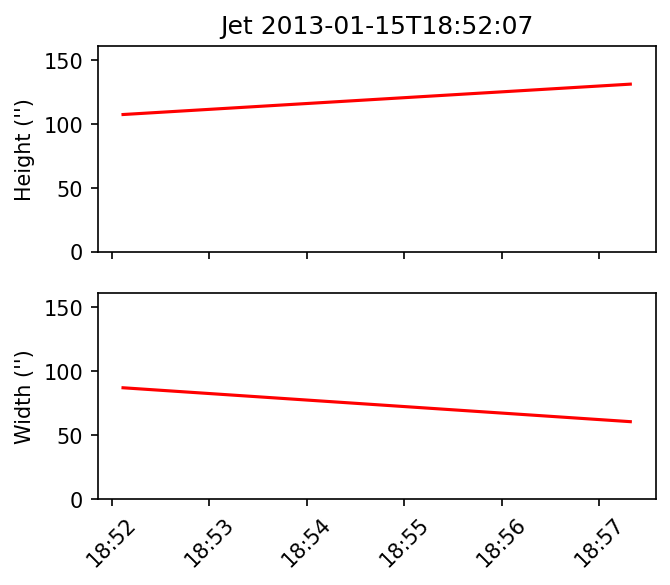

Jet start
Start base 202.852 992.454
0.19937962610326707


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 202.852 992.454
0.5291535106542959


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 287.344 940.375
0.7421157869951531


Start base 346.47 929.48
0.650083138504343


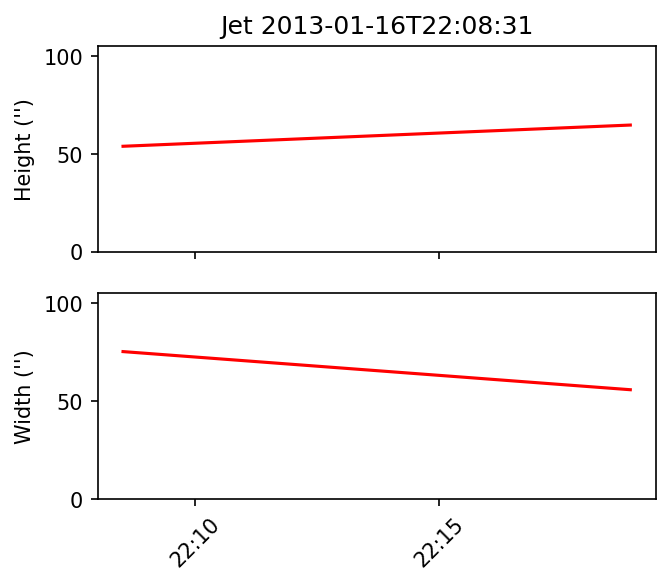

Jet start
Start base 346.431 926.576
0.4012578154260564


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 352.69 924.652
0.3776273973196387


Start base 349.793 929.001
0.6132565115403374


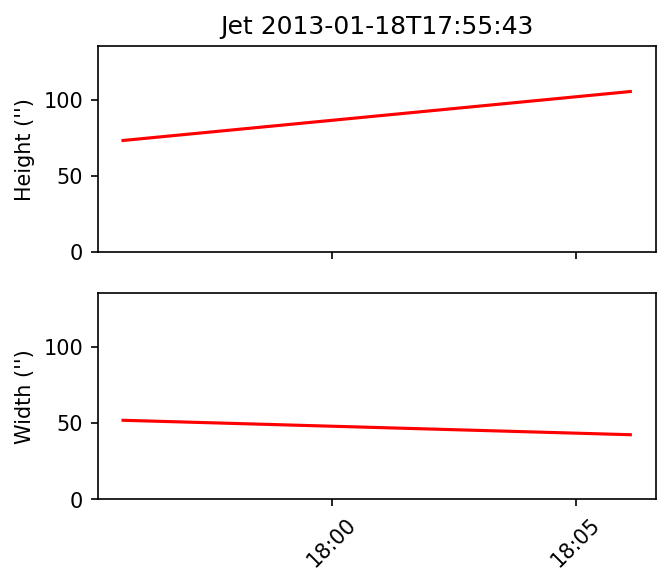

Jet start
Start base 239.52 925.572
0.2633854259987007


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 349.793 929.001
0.6388870033067419


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 350.082 924.413
0.3639583366652208


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -907.01 -394.061
0.21490102420493495


Start base -968.761 -442.362
0.16759085218248557


Start base -975.832 -441.841
0.10888229061054479


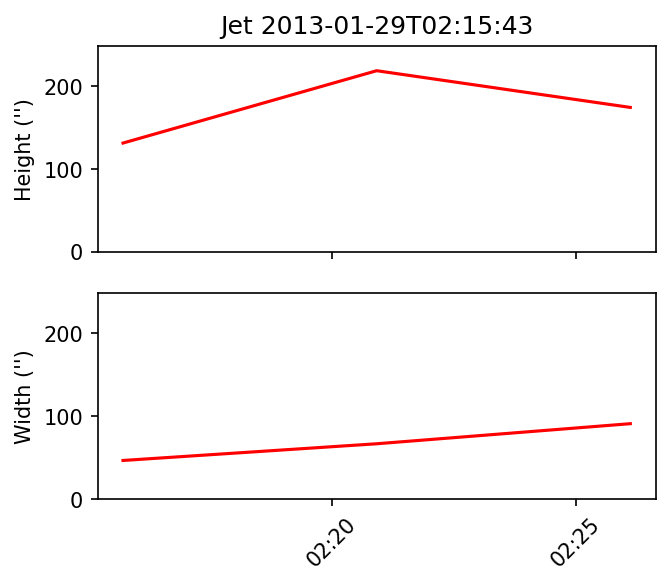

Jet start
Start base -971.761 -440.456
0.23732012849571188


Start base -970.516 -447.923
0.19567114757009804


Start base -967.288 -445.311
0.4036174581082613


Start base -908.308 -411.428
0.2537434825034137


Start base -979.751 -435.782
0.2041603673487096


Start base -975.429 -438.46
0.1777592134417385


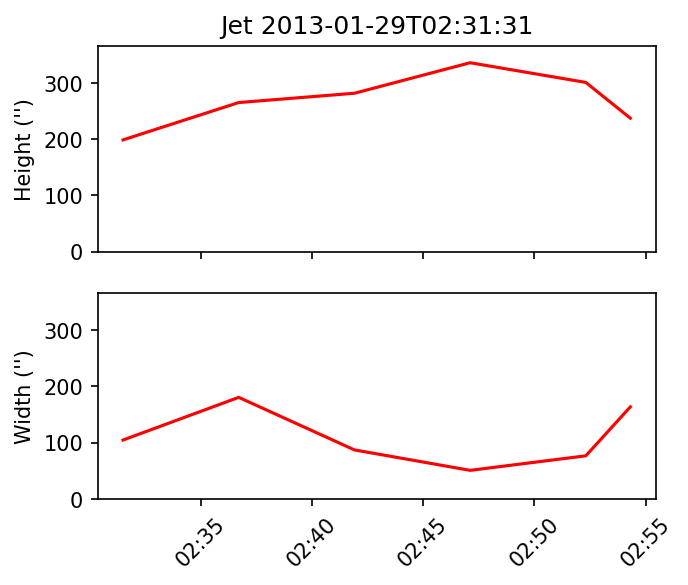

Jet start
Start base -692.929 667.575
0.6182223087180226


Start base -670.005 688.808
0.26104854994675053


Start base -674.465 694.653
0.11829957635236392


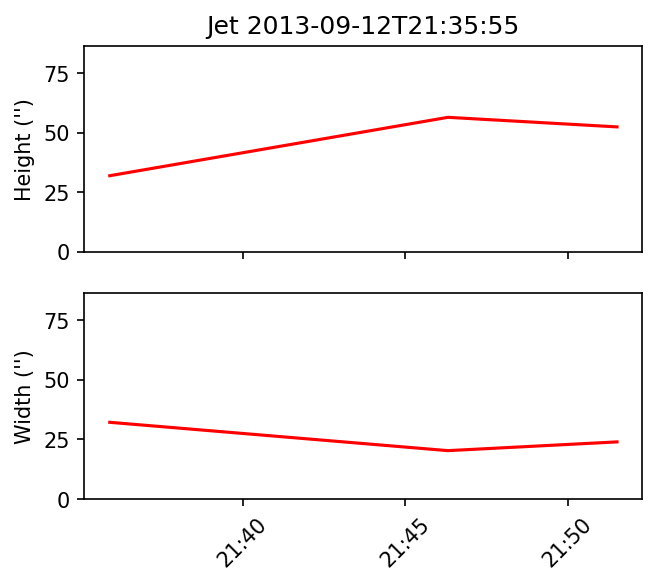

Jet start
Start base -692.929 667.575
0.7453388697715191


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -966.119 -9.82989
0.2210677379308315


Start base -970.158 -9.12045
0.23732617710412834


Start base -970.074 -18.1093
0.17220113518385405


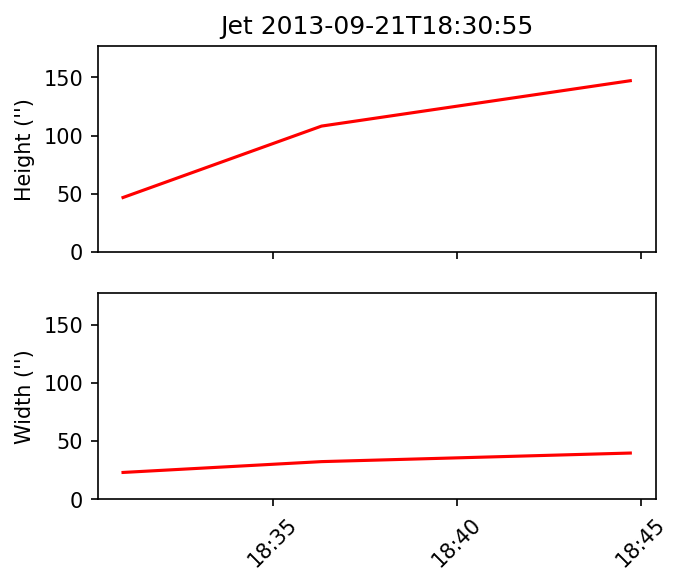

Jet start
Start base -757.264 19.6404
0.49815649374038473


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 884.712 343.228
0.1687037306499518


Start base 883.321 343.712
0.164887483802298


Start base 886.975 343.162
0.16765271683838895


Start base 907.781 338.476
0.15717157954986516


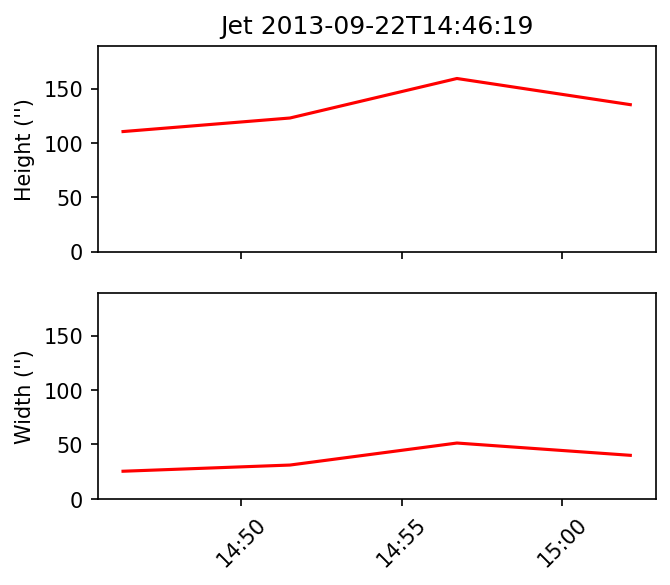

Jet start
Start base -914.762 310.759
0.36660198615174017


Start base -917.553 313.747
0.19839360657194854


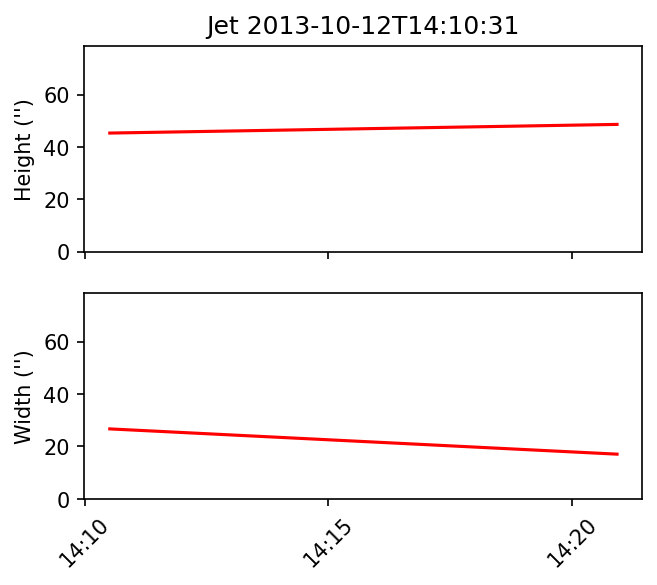

Jet start
Start base -933.378 272.716
0.6562579884907334


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -930.614 270.631
0.14280401642995363


Start base -930.596 269.873
0.1335148451425423


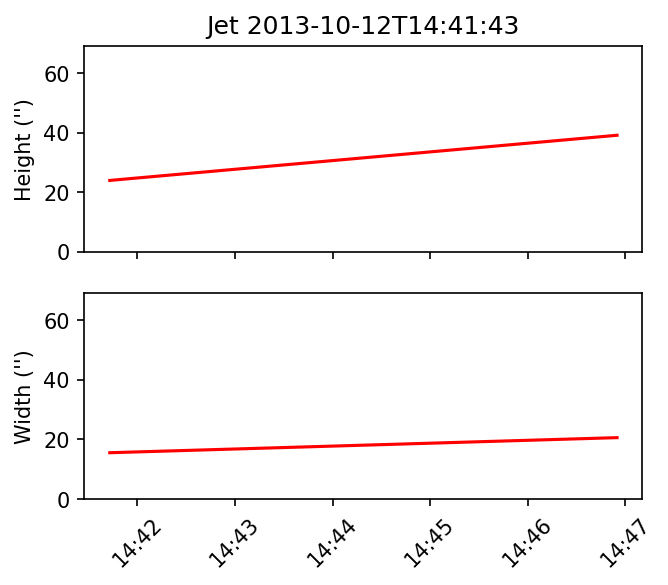

Jet start
Start base -930.614 270.631
0.8757537059595893


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -925.644 267.405
0.15957154608261775


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -925.644 267.405
0.38468280341617533


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -925.644 267.405
0.7038584835210814


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -911.25 306.943
0.8234274531269847


Start base -913.696 305.754
0.9177832531727642


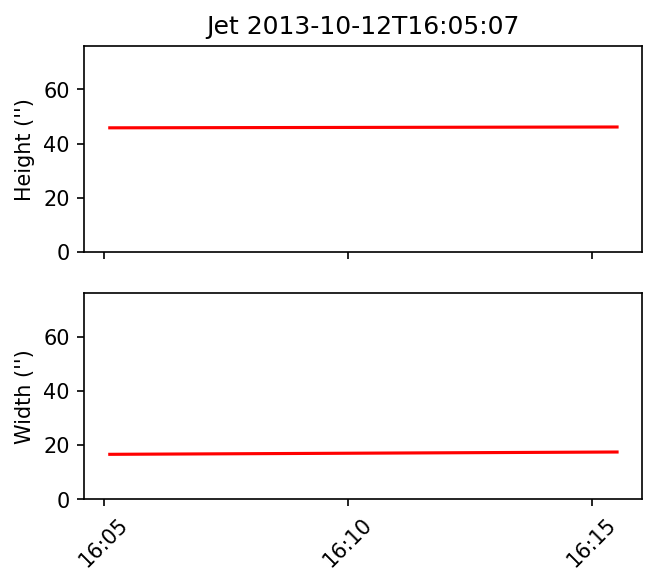

Jet start
Start base -913.696 305.754
0.6901206397038313


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -874.476 382.297
0.3599552642707918


Start base -874.136 382.024
0.10372076918300777


Start base -874.982 386.447
0.28620642633595356


Start base -874.419 378.016
0.2714745804575627


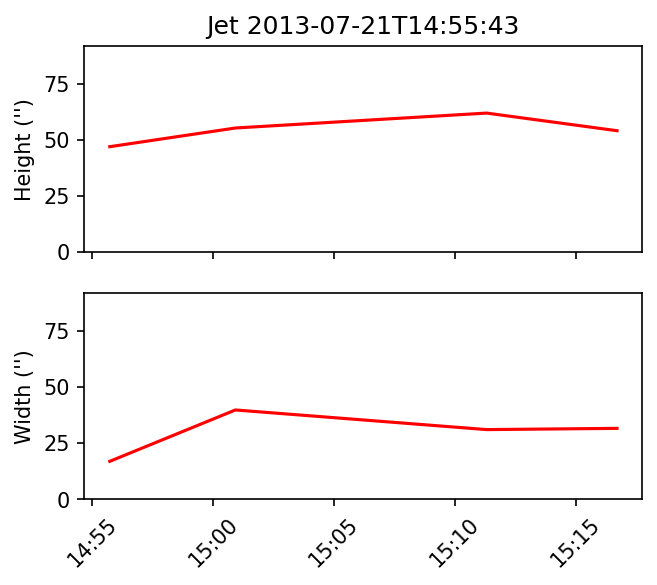

Jet start
Start base -821.466 491.29
0.3553016814945562


Start base -821.452 490.261
0.13478268520722586


Start base -819.046 490.842
0.2035518473899117


Start base -818.601 490.756
0.3683548280740213


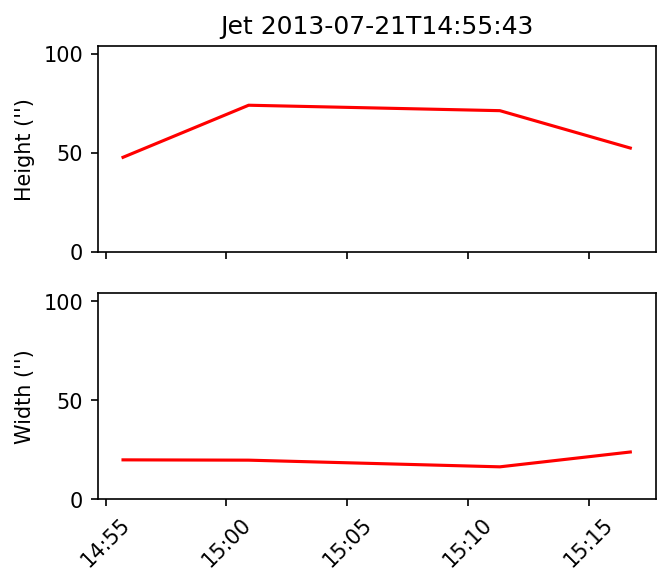

Jet start
Start base -876.437 385.025
0.544479635237464


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 334.084 309.256
1.0001395349830595


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 334.084 309.256
1.0088005109910776


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 353.816 324.447
0.32991017410853785


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 353.816 324.447
1.001047417265195


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 357.26 310.769
0.3228199975230815


Start base 355.544 326.741
0.26062508156215985


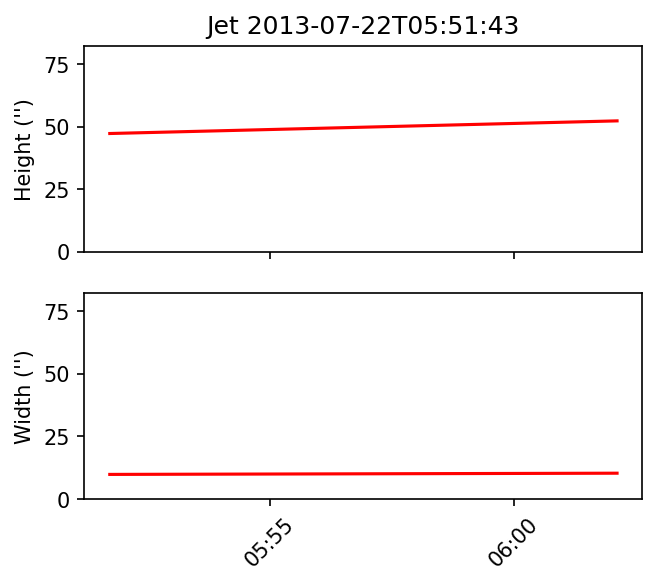

Jet start
Start base 937.298 212.705
0.27641940753850475


Start base 944.239 254.903
0.2021516176502469


Start base 930.468 241.406
0.12115927317047338


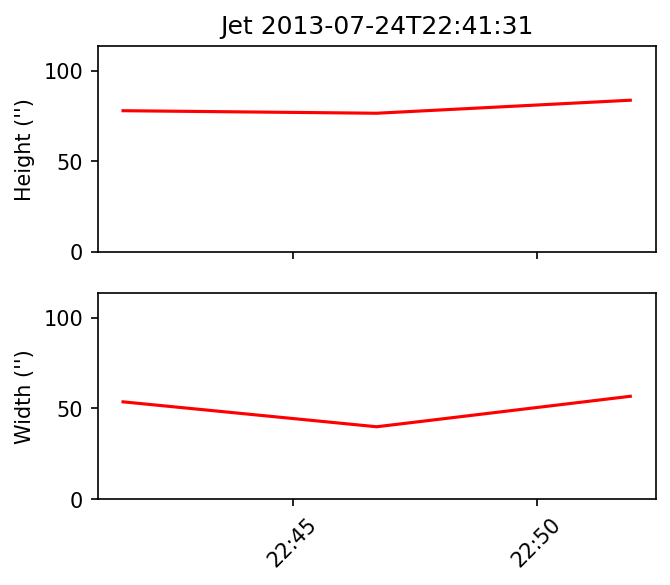

Jet start
Start base 945.913 176.426
0.6808671567783461


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -553.178 -486.657
0.0511741362899499


Start base -553.708 -484.112
0.08509561420340381


Start base -552.453 -486.278
0.33200098631067587


Start base -551.046 -483.79
0.60940187024197


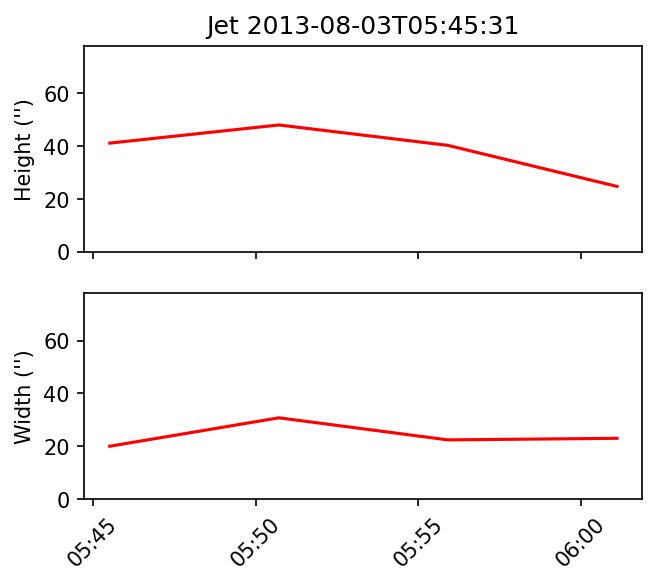

Jet start
Start base -552.453 -486.278
1.000000000000028


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -549.989 -484.085
0.4479774915082038


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -549.989 -484.085
1.0000000056797145


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -921.902 -256.049
0.16253092362153593


Start base -910.283 -250.157
0.2825353706196124


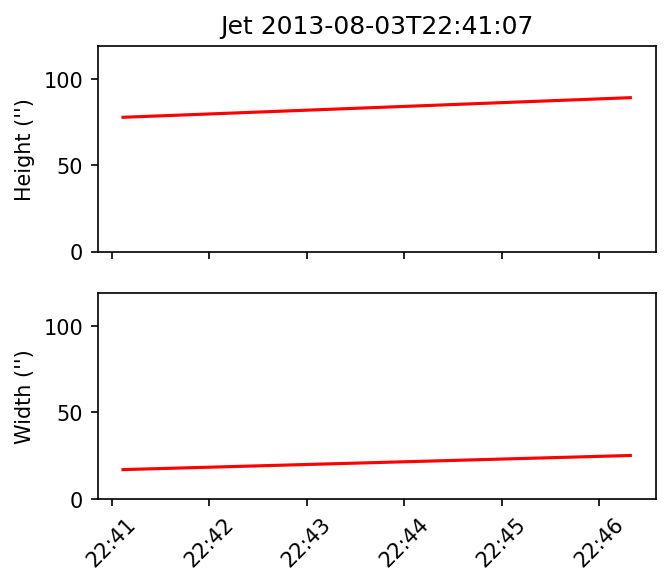

Jet start
Start base -922.356 -260.769
0.1818095049801498


Start base -912.396 -255.019
0.3055817760691454


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


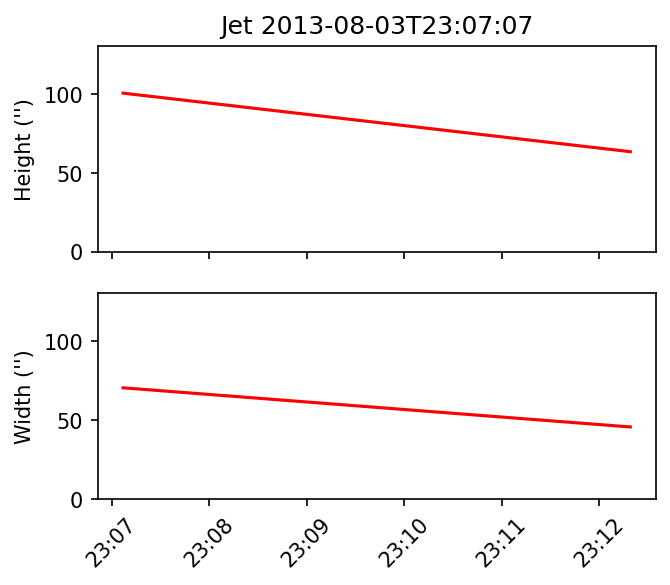

Jet start
Start base -920.061 -245.415
0.14177419905452365


Start base -919.686 -255.436
0.6572169249243321


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


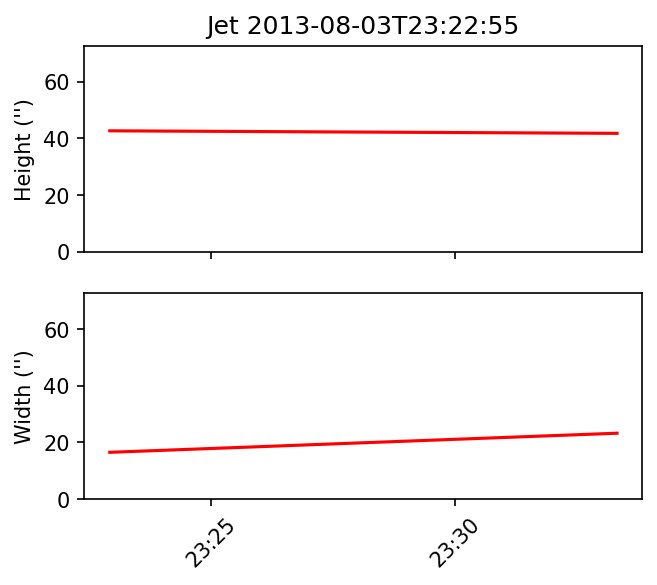

Jet start
Start base -922.139 -265.148
0.760053542595463


Start base -919.686 -255.436
1.000533996721403


Start base -917.031 -261.21
0.2426927668040053


Start base -915.54 -261.162
0.20813512965494907


Start base -924.811 -259.198
0.547591628641987


Start base -917.52 -258.828
0.5454726899806909


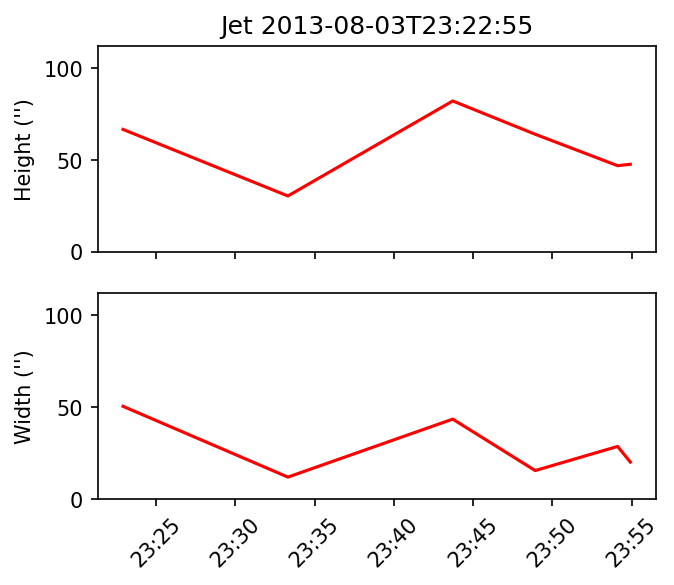

Jet start
Start base -70.3382 844.496
0.22401238730101


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 6.46971 957.691
0.4302336420113067


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -894.096 -263.012
0.1768146713151577


Start base -890.946 -279.392
0.14984737126143033


Start base -889.726 -276.223
0.21952347214310494


Start base -898.277 -287.708
0.2247612550293273


Start base -892.369 -282.411
0.25943925106730786


Start base -884.802 -290.69
0.26986514005891765


Start base -884.837 -297.491
0.6800044656860231


Start base -886.204 -297.332
0.5051157963172864


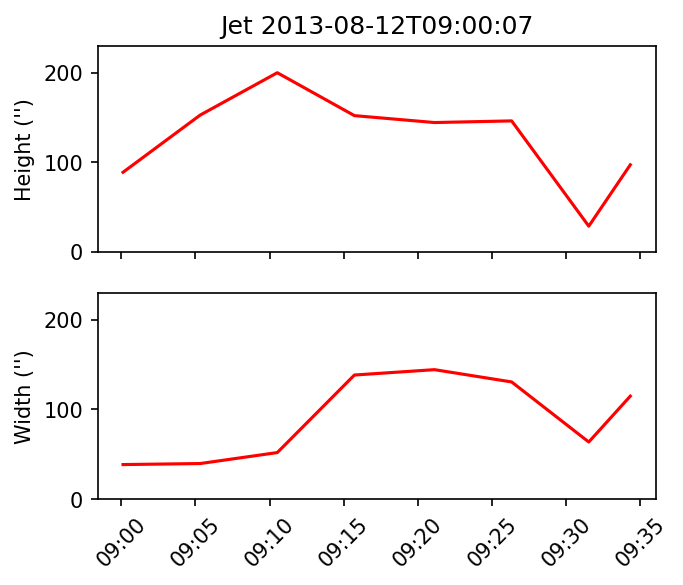

Jet start
Start base -885.494 -375.974
0.3328373945864066


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -884.837 -297.491
0.7083745921770687


Start base -886.204 -297.332
0.20225647993669235


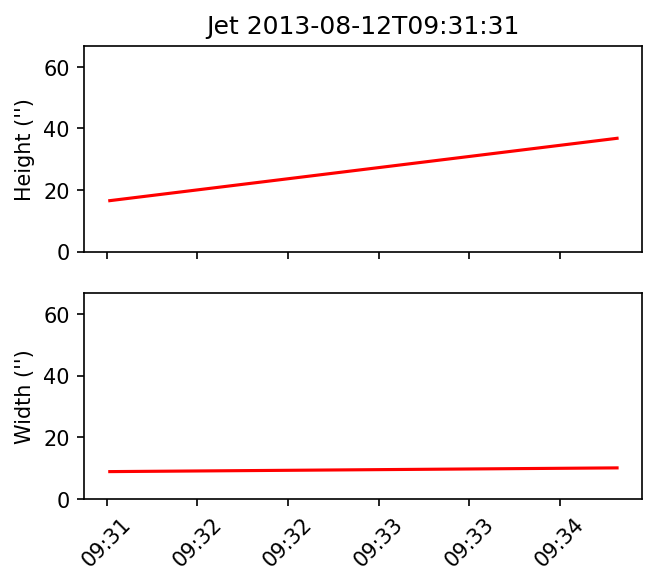

Jet start
Start base -145.339 949.94
0.6119483478032763


Start base -119.573 952.734
0.22417996575604457


Start base -128.191 959.279
0.20865377842863442


Start base -128.304 953.127
0.09018522487857582


Start base -15.7529 960.062
0.36425859801785204


Start base -130.366 952.541
0.3184170973270548


Start base -117.039 954.192
0.198790456744555


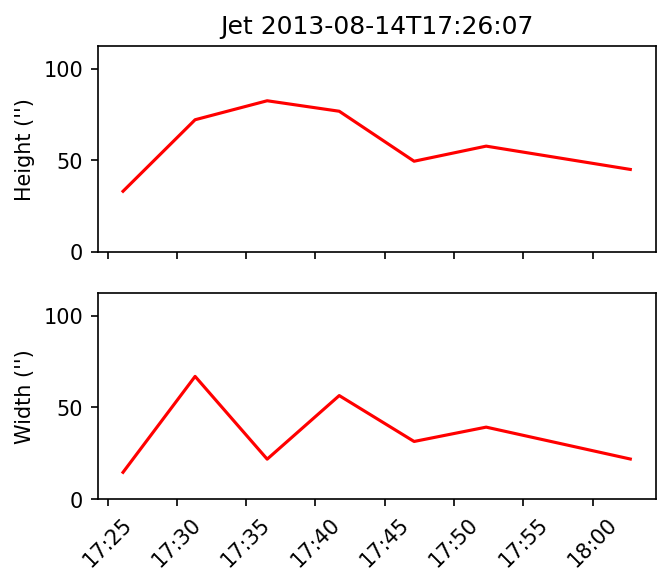

Jet start
Start base -84.7025 954.11
0.7598056459536026


Start base -119.573 952.734
0.9129890587246543


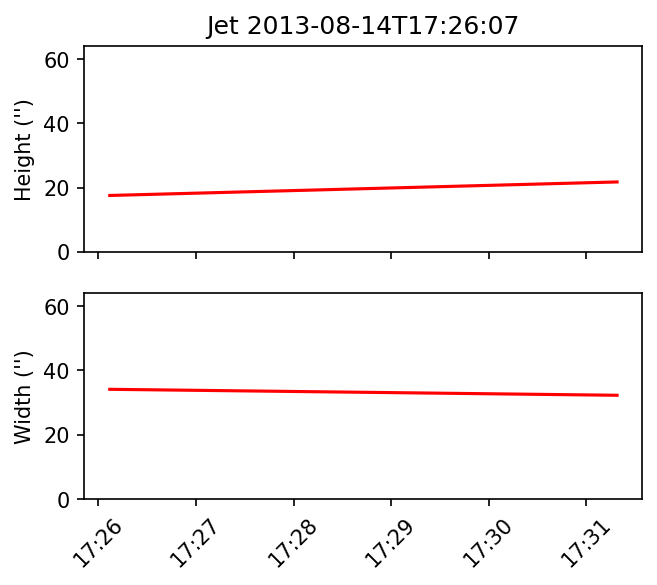

Jet start
Start base -21.9404 961.422
0.7402105026707227


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -128.306 954.012
0.21984360415561016


Start base -17.9452 961.93
0.639977972918769


Start base 1.78951 957.215
0.45006940338804724


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


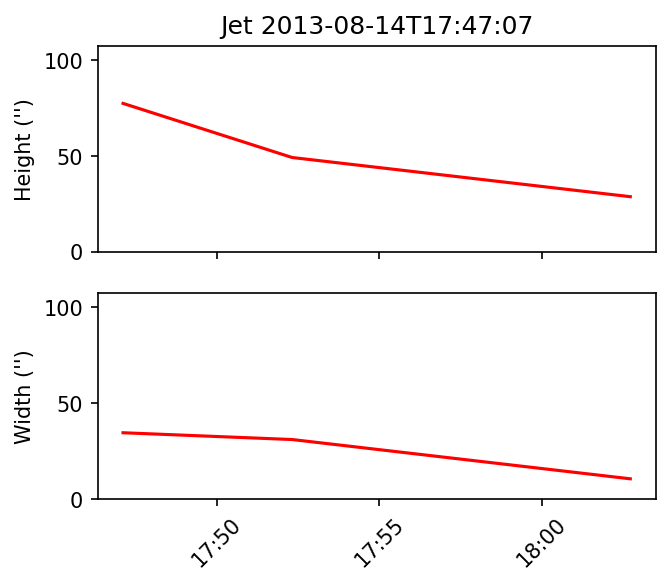

Jet start
Start base -39.509 970.142
0.8804718184079986


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -39.509 970.142
1.000000000274268


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -713.45 536.886
0.5692804814957877


Start base -698.092 679.608
0.23625543769708124


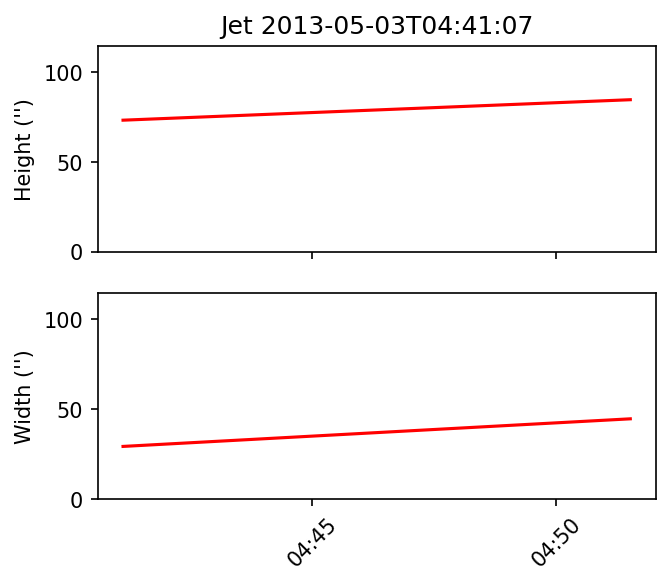

Jet start
Start base -699.772 673.777
0.7385329059053638


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -197.697 -291.774
0.4799437013161632


Start base -200.944 -304.305
0.5912329124700901


Start base -201.782 -308.471
0.5446529187181919


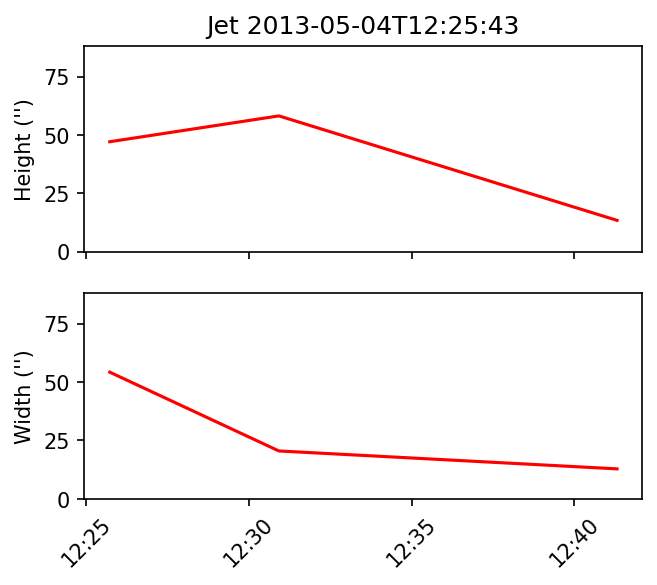

Jet start
Start base -219.434 -291.299
0.5596928718436678


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -201.782 -308.471
0.15880146511136656


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -185.423 -255.001
0.732671639596894


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -238.04 -319.232
0.4813703031284277


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -5.79319 -185.217
0.2768265052507145


Start base -8.00043 -193.955
0.2876392874759213


Start base -9.42787 -194.357
0.540464725199559


Start base -20.3421 -202.665
0.6078588290977605


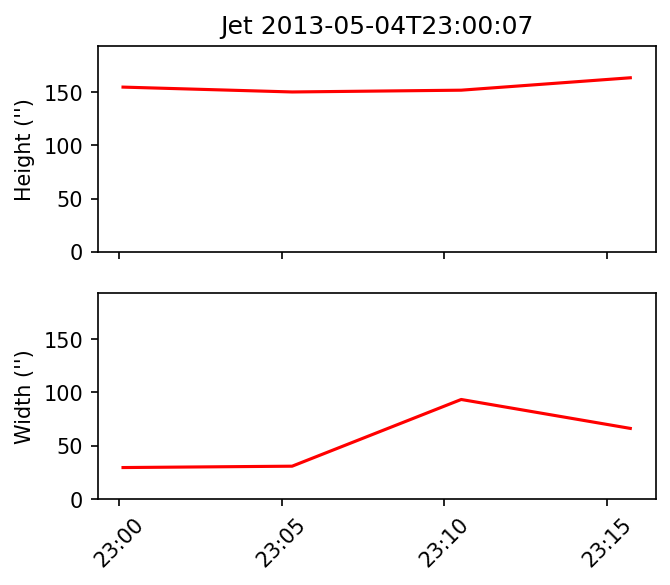

Jet start
Start base -34.5522 -224.535
0.37401278612315536


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -0.648892 -187.279
0.33484881683977497


Start base -31.3121 -221.017
0.42181949775677957


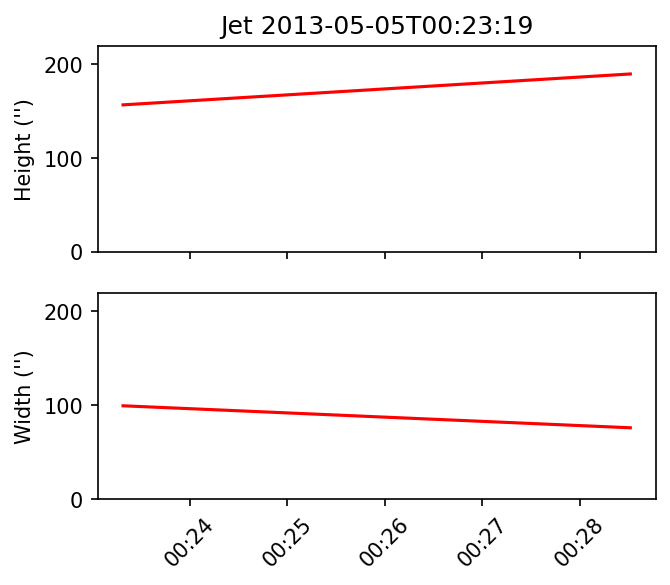

Jet start
Start base 1.87293 -207.803
0.39303385003830976


Start base -3.60343 -199.932
0.8152949082736117


Start base -2.96133 -179.602
0.216310182988465


Start base 5.70646 -175.73
0.19195223514862103


Start base 0.641258 -183.337
0.459916934815167


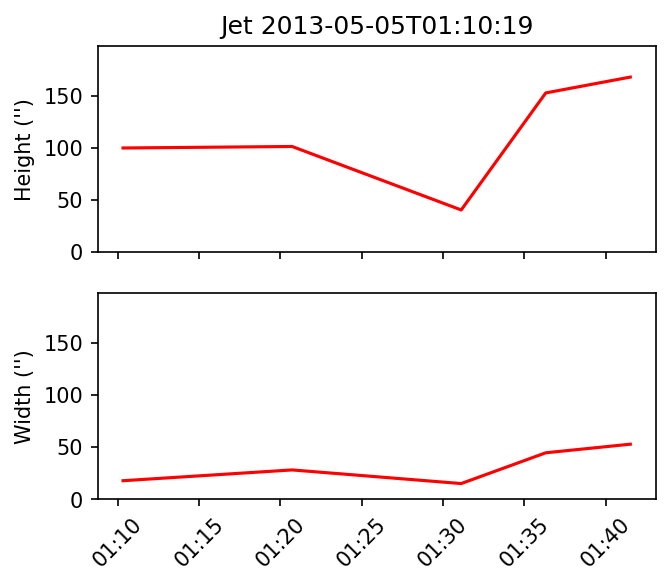

Jet start
Start base 1.87293 -207.803
0.7435614458334249


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 6.68113 -177.87
0.5927582698211454


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -114.74 -296.496
0.07904182175308985


Start base -115.424 -298.799
0.17613785186320977


Start base -118.855 -291.126
0.2485433774481352


Start base -121.785 -288.665
0.36275038693432643


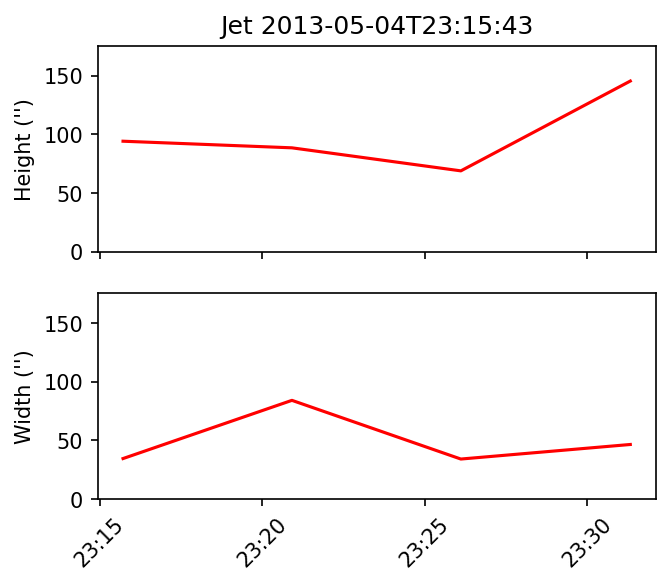

Jet start
Start base -107.822 -294.86
0.4792941024632427


Start base -105.327 -296.775
0.30405509128044034


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


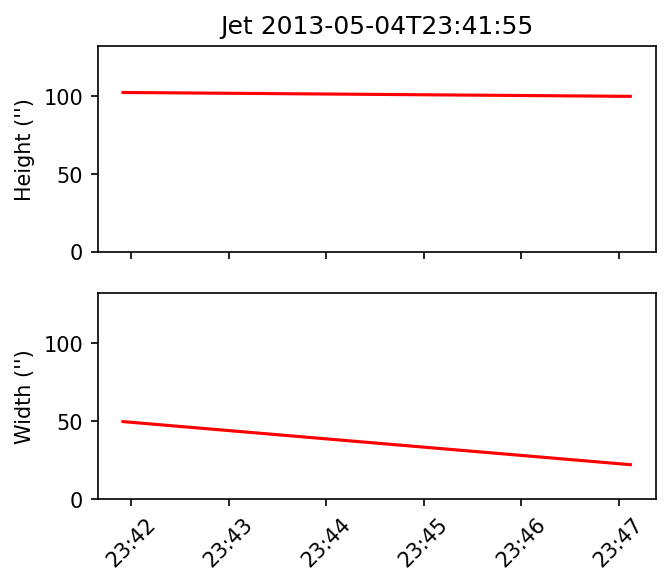

Jet start
Start base -105.327 -296.775
1.0000000000003268


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -901.25 -316.789
0.3935967204229972


Start base -900.94 -310.078
0.18719020369638692


Start base -898.447 -313.536
0.17444667095163682


Start base -902.509 -314.094
0.1674229495326575


Start base -901.576 -313.029
0.2619750443072661


Start base -903.717 -308.012
0.2339779182191763


Start base -903.801 -307.106
0.1576998553310893


Start base -911.729 -306.014
0.6291699055596708


Start base -903.973 -311.483
0.2173063144122246


Start base -903.955 -311.41
0.20693280127666708


Start base -902.819 -316.031
0.17093732555775498


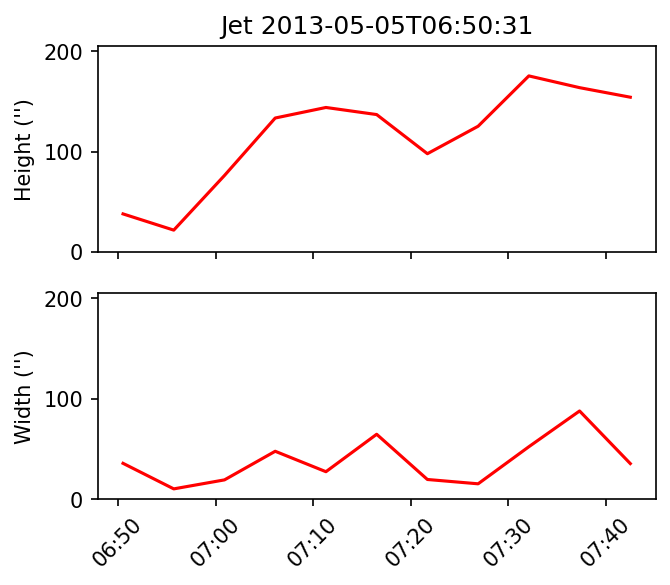

Jet start
Start base -911.729 -306.014
0.183561440519771


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -900.985 -303.091
0.2335374677436587


Start base -902.597 -306.336
0.2530949521026461


Start base -899.644 -306.223
0.6199468571382364


Start base -904.573 -305.194
0.17798204358209338


Start base -904.699 -304.695
0.21052995000952068


Start base -904.409 -313.147
0.23425024486820425


Start base -905.381 -306.827
0.18087143378059115


Start base -904.664 -305.385
0.17634916751438606


Start base -900.927 -308.408
0.4844711819329387


Start base -900.474 -302.709
0.6162993057049262


Start base -901.412 -305.395
0.21079258736654247


Start base -910.878 -319.343
0.3190159754216283


Start base -903.578 -309.241
0.16382870199614152


Start base -902.448 -304.271
0.19800360108215329


Start base -900.456 -301.254
0.2775144404089595


Start base -899.875 -299.95
0.25597183226193804


Start base -901.444 -304.35
0.4101971630853291


Start base -900.637 -306.656
0.3099212555355507


Start base -904.348 -305.407
0.22737419460215894


Start base -902.548 -300.185
0.20432276500797297


Start base -902.291 -305.742
0.24630464794413118


Start base -902.905 -308.168
0.1646163908477463


Start base -898.916 -303.541
0.29115767610827936


Start base -899.735 -304.42
0.29107917754326024


Start base -900.97 -305.873
0.30440889504199947


Start base -908.924 -307.146
0.10376778222386315


Start base -898.444 -305.63
0.2149480834054214


Start base -900.898 -308.787
0.21204056671967997


Start base -898.709 -299.854
0.2930300268627176


Start base -895.987 -302.412
0.18726674611397198


Start base -897.364 -303.086
0.2978453846576339


Start base -898.029 -303.108
0.24564011802607214


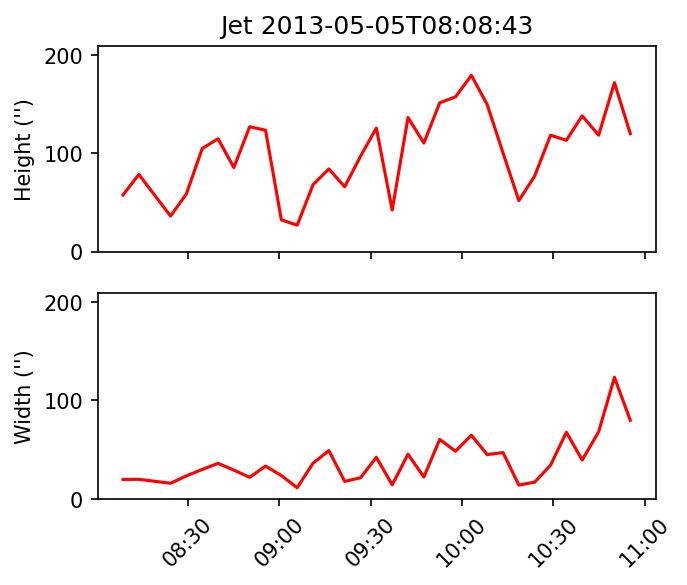

Jet start
Start base -900.927 -308.408
0.4927204278989605


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -956.591 -333.962
0.29641254546082


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -896.22 -300.87
0.26335405491651454


Start base -909.277 -302.942
0.1972734400936479


Start base -906.536 -301.428
0.2700029763592304


Start base -900.811 -301.092
0.16380026597269673


Start base -899.046 -300.622
0.13691610893588324


Start base -895.965 -298.989
0.15093800492902676


Start base -900.585 -301.133
0.19316227146756132


Start base -897.975 -301.827
0.1457729957980156


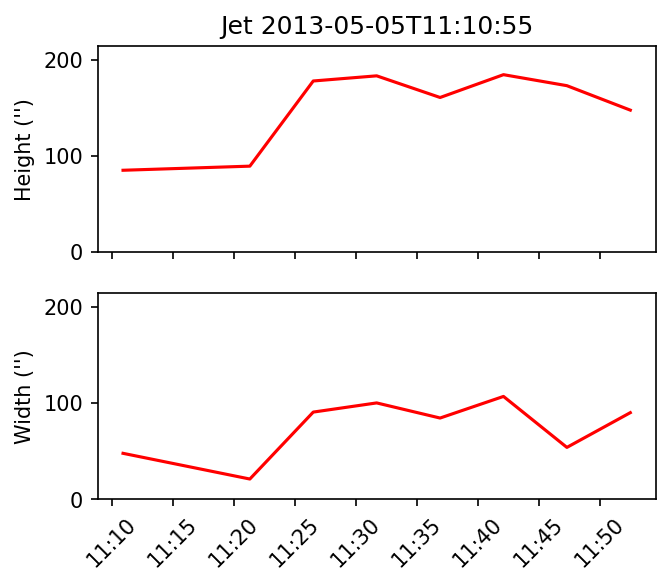

Jet start
Start base -754.918 228.125
0.17467914670653936


Start base -756.494 225.276
0.2699716272332724


Start base -756.456 225.042
0.207199104914993


Start base -756.256 236.917
0.455880224277686


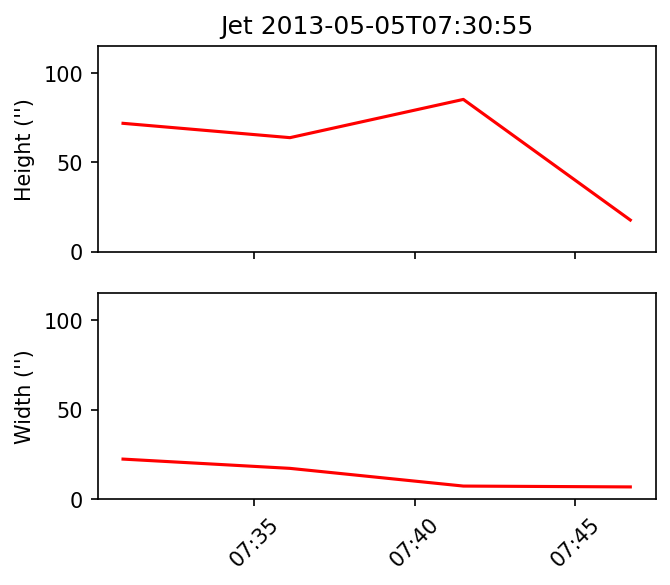

Jet start
Start base -754.756 230.676
0.559094917723951


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -754.756 230.676
0.5509731242324698


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 678.269 393.403
0.37834247798630183


Start base 646.413 407.26
0.6815956008737752


Start base 674.357 387.719
0.1558485371404821


Start base 670.574 391.169
0.1803931344884762


Start base 641.844 396.131
0.4359391661903841


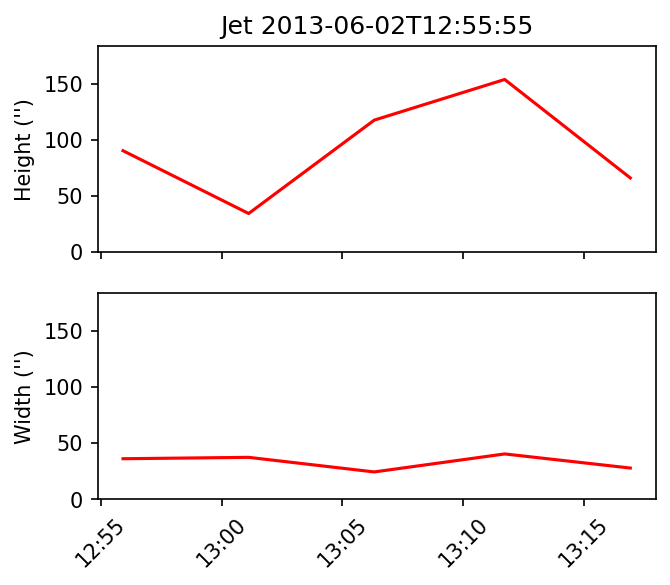

Jet start
Start base 678.269 393.403
1.000000000000057


Start base 678.142 389.218
0.2441472366110768


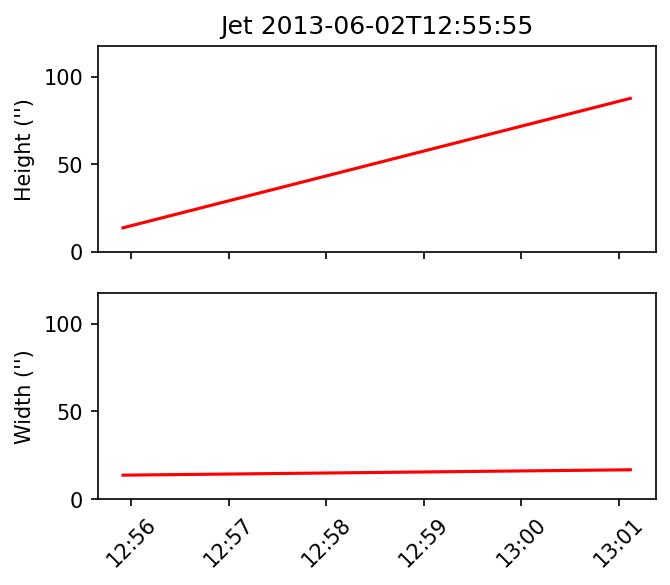

Jet start
Start base 641.29 393.594
0.5537602771671841


Start base 641.844 396.131
1.000007021953158


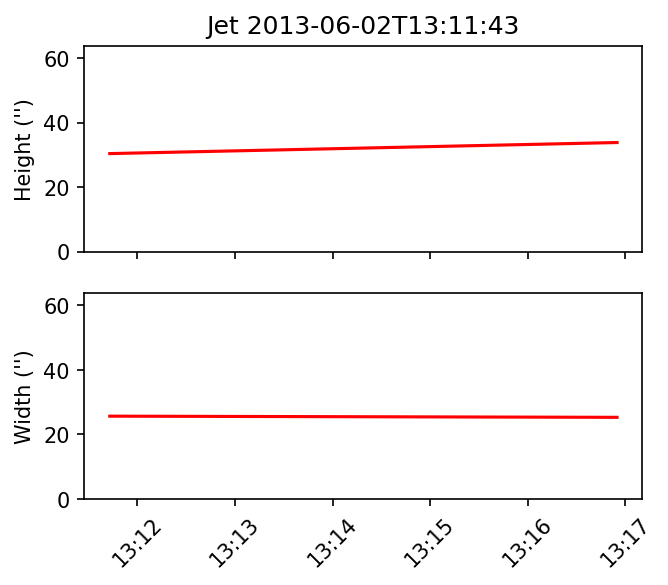

Jet start
Start base 894.868 -330.655
0.6696684121372041


Start base 910.802 -262.31
0.23442484539033698


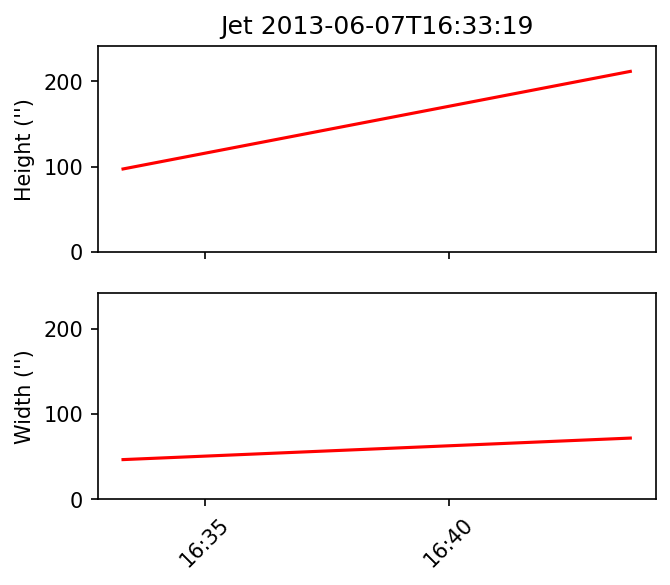

Jet start
Start base 907.036 -264.482
0.4119935645539412


Start base 911.33 -265.71
0.25816037042783346


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


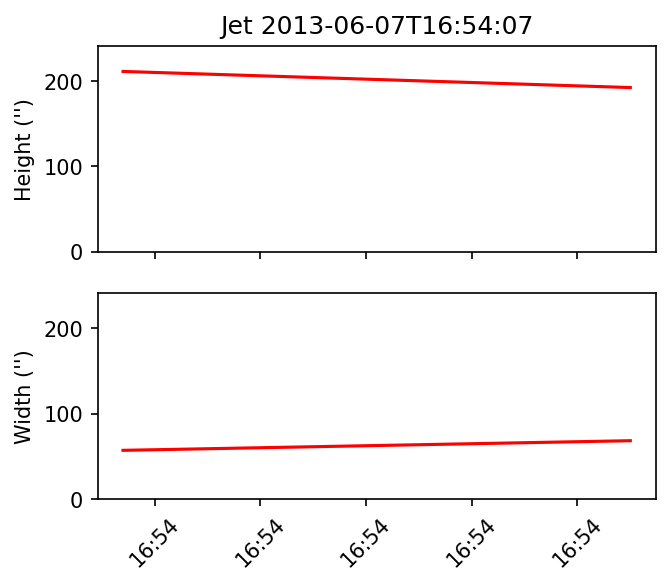

Jet start
Start base -846.088 -253.527
0.25040385906160767


Start base -847.1 -251.668
0.22420888636785927


Start base -847.31 -250.517
0.13278873247796802


Start base -950.782 -196.488
0.22852743164529069


Start base -845.896 -248.812
0.5727689388586243


Start base -845.939 -249.594
0.4783833699012545


Start base -844.937 -250.839
0.5966621951058874


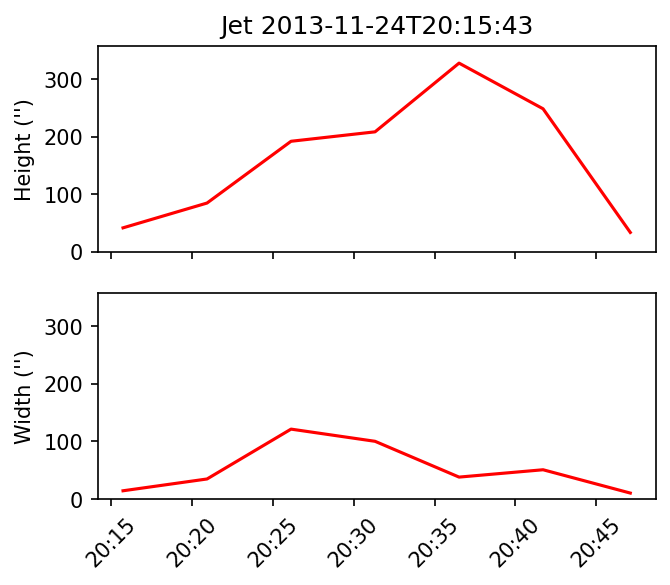

Jet start
Start base -968.516 -164.455
0.5738410736404249


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base -844.937 -250.839
0.7059721488967463


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 973.577 168.971
0.2887330145598757


Start base 971.549 170.797
0.20544454768893475


Start base 970.49 172.074
0.3273372190711395


Start base 977.056 169.259
0.386509054722308


Start base 975.155 171.621
0.22549461943586877


Start base 971.068 171.181
0.2296313376696987


Start base 966.95 170.175
0.18664980295341513


Start base 968.447 173.722
0.09503821768797284


Start base 972.201 177.432
0.24470472300847404


Start base 967.266 182.513
0.23723227364977317


Start base 967.463 181.847
0.19760317129068686


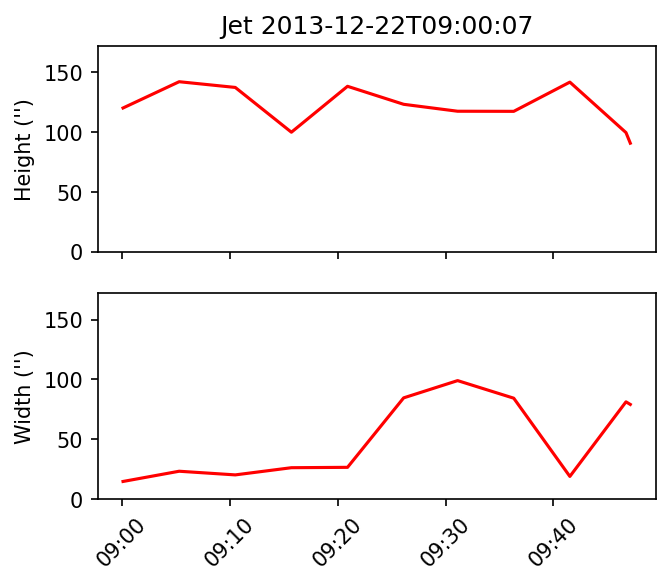

Jet start
Start base 970.49 172.074
0.8096225851161577


Start base 977.056 169.259
0.19004088148425555


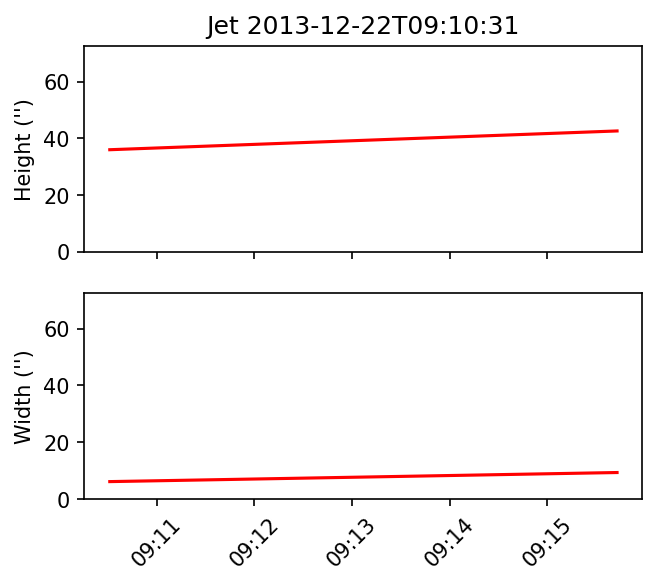

Jet start
Start base 965.666 183.172
0.5103979264550997


Start base 967.266 182.513
0.3750612789096581


Start base 967.463 181.847
0.30584264625682556


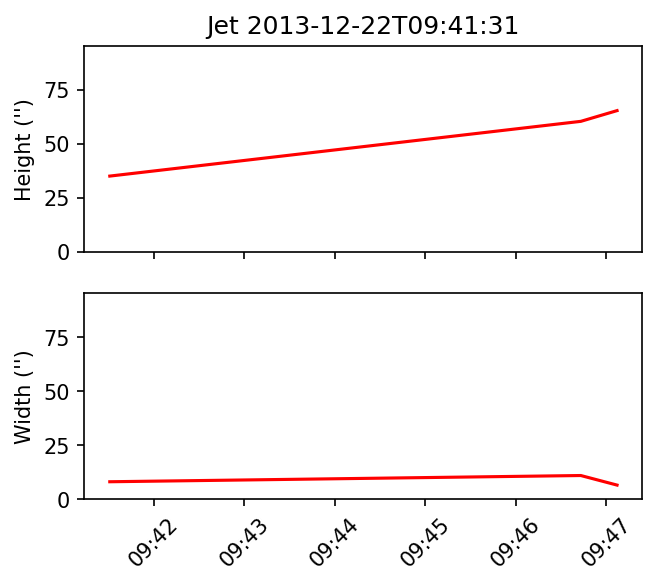

Jet start
Start base 968.46 169.927
0.17021936307867222


Start base 972.214 171.016
0.14879090900553513


Start base 981.037 172.446
0.2569271809364519


Start base 974.124 177.52
0.14436100677829716


Start base 969.258 171.046
0.4821521502679654


Start base 972.901 173.419
0.27992580250134214


Start base 970.673 172.342
0.16846729392981147


Start base 973.777 169.995
0.2775121041240677


Start base 974.938 169.759
0.1360149862794002


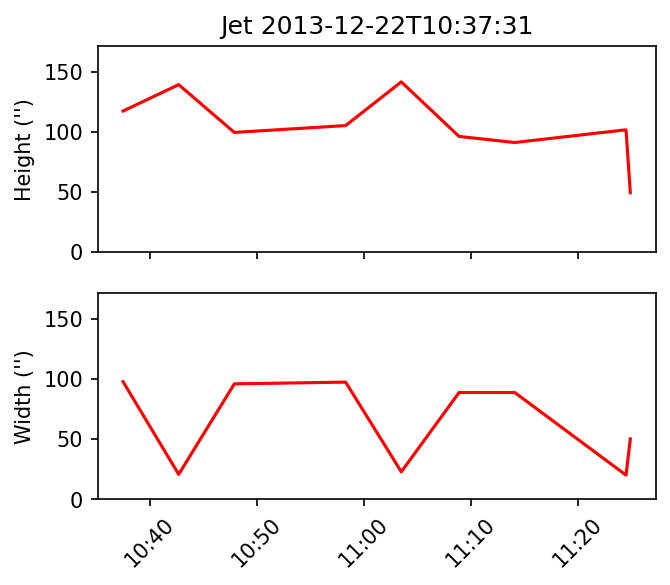

Jet start
Start base 972.214 171.016
0.8999242660553007


Start base 981.037 172.446
0.7201209169946827


Start base 976.205 171.145
0.3498158590613021


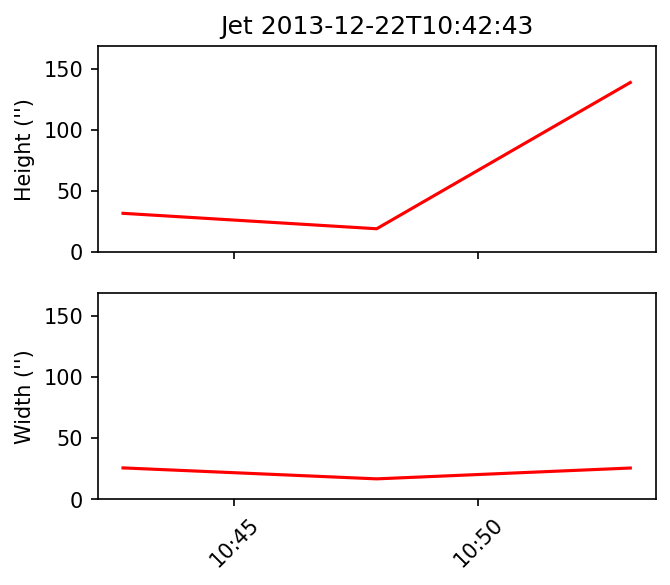

Jet start
Start base 970.673 172.342
0.42028912659324313


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 980.243 169.246
0.29931134428449935


Start base 1031.92 221.661
0.27980803934700216


Start base 979.651 169.076
0.13180184013644375


Start base 979.406 169.78
0.13463591295568872


Start base 978.945 169.095
0.21813532657865226


Start base 979.363 169.054
0.524342136207738


Start base 980.121 169.265
0.35141287490984435


Start base 980.56 169.106
0.4264054067716436


Start base 978.081 169.254
0.13171995116786864


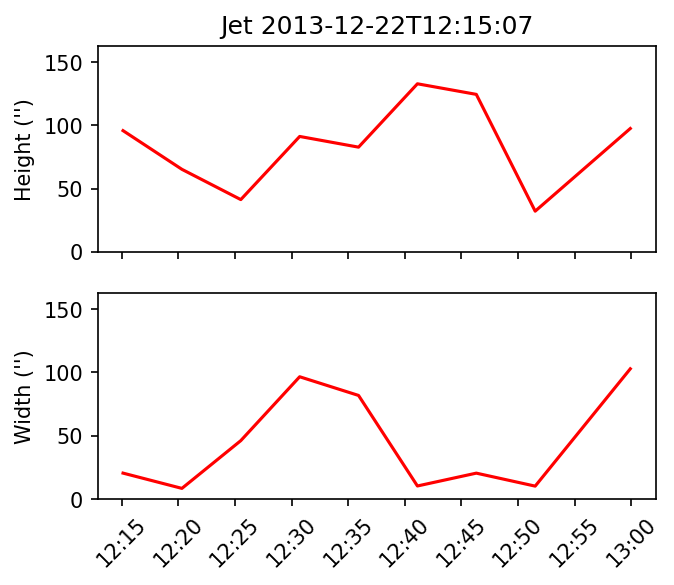

Jet start
Start base 979.363 169.054
0.17875242026287916


Start base 980.56 169.106
0.05283787772288445


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


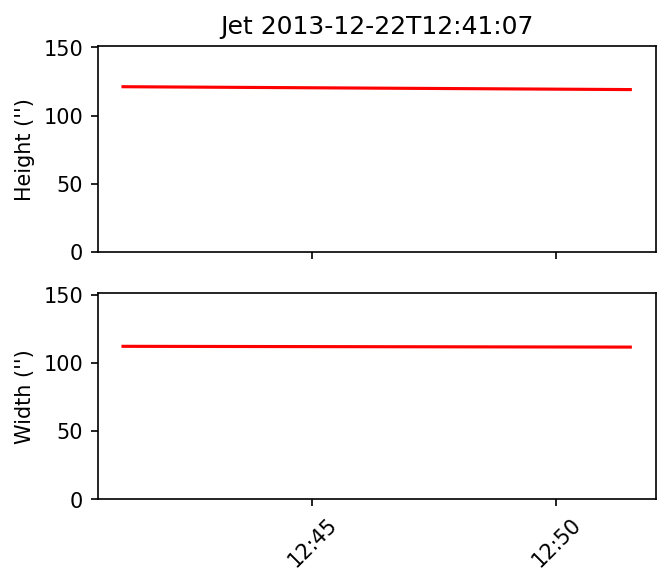

Jet start
Start base 835.888 -297.129
0.3256719249563099


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 860.745 -284.67
0.5284839548799596


Start base 856.556 -283.041
0.2180111596753449


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


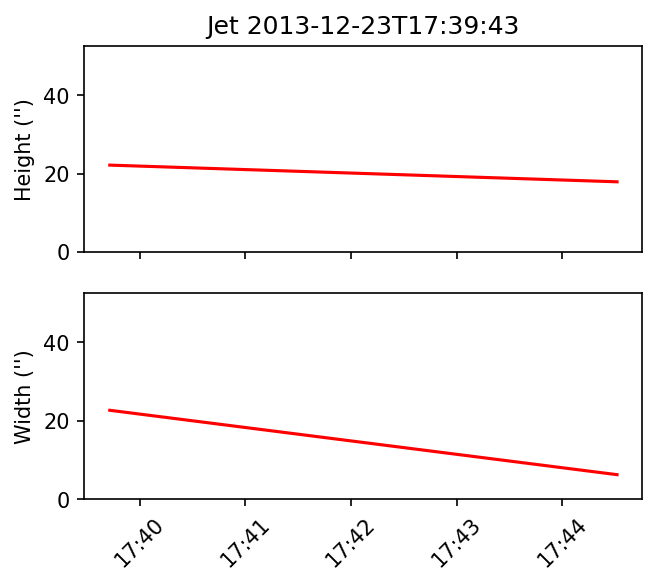

Jet start
Start base 925.12 -317.771
0.13998538284293732


Start base 925.69 -317.957
0.19954758906299294


Start base 927.48 -319.844
0.11877121947185178


Start base 926.925 -313.759
0.19992892559174108


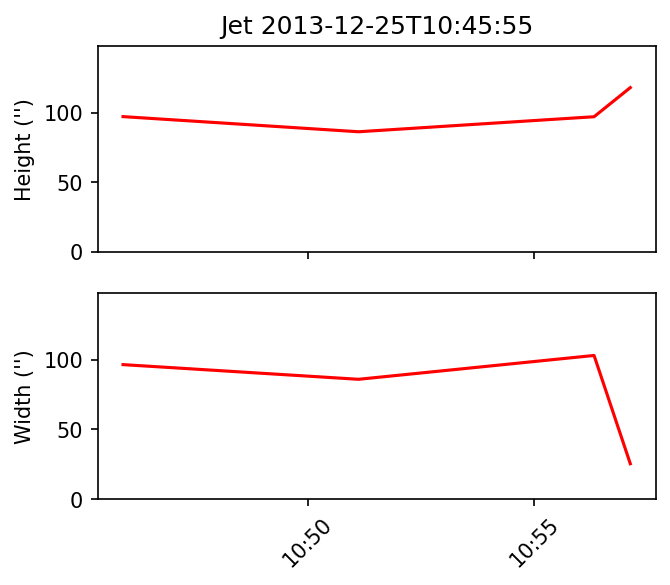

Jet start
Start base 932.634 -301.14
0.7999283495746266


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 354.501 -225.241
0.2863794915042912


Start base 362.455 -227.78
0.20687423837365054


Start base 361.849 -228.995
0.4900092959725163


Start base 339.053 -228.108
0.29369654878703066


Start base 342.452 -220.349
0.44288247665764247


Start base 373.611 -236.005
0.27021626775191965


Start base 341.945 -215.674
0.3264974922645793


Start base 348.408 -217.971
0.24283917284601567


Start base 354.638 -221.452
0.6005938048013609


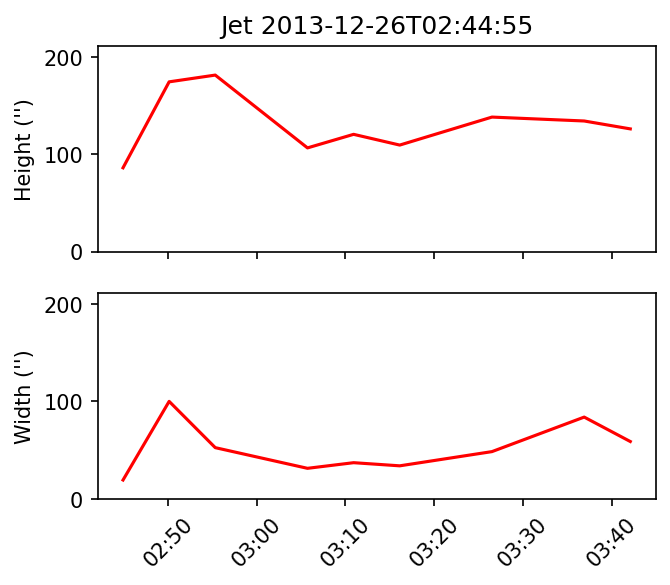

Jet start
Start base 348.279 -233.164
0.28718009478518947


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 378.425 -205.874
0.5227069075557735


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 379.812 -230.217
0.6327042920929892


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 379.812 -230.217
0.7898888756974787


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 375.519 -243.8
0.6766705223947419


Start base 377.396 -239.319
0.8158027380039411


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


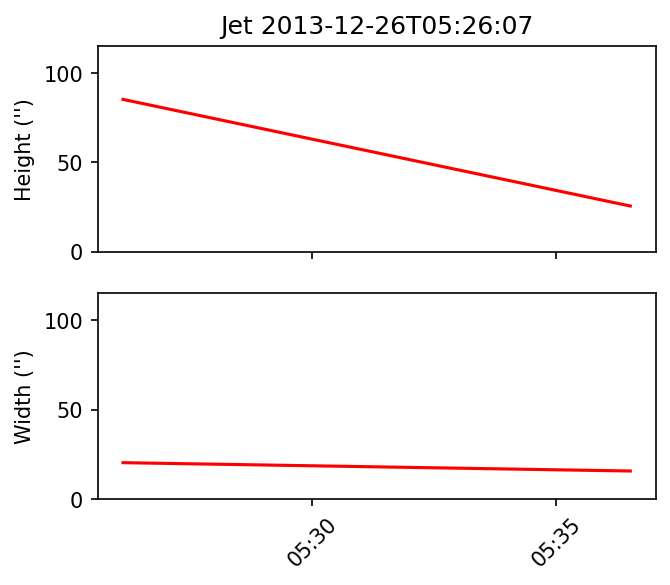

Jet start
Start base 360.658 -225.291
0.37683809824792985


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 382.712 -226.376
0.2630596487456778


Start base 409.367 -229.687
0.43733571453528225


Start base 364.432 -235.81
0.19941868916812927


Start base 380.577 -238.663
0.1976854452541098


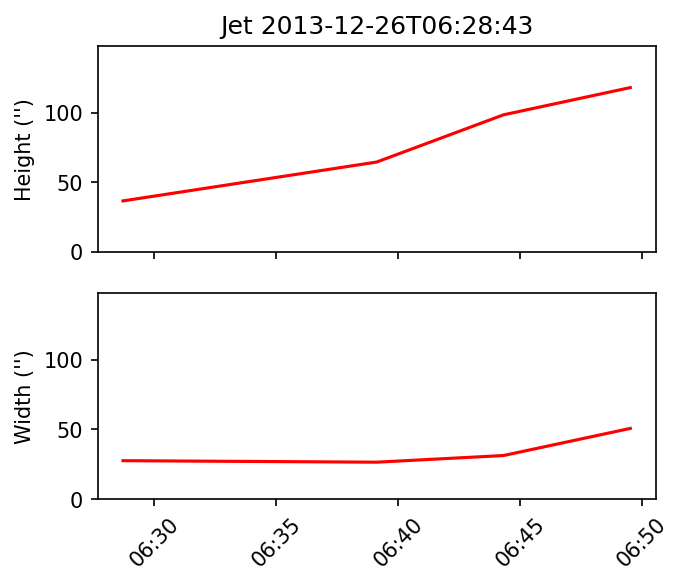

Jet start
Start base 409.367 -229.687
0.4372587348415536


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Jet start
Start base 403.329 -237.808
0.29992958158082117


Start base 397.341 -229.234
0.3915797069088227


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


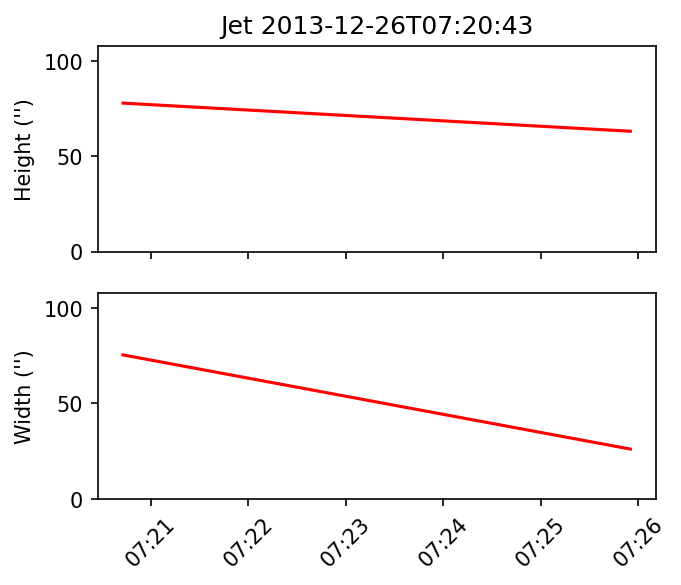

Jet start
Start base 407.81 -208.643
0.7967626952811209


Start base 410.525 -221.289
0.3616213761172228


Start base 389.336 -217.351
0.5922233930829314


Start base 407.496 -221.599
0.5382259606362721


Start base 367.703 -229.43
0.5591173362946538


Start base 377.846 -234.25
0.7557425807903144


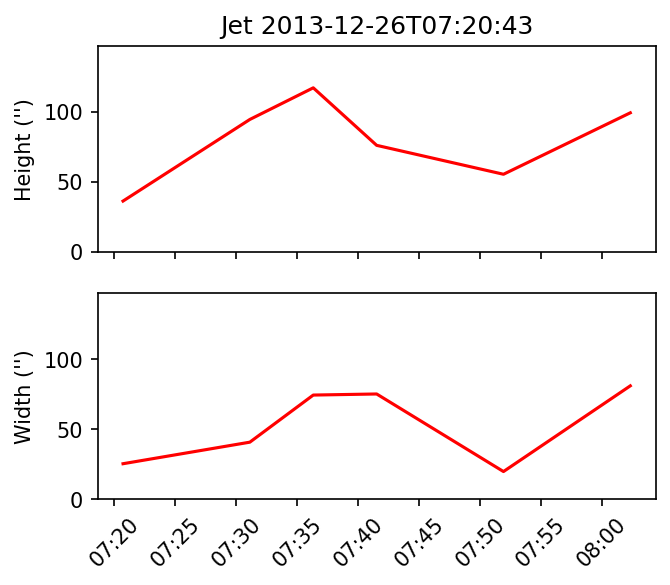

Jet start
Start base 376.227 -238.418
0.22118271340615778


/Users/pjol/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


In [6]:
ID=1
for C in Jet_clusters:
    print('Jet start')
    H=np.array([])
    W=np.array([])
    X=np.array([])
    Y=np.array([])
    sig=np.array([])
    obs_time=np.array([],dtype='datetime64')
    for j, jet in enumerate(C.jets):
        #print(j, len(C.jets))
        width_pair,height_pair=jet.get_width_height_pairs()
        #print(width_pair,height_pair)
        file=subject_file[subjects==jet.subject][0]
        Bx,By=solar_conversion(file,jet.start[0],jet.start[1])
        print('Start base',Bx,By)
        print(jet.sigma)
        sig=np.append(sig,jet.sigma)
        X=np.append(X,Bx)
        Y=np.append(Y,By)
        O=date[subjects==jet.subject][0]
        obs_time=np.append(obs_time,O)
        height=get_solar_distance(file,height_pair)
        width=get_solar_distance(file,width_pair)
        H=np.append(H,height)
        W=np.append(W,width)
    
    duration=(obs_time[-1]-obs_time[0])/np.timedelta64(1, 'm')
    vel=np.max(H)/((obs_time[np.argmax(H)]-obs_time[0])/ np.timedelta64(1, 's'))
    if np.isinf(vel)==True:
        vel=np.NaN
    
    C.adding_new_attr("ID",ID)
    C.adding_new_attr("Height",np.max(H))
    C.adding_new_attr("std_H",np.std(H))
    C.adding_new_attr("Width",np.average(W))
    C.adding_new_attr("std_W",np.std(W))
    C.adding_new_attr("Bx",np.average(X))
    C.adding_new_attr("std_Bx",np.std(X))
    C.adding_new_attr("By",np.average(Y))
    C.adding_new_attr("std_By",np.std(Y))
    C.adding_new_attr("obs_time",obs_time[0])
    C.adding_new_attr("sigma",np.average(sig))
    C.adding_new_attr("Duration",duration)
    C.adding_new_attr("Velocity",vel)
    
    
    if j>0:
        #jet_height_width_plot(C,C.ID,C.Height,C.Width,C.obs_time)
        jet_height_width_plot(C,ID,H,W,obs_time,save=False)
    ID+=1
    

In [7]:
import pickle 
os.chdir(path_old)
object_pi = Jet_clusters
file_pi = open('Jet_clusters_3.0_2.0', 'wb') 

pickle.dump(object_pi, file_pi)
file_pi.close()

In [8]:
file = open('Jet_clusters_3.0_2.0','rb')
Jet_clusters = pickle.load(file)
file.close()

'/Users/pjol/SolarJets/BoxTheJets'